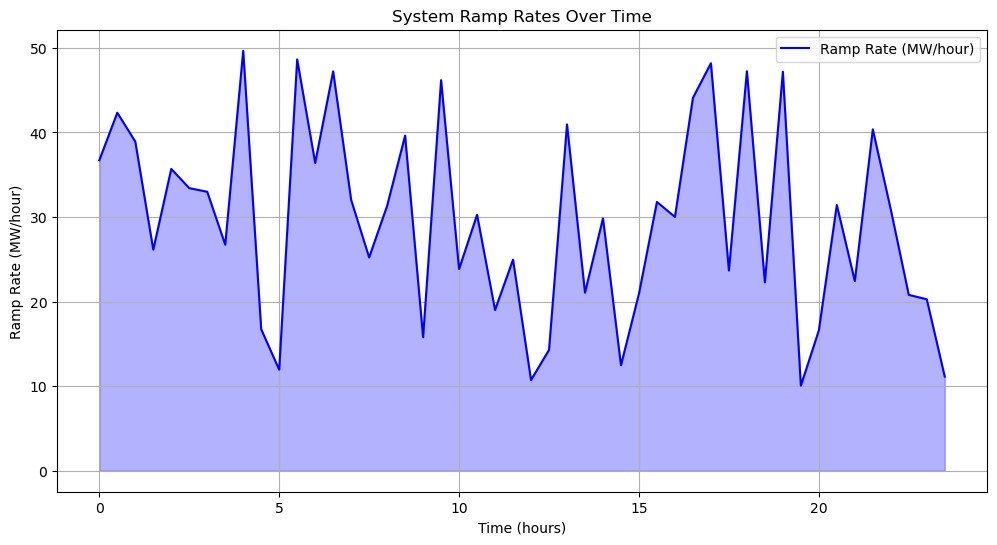

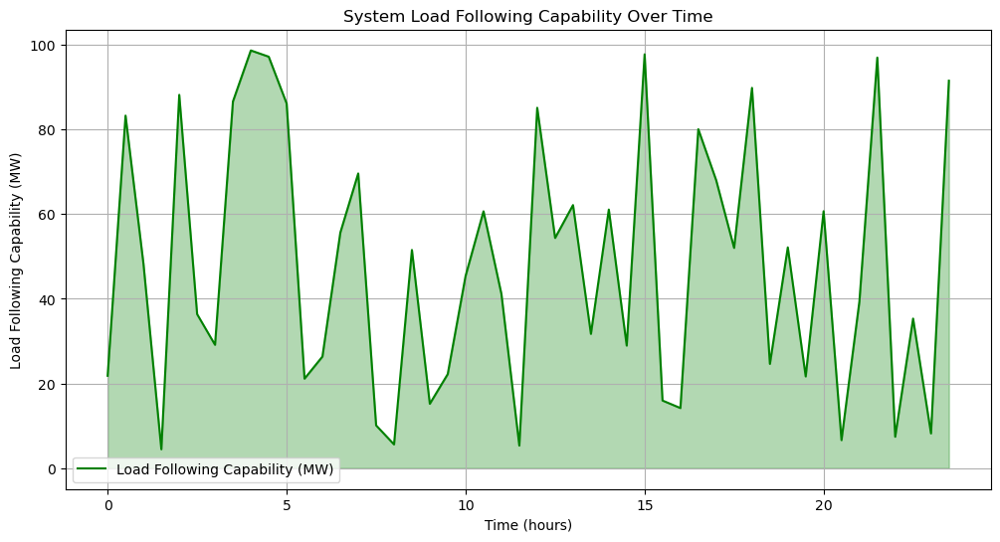

In [2]:
import matplotlib.pyplot as plt
import numpy as np

# Example data
time = np.arange(0, 24, 0.5)  # Time in hours
ramp_rates = np.random.uniform(10, 50, len(time))  # MW per hour
load_following = np.random.uniform(0, 100, len(time))  # MW

# Plotting ramp rates
plt.figure(figsize=(12, 6))
plt.plot(time, ramp_rates, label='Ramp Rate (MW/hour)', color='blue')
plt.fill_between(time, 0, ramp_rates, color='blue', alpha=0.3)
plt.xlabel('Time (hours)')
plt.ylabel('Ramp Rate (MW/hour)')
plt.title('System Ramp Rates Over Time')
plt.grid(True)
plt.legend()
plt.show()

# Plotting load following capability
plt.figure(figsize=(12, 6))
plt.plot(time, load_following, label='Load Following Capability (MW)', color='green')
plt.fill_between(time, 0, load_following, color='green', alpha=0.3)
plt.xlabel('Time (hours)')
plt.ylabel('Load Following Capability (MW)')
plt.title('System Load Following Capability Over Time')
plt.grid(True)
plt.legend()
plt.show()


In [1]:
pip install requests


Note: you may need to restart the kernel to use updated packages.


In [1]:
import requests

API_KEY = '255771c7e223415e9b9205541241910'
LOCATION = 'Upington'
url = f'http://api.weatherapi.com/v1/current.json?key={API_KEY}&q={LOCATION}'

def get_weather():
    response = requests.get(url)
    
    if response.status_code == 200:
        data = response.json()
        # Extract relevant information
        location = data['location']['name']
        temperature = data['current']['temp_c']
        condition = data['current']['condition']['text']
        
        print(f"Current weather in {location}:")
        print(f"Temperature: {temperature}°C")
        print(f"Condition: {condition}")
    else:
        print(f"Error: {response.status_code}")

if __name__ == "__main__":
    get_weather()


Current weather in Upington:
Temperature: 27.1°C
Condition: Partly cloudy


In [3]:
pip install matplotlib seaborn


  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)
Note: you may need to restart the kernel to use updated packages.


In [29]:
import pandas as pd

# Load historical weather and power data
weather_data = pd.read_csv('weather_data.csv')
power_data = pd.read_csv('power_data.csv')

# Convert the 'timestamp' column to pandas datetime for both datasets
weather_data['timestamp'] = pd.to_datetime(weather_data['timestamp'])
power_data['timestamp'] = pd.to_datetime(power_data['timestamp'])

# Merge the datasets based on the 'timestamp' column
data = pd.merge(weather_data, power_data, on='timestamp')

# Display the first few rows to check the merged data
print(data.head())


            timestamp  ghi  dni  dhi  temperature  wind_speed  power_output
0 2021-01-01 00:00:00  0.0  0.0  0.0     8.000000    3.745401           0.0
1 2021-01-01 01:00:00  0.0  0.0  0.0     8.323705    9.507143           0.0
2 2021-01-01 02:00:00  0.0  0.0  0.0     9.272759    7.319939           0.0
3 2021-01-01 03:00:00  0.0  0.0  0.0    10.782486    5.986585           0.0
4 2021-01-01 04:00:00  0.0  0.0  0.0    12.750000    1.560186           0.0


In [31]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import joblib

# Features from weather data and target from power data
features = ['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']  # Adjust based on your actual columns
target = 'power_output'  # This should be the target column from your power data

# Create the feature matrix X and target vector y
X = data[features]
y = data[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Random Forest model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Save the trained model to a .pkl file
joblib.dump(model, 'random_forest_model.pkl')

print("Model saved to random_forest_model.pkl")


Model saved to random_forest_model.pkl


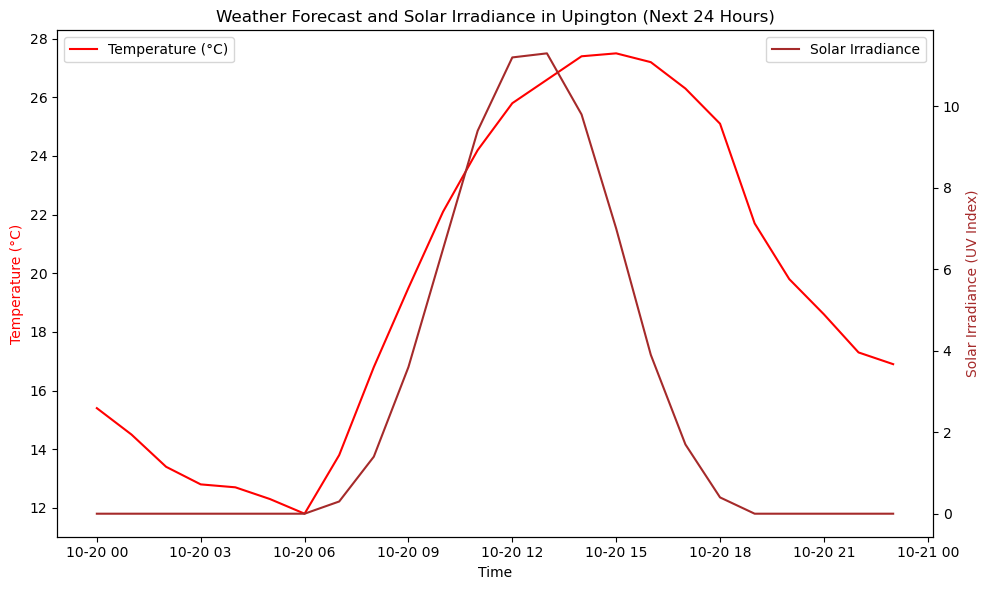

In [67]:
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

API_KEY = '255771c7e223415e9b9205541241910'
LOCATION = 'Upington'
HOURS = 24
url = f'http://api.weatherapi.com/v1/forecast.json?key={API_KEY}&q={LOCATION}&hours={HOURS}'

def get_weather_forecast():
    response = requests.get(url)
    
    if response.status_code == 200:
        data = response.json()
        forecast_hours = data['forecast']['forecastday'][0]['hour']
        
        # Extract relevant data for plotting
        times = [hour['time'] for hour in forecast_hours[:HOURS]]
        temps = [hour['temp_c'] for hour in forecast_hours[:HOURS]]
        conditions = [hour['condition']['text'] for hour in forecast_hours[:HOURS]]
        solar_irradiance = [hour['uv'] for hour in forecast_hours[:HOURS]]  # Approximation
        
        # Create a DataFrame for easy plotting
        df = pd.DataFrame({
            'Time': pd.to_datetime(times),  # Convert to datetime for better plotting
            'Temperature (°C)': temps,
            'Solar Irradiance': solar_irradiance,
            'Condition': conditions
        })
        
        # Plot temperature
        plt.figure(figsize=(10, 6))
        ax1 = plt.gca()
        line1 = sns.lineplot(data=df, x='Time', y='Temperature (°C)', ax=ax1, label='Temperature (°C)', color='r')
        
        # Create a second y-axis for solar irradiance
        ax2 = ax1.twinx()
        line2 = sns.lineplot(data=df, x='Time', y='Solar Irradiance', ax=ax2, label='Solar Irradiance', color='brown')
        
        # Set labels and title
        ax1.set_title(f'Weather Forecast and Solar Irradiance in {LOCATION} (Next {HOURS} Hours)')
        ax1.set_xlabel('Time')
        ax1.set_ylabel('Temperature (°C)', color='r')
        ax2.set_ylabel('Solar Irradiance (UV Index)', color='brown')
        
        # Rotate x-ticks for better visibility
        plt.xticks(rotation=45)
        
        # Add legends manually
        ax1.legend([line1.get_lines()[0]], ['Temperature (°C)'], loc='upper left')
        ax2.legend([line2.get_lines()[0]], ['Solar Irradiance'], loc='upper right')
        
        plt.tight_layout()
        plt.show()
        
    else:
        print(f"Error: {response.status_code}")

if __name__ == "__main__":
    get_weather_forecast()


In [69]:
import requests
import pandas as pd
import joblib  # For loading the trained Random Forest model

API_KEY = '255771c7e223415e9b9205541241910'
LOCATION = 'Upington'
HOURS = 24
url = f'http://api.weatherapi.com/v1/forecast.json?key={API_KEY}&q={LOCATION}&hours={HOURS}'

def get_weather_forecast():
    response = requests.get(url)
    
    if response.status_code == 200:
        data = response.json()
        forecast_hours = data['forecast']['forecastday'][0]['hour']
        
        # Extract data
        times = [hour['time'] for hour in forecast_hours[:HOURS]]
        temps = [hour['temp_c'] for hour in forecast_hours[:HOURS]]
        solar_irradiance = [hour['uv'] for hour in forecast_hours[:HOURS]]
        
        # Approximate missing features (here using simple placeholders)
        ghi = [uv * 100 for uv in solar_irradiance]  # Approximate GHI from UV index
        dni = [ghi_val * 0.001 for ghi_val in ghi]  # Approximate DNI
        dhi = [ghi_val * 0.001 for ghi_val in ghi]  # Approximate DHI
        wind_speed = [0 for _ in range(HOURS)]  # Placeholder for wind speed
        
        # Prepare DataFrame for model input
        df = pd.DataFrame({
            'timestamp': times,  # Add timestamps
            'ghi': ghi,
            'dni': dni,
            'dhi': dhi,
            'temperature': temps,
            'wind_speed': wind_speed
        })
        
        return df
    else:
        print(f"Error: {response.status_code}")
        return None

def predict_solar_power(df):
    # Load your pre-trained Random Forest model
    model = joblib.load('random_forest_model.pkl')
    
    # Make predictions using all the required features
    predictions = model.predict(df[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']])
    
    # Combine predictions with timestamps for display
    df['Predicted Solar Output'] = predictions
    
    print("Predicted Solar Output (Next 24 Hours):")
    print(df[['timestamp', 'Predicted Solar Output']])
    
    return df

if __name__ == "__main__":  
    df_weather = get_weather_forecast()
    if df_weather is not None:
        predict_solar_power(df_weather)


Predicted Solar Output (Next 24 Hours):
           timestamp  Predicted Solar Output
0   2024-10-20 00:00                0.000000
1   2024-10-20 01:00                0.000000
2   2024-10-20 02:00                0.000000
3   2024-10-20 03:00                0.000000
4   2024-10-20 04:00                0.000000
5   2024-10-20 05:00                0.000000
6   2024-10-20 06:00                0.000000
7   2024-10-20 07:00                1.450000
8   2024-10-20 08:00                4.750000
9   2024-10-20 09:00               38.550000
10  2024-10-20 10:00              225.875159
11  2024-10-20 11:00              268.789680
12  2024-10-20 12:00              203.287246
13  2024-10-20 13:00              203.524205
14  2024-10-20 14:00              346.689200
15  2024-10-20 15:00              346.689200
16  2024-10-20 16:00              348.926300
17  2024-10-20 17:00              191.480075
18  2024-10-20 18:00              192.372616
19  2024-10-20 19:00              195.494603
20  2024-10-20 

In [71]:
import requests
import pandas as pd
import joblib  # For loading the trained Random Forest model

API_KEY = '255771c7e223415e9b9205541241910'
LOCATION = 'Upington'
HOURS = 24
url = f'http://api.weatherapi.com/v1/forecast.json?key={API_KEY}&q={LOCATION}&hours={HOURS}'

def get_weather_forecast():
    response = requests.get(url)
    
    if response.status_code == 200:
        data = response.json()
        forecast_hours = data['forecast']['forecastday'][0]['hour']
        
        # Extract data
        times = [hour['time'] for hour in forecast_hours[:HOURS]]
        temps = [hour['temp_c'] for hour in forecast_hours[:HOURS]]
        uv_index = [hour['uv'] for hour in forecast_hours[:HOURS]]
        
        # Approximate GHI from UV index (using 25-30 W/m² conversion)
        ghi = [uv * 27.5 for uv in uv_index]  # Using midpoint 27.5 W/m² as conversion factor
        
        # Approximate DNI and DHI based on GHI (as placeholders)
        dni = [ghi_val * 0.8 for ghi_val in ghi]  # Approximate DNI
        dhi = [ghi_val * 0.2 for ghi_val in ghi]  # Approximate DHI
        wind_speed = [0 for _ in range(HOURS)]  # Placeholder for wind speed
        
        # Prepare DataFrame for model input
        df = pd.DataFrame({
            'timestamp': times,  # Add timestamps
            'ghi': ghi,
            'dni': dni,
            'dhi': dhi,
            'temperature': temps,
            'wind_speed': wind_speed
        })
        
        return df
    else:
        print(f"Error: {response.status_code}")
        return None

def predict_solar_power(df):
    # Load your pre-trained Random Forest model
    model = joblib.load('random_forest_model.pkl')
    
    # Make predictions using all the required features
    predictions = model.predict(df[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']])
    
    # Combine predictions with timestamps for display
    df['Predicted Solar Output'] = predictions
    
    print("Predicted Solar Output (Next 24 Hours):")
    print(df[['timestamp', 'Predicted Solar Output']])
    
    return df

if __name__ == "__main__":  
    df_weather = get_weather_forecast()
    if df_weather is not None:
        predict_solar_power(df_weather)


Predicted Solar Output (Next 24 Hours):
           timestamp  Predicted Solar Output
0   2024-10-20 00:00                0.000000
1   2024-10-20 01:00                0.000000
2   2024-10-20 02:00                0.000000
3   2024-10-20 03:00                0.000000
4   2024-10-20 04:00                0.000000
5   2024-10-20 05:00                0.000000
6   2024-10-20 06:00                0.000000
7   2024-10-20 07:00                5.300000
8   2024-10-20 08:00               15.000000
9   2024-10-20 09:00              193.750000
10  2024-10-20 10:00              337.210939
11  2024-10-20 11:00              381.208282
12  2024-10-20 12:00              273.395236
13  2024-10-20 13:00              256.180135
14  2024-10-20 14:00              517.189200
15  2024-10-20 15:00              511.223600
16  2024-10-20 16:00              512.715000
17  2024-10-20 17:00              268.486765
18  2024-10-20 18:00              255.360461
19  2024-10-20 19:00              195.494603
20  2024-10-20 

In [1]:
import requests
import pandas as pd
import joblib  # For loading the trained Random Forest model

API_KEY = '255771c7e223415e9b9205541241910'
LOCATION = 'Upington'
DAYS = 1  # Request data for 1 day (24 hours)
url = f'http://api.weatherapi.com/v1/forecast.json?key={API_KEY}&q={LOCATION}&days={DAYS}'

def get_weather_forecast():
    try:
        response = requests.get(url)
        response.raise_for_status()  # Raise an error for bad responses
        data = response.json()

        # Ensure the forecast data is available
        if 'forecast' in data and 'forecastday' in data['forecast']:
            forecast_hours = data['forecast']['forecastday'][0]['hour']
            
            # Extract data
            times = [hour['time'] for hour in forecast_hours]
            temps = [hour['temp_c'] for hour in forecast_hours]
            uv_index = [hour['uv'] for hour in forecast_hours]
            wind_speed = [hour['wind_kph'] for hour in forecast_hours]  # Get wind speed
            
            # Approximate GHI from UV index 
            ghi = [uv * 10 for uv in uv_index] 
            
            # Approximate DNI and DHI based on GHI (as placeholders)
            dni = [ghi_val * 0.8 for ghi_val in ghi]  # Approximate DNI
            dhi = [ghi_val * 0.2 for ghi_val in ghi]  # Approximate DHI
            
            # Prepare DataFrame for model input
            df = pd.DataFrame({
                'timestamp': times,
                'ghi': ghi,
                'dni': dni,
                'dhi': dhi,
                'temperature': temps,
                'wind_speed': wind_speed
            })
            
            return df
        else:
            print("Forecast data not available in the response.")
            return None
    except requests.exceptions.RequestException as e:
        print(f"Error fetching weather data: {e}")
        return None

def predict_solar_power(df):
    # Load your pre-trained Random Forest model
    model = joblib.load('random_forest_model.pkl')
    
    # Make predictions using all the required features
    predictions = model.predict(df[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']])
    
    # Combine predictions with timestamps for display
    df['Predicted Solar Output'] = predictions
    
    print("Predicted Solar Output (Next 24 Hours):")
    print(df[['timestamp', 'Predicted Solar Output']])
    
    return df

if __name__ == "__main__":  
    df_weather = get_weather_forecast()
    if df_weather is not None:
        predict_solar_power(df_weather)


Predicted Solar Output (Next 24 Hours):
           timestamp  Predicted Solar Output
0   2024-10-23 00:00                0.000000
1   2024-10-23 01:00                0.000000
2   2024-10-23 02:00                0.000000
3   2024-10-23 03:00                0.000000
4   2024-10-23 04:00                0.000000
5   2024-10-23 05:00                0.000000
6   2024-10-23 06:00                0.000000
7   2024-10-23 07:00                0.600000
8   2024-10-23 08:00               66.000000
9   2024-10-23 09:00              338.241975
10  2024-10-23 10:00              306.494270
11  2024-10-23 11:00              502.275200
12  2024-10-23 12:00              501.529500
13  2024-10-23 13:00              501.529500
14  2024-10-23 14:00              501.529500
15  2024-10-23 15:00              502.275200
16  2024-10-23 16:00              502.275200
17  2024-10-23 17:00              492.020900
18  2024-10-23 18:00              330.934900
19  2024-10-23 19:00              183.935381
20  2024-10-23 

Length of timestamp: 24
Length of Predicted Solar Output: 24


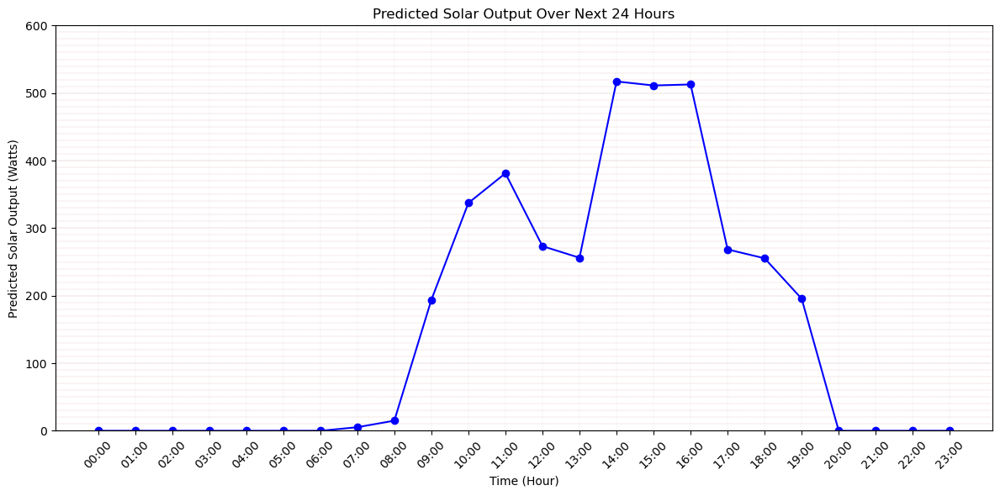

In [47]:
import matplotlib.pyplot as plt
import pandas as pd

# Create a DataFrame with the provided data
data = {
    'timestamp': [
        '2024-10-20 00:00', '2024-10-20 01:00', '2024-10-20 02:00', 
        '2024-10-20 03:00', '2024-10-20 04:00', '2024-10-20 05:00', 
        '2024-10-20 06:00', '2024-10-20 07:00', '2024-10-20 08:00', 
        '2024-10-20 09:00', '2024-10-20 10:00', '2024-10-20 11:00', 
        '2024-10-20 12:00', '2024-10-20 13:00', '2024-10-20 14:00', 
        '2024-10-20 15:00', '2024-10-20 16:00', '2024-10-20 17:00', 
        '2024-10-20 18:00', '2024-10-20 19:00', '2024-10-20 20:00', 
        '2024-10-20 21:00', '2024-10-20 22:00', '2024-10-20 23:00'
    ],
    'Predicted Solar Output': [
        0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.3, 15.0, 
        193.75, 337.21, 381.21, 273.40, 256.18, 517.19, 
        511.22, 512.72, 268.49, 255.36, 195.49, 0.0, 
        0.0, 0.0, 0.0,
    ]
}

# Check if lengths match
print(f"Length of timestamp: {len(data['timestamp'])}")
print(f"Length of Predicted Solar Output: {len(data['Predicted Solar Output'])}")

# Create a DataFrame
df = pd.DataFrame(data)

# Convert the timestamp to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Plotting the data
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['Predicted Solar Output'], marker='o', linestyle='-', color='b')
plt.title('Predicted Solar Output Over Next 24 Hours')
plt.xlabel('Time (Hour)')
plt.ylabel('Predicted Solar Output (Watts)')
plt.xticks(df['timestamp'], rotation=45)  # Rotate x-tick labels for better visibility
plt.grid(True, which='both', linestyle='--', linewidth=0.1)  # Add grid lines

# Set y-axis limits to focus on 0-300 watts
plt.ylim(0, 600)

# Set x-ticks to every hour
plt.xticks(df['timestamp'], [t.strftime('%H:%M') for t in df['timestamp']], rotation=45)

# Additional grid lines for better visibility within the specified range
for y in range(0, 600, 10):  # Add grid lines every 10 watts
    plt.axhline(y=y, color='brown', linestyle='--', linewidth=0.1)

plt.tight_layout()
plt.show()


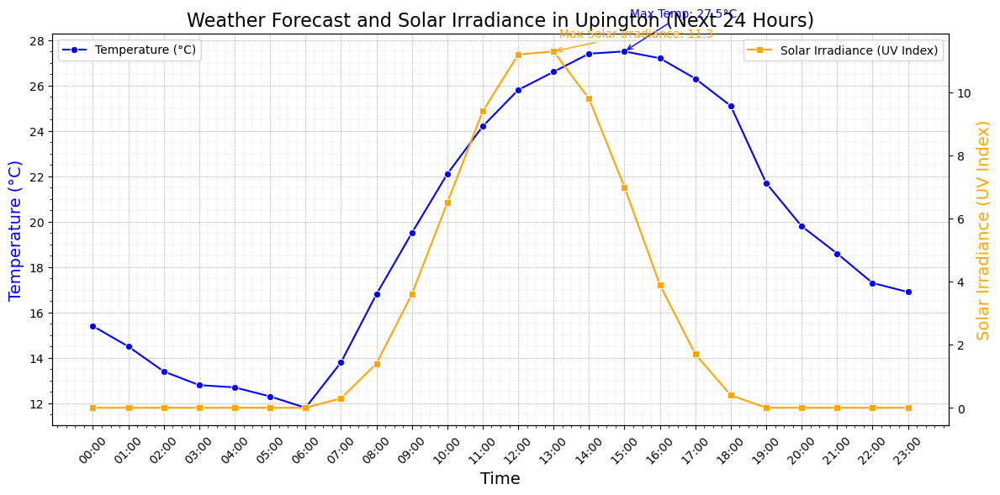

In [75]:
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

API_KEY = '255771c7e223415e9b9205541241910'
LOCATION = 'Upington'
HOURS = 24
url = f'http://api.weatherapi.com/v1/forecast.json?key={API_KEY}&q={LOCATION}&hours={HOURS}'

def get_weather_forecast():
    response = requests.get(url)
    
    if response.status_code == 200:
        data = response.json()
        forecast_hours = data['forecast']['forecastday'][0]['hour']
        
        # Extract relevant data for plotting
        times = [hour['time'] for hour in forecast_hours[:HOURS]]
        temps = [hour['temp_c'] for hour in forecast_hours[:HOURS]]
        conditions = [hour['condition']['text'] for hour in forecast_hours[:HOURS]]
        solar_irradiance = [hour['uv'] for hour in forecast_hours[:HOURS]]  # Approximation
        
        # Create a DataFrame for easy plotting
        df = pd.DataFrame({
            'Time': pd.to_datetime(times),  # Convert to datetime for better plotting
            'Temperature (°C)': temps,
            'Solar Irradiance': solar_irradiance,
            'Condition': conditions
        })
        
        # Plot temperature
        plt.figure(figsize=(12, 6))
        ax1 = plt.gca()
        line1 = sns.lineplot(data=df, x='Time', y='Temperature (°C)', ax=ax1, label='Temperature (°C)', color='b', marker='o')
        
        # Create a second y-axis for solar irradiance
        ax2 = ax1.twinx()
        line2 = sns.lineplot(data=df, x='Time', y='Solar Irradiance', ax=ax2, label='Solar Irradiance (UV Index)', color='orange', marker='s')
        
        # Set labels and title
        ax1.set_title(f'Weather Forecast and Solar Irradiance in {LOCATION} (Next {HOURS} Hours)', fontsize=16)
        ax1.set_xlabel('Time', fontsize=14)
        ax1.set_ylabel('Temperature (°C)', color='b', fontsize=14)
        ax2.set_ylabel('Solar Irradiance (UV Index)', color='orange', fontsize=14)
        
        # Customize ticks and grid
        ax1.set_xticks(df['Time'])  # Set x-ticks to match time intervals
        ax1.set_xticklabels(df['Time'].dt.strftime('%H:%M'), rotation=45)
        
        ax1.grid(True, which='both', linestyle='--', linewidth=0.5)  # Add grid lines
        ax1.minorticks_on()
        ax1.grid(True, which='minor', linestyle=':', linewidth=0.3)  # Minor grid lines
        
        # Add legends manually
        ax1.legend(loc='upper left')
        ax2.legend(loc='upper right')
        
        # Annotate some key points
        max_temp = df['Temperature (°C)'].max()
        max_irrad = df['Solar Irradiance'].max()
        
        ax1.annotate(f'Max Temp: {max_temp}°C', xy=(df['Time'][df['Temperature (°C)'].idxmax()], max_temp),
                     xytext=(5, max_temp+2), textcoords='offset points',
                     arrowprops=dict(arrowstyle='->', color='b'), color='b', fontsize=10)
        
        ax2.annotate(f'Max Solar Irradiance: {max_irrad}', xy=(df['Time'][df['Solar Irradiance'].idxmax()], max_irrad),
                     xytext=(5, max_irrad+1), textcoords='offset points',
                     arrowprops=dict(arrowstyle='->', color='orange'), color='orange', fontsize=10)

        plt.tight_layout()
        plt.show()
        
    else:
        print(f"Error: {response.status_code}")

if __name__ == "__main__":
    get_weather_forecast()


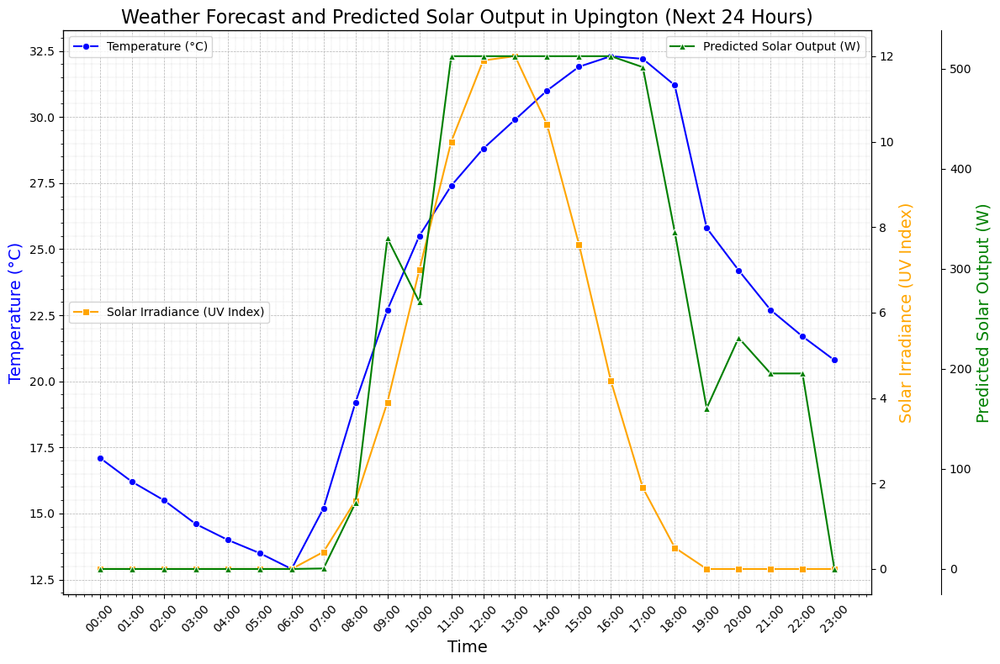

In [15]:
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import joblib  # For loading the trained Random Forest model

API_KEY = '255771c7e223415e9b9205541241910'
LOCATION = 'Upington'
HOURS = 24
url = f'http://api.weatherapi.com/v1/forecast.json?key={API_KEY}&q={LOCATION}&hours={HOURS}'

# Load the pre-trained Random Forest model
model = joblib.load('random_forest_model.pkl')

def get_weather_forecast():
    response = requests.get(url)
    
    if response.status_code == 200:
        data = response.json()
        forecast_hours = data['forecast']['forecastday'][0]['hour']
        
        # Extract relevant data for plotting
        times = [hour['time'] for hour in forecast_hours[:HOURS]]
        temps = [hour['temp_c'] for hour in forecast_hours[:HOURS]]
        solar_irradiance = [hour['uv'] for hour in forecast_hours[:HOURS]]  # Approximation
        
        # Approximate GHI from UV index 
        ghi = [uv * 10 for uv in solar_irradiance]  # Using midpoint Irradiance (W/m²) ≈ UV index * 10 W/m²
        dni = [g * 0.8 for g in ghi]  # Approximate DNI
        dhi = [g * 0.2 for g in ghi]  # Approximate DHI
        wind_speed = [0 for _ in range(HOURS)]  # Placeholder for wind speed
        
        # Prepare DataFrame for model input
        df_weather = pd.DataFrame({
            'timestamp': pd.to_datetime(times),  # Convert to datetime
            'ghi': ghi,
            'dni': dni,
            'dhi': dhi,
            'temperature': temps,
            'wind_speed': wind_speed
        })

        # Predict solar output using the model
        df_weather['Predicted Solar Output'] = model.predict(df_weather[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']])

        # Create a DataFrame for easy plotting
        df = pd.DataFrame({
            'Time': df_weather['timestamp'],
            'Temperature (°C)': temps,
            'Solar Irradiance': solar_irradiance,
            'Predicted Solar Output': df_weather['Predicted Solar Output']
        })
        
        # Plotting
        plt.figure(figsize=(12, 8))
        ax1 = plt.gca()

        # Plot temperature
        line1 = sns.lineplot(data=df, x='Time', y='Temperature (°C)', ax=ax1, label='Temperature (°C)', color='b', marker='o')
        
        # Create a second y-axis for solar irradiance
        ax2 = ax1.twinx()
        line2 = sns.lineplot(data=df, x='Time', y='Solar Irradiance', ax=ax2, label='Solar Irradiance (UV Index)', color='orange', marker='s')
        
        # Create a third y-axis for predicted solar output
        ax3 = ax1.twinx()
        ax3.spines['right'].set_position(('outward', 60))  # Move the third axis outward
        line3 = sns.lineplot(data=df, x='Time', y='Predicted Solar Output', ax=ax3, label='Predicted Solar Output (W)', color='g', marker='^')

        # Set labels and title
        ax1.set_title(f'Weather Forecast and Predicted Solar Output in {LOCATION} (Next {HOURS} Hours)', fontsize=16)
        ax1.set_xlabel('Time', fontsize=14)
        ax1.set_ylabel('Temperature (°C)', color='b', fontsize=14)
        ax2.set_ylabel('Solar Irradiance (UV Index)', color='orange', fontsize=14)
        ax3.set_ylabel('Predicted Solar Output (W)', color='g', fontsize=14)

        # Customize ticks and grid
        ax1.set_xticks(df['Time'])  # Set x-ticks to match time intervals
        ax1.set_xticklabels(df['Time'].dt.strftime('%H:%M'), rotation=45)
        
        ax1.grid(True, which='both', linestyle='--', linewidth=0.5)  # Add grid lines
        ax1.minorticks_on()
        ax1.grid(True, which='minor', linestyle=':', linewidth=0.3)  # Minor grid lines

        # Add legends manually
        ax1.legend(loc='upper left')
        ax2.legend(loc='center left')
        ax3.legend(loc='upper right')

        # Annotate some key points
        max_temp = df['Temperature (°C)'].max()
        max_irrad = df['Solar Irradiance'].max()
        max_output = df['Predicted Solar Output'].max()
        
        

        plt.tight_layout()
        plt.show()
        
    else:
        print(f"Error: {response.status_code}")

if __name__ == "__main__":
    get_weather_forecast()


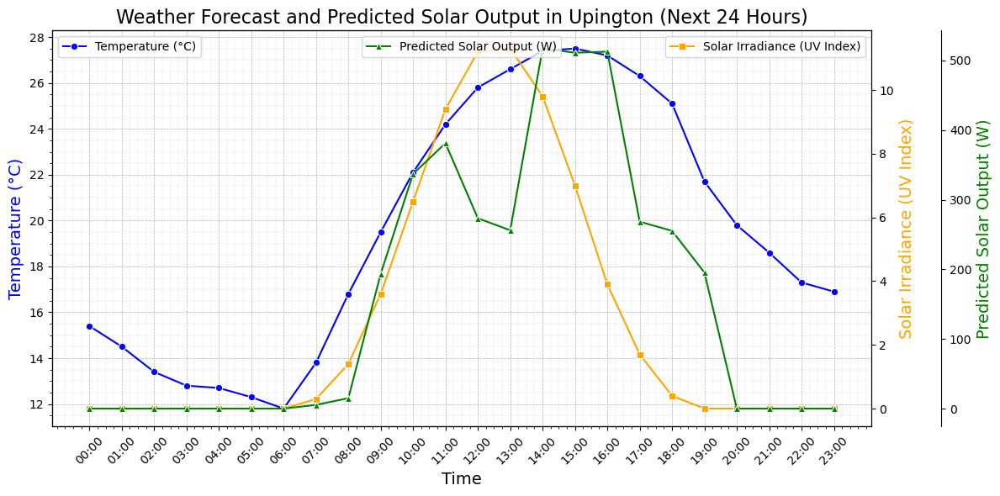

KeyboardInterrupt: 

In [91]:
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import joblib  # For loading the trained Random Forest model
import time  # For sleep function

API_KEY = '255771c7e223415e9b9205541241910'
LOCATION = 'Upington'
HOURS = 24
url = f'http://api.weatherapi.com/v1/forecast.json?key={API_KEY}&q={LOCATION}&hours={HOURS}'

# Load the pre-trained Random Forest model
model = joblib.load('random_forest_model.pkl')

def get_weather_forecast():
    response = requests.get(url)
    
    if response.status_code == 200:
        data = response.json()
        forecast_hours = data['forecast']['forecastday'][0]['hour']
        
        # Extract relevant data for plotting
        times = [hour['time'] for hour in forecast_hours[:HOURS]]
        temps = [hour['temp_c'] for hour in forecast_hours[:HOURS]]
        solar_irradiance = [hour['uv'] for hour in forecast_hours[:HOURS]]  # Approximation
        
        # Approximate GHI from UV index (using 25-30 W/m² conversion)
        ghi = [uv * 27.5 for uv in solar_irradiance]  # Using midpoint 27.5 W/m² as conversion factor
        dni = [g * 0.8 for g in ghi]  # Approximate DNI
        dhi = [g * 0.2 for g in ghi]  # Approximate DHI
        wind_speed = [0 for _ in range(HOURS)]  # Placeholder for wind speed
        
        # Prepare DataFrame for model input
        df_weather = pd.DataFrame({
            'timestamp': pd.to_datetime(times),  # Convert to datetime
            'ghi': ghi,
            'dni': dni,
            'dhi': dhi,
            'temperature': temps,
            'wind_speed': wind_speed
        })

        # Predict solar output using the model
        df_weather['Predicted Solar Output'] = model.predict(df_weather[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']])

        # Create a DataFrame for easy plotting
        df = pd.DataFrame({
            'Time': df_weather['timestamp'],
            'Temperature (°C)': temps,
            'Solar Irradiance': solar_irradiance,
            'Predicted Solar Output': df_weather['Predicted Solar Output']
        })
        
        # Plotting
        plt.figure(figsize=(12, 6))
        ax1 = plt.gca()

        # Plot temperature
        line1 = sns.lineplot(data=df, x='Time', y='Temperature (°C)', ax=ax1, label='Temperature (°C)', color='b', marker='o')
        
        # Create a second y-axis for solar irradiance
        ax2 = ax1.twinx()
        line2 = sns.lineplot(data=df, x='Time', y='Solar Irradiance', ax=ax2, label='Solar Irradiance (UV Index)', color='orange', marker='s')
        
        # Create a third y-axis for predicted solar output
        ax3 = ax1.twinx()
        ax3.spines['right'].set_position(('outward', 60))  # Move the third axis outward
        line3 = sns.lineplot(data=df, x='Time', y='Predicted Solar Output', ax=ax3, label='Predicted Solar Output (W)', color='g', marker='^')

        # Set labels and title
        ax1.set_title(f'Weather Forecast and Predicted Solar Output in {LOCATION} (Next {HOURS} Hours)', fontsize=16)
        ax1.set_xlabel('Time', fontsize=14)
        ax1.set_ylabel('Temperature (°C)', color='b', fontsize=14)
        ax2.set_ylabel('Solar Irradiance (UV Index)', color='orange', fontsize=14)
        ax3.set_ylabel('Predicted Solar Output (W)', color='g', fontsize=14)

        # Customize ticks and grid
        ax1.set_xticks(df['Time'])  # Set x-ticks to match time intervals
        ax1.set_xticklabels(df['Time'].dt.strftime('%H:%M'), rotation=45)
        
        ax1.grid(True, which='both', linestyle='--', linewidth=0.5)  # Add grid lines
        ax1.minorticks_on()
        ax1.grid(True, which='minor', linestyle=':', linewidth=0.3)  # Minor grid lines

        # Add legends manually
        ax1.legend(loc='upper left')
        ax2.legend(loc='upper right')
        ax3.legend(loc='upper center')

    
        plt.tight_layout()
        plt.show()
        
    else:
        print(f"Error: {response.status_code}")

if __name__ == "__main__":
    while True:  # Infinite loop to repeat every 60 seconds
        get_weather_forecast()
        time.sleep(60)  # Wait for 1 second 


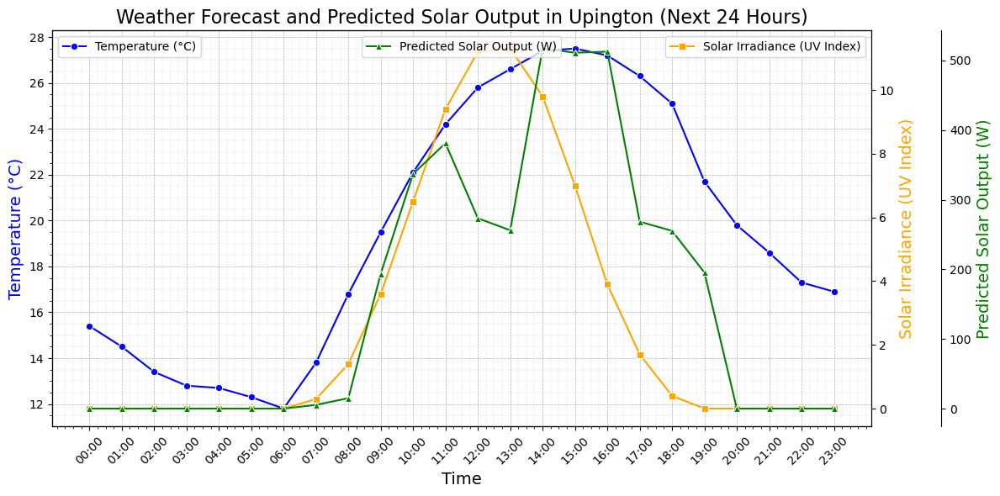

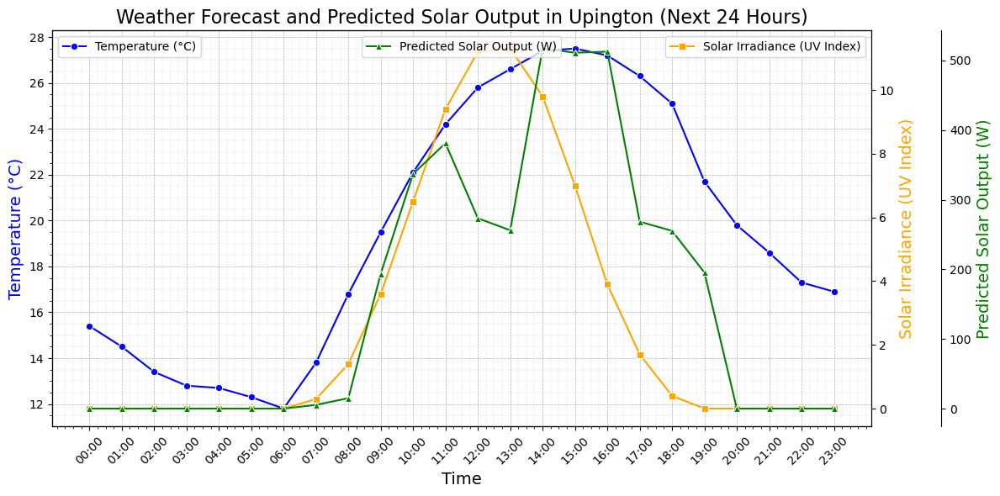

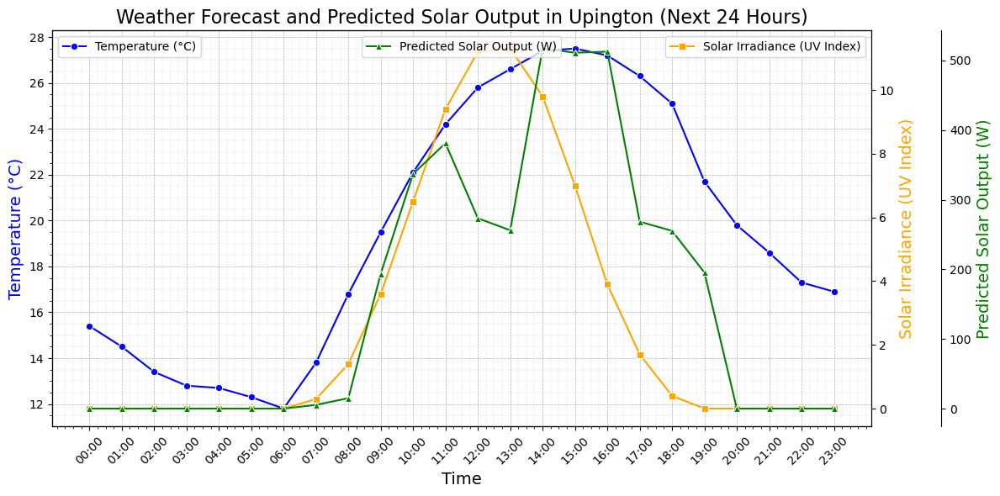

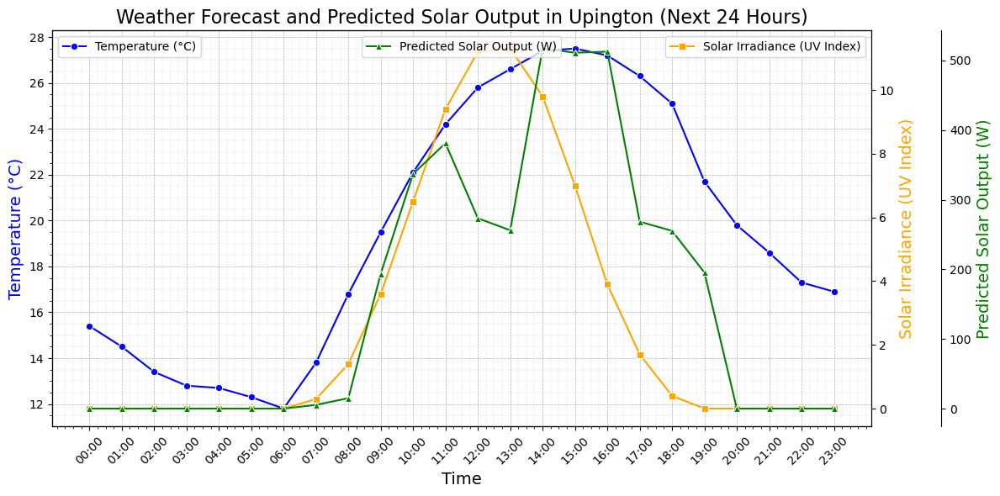

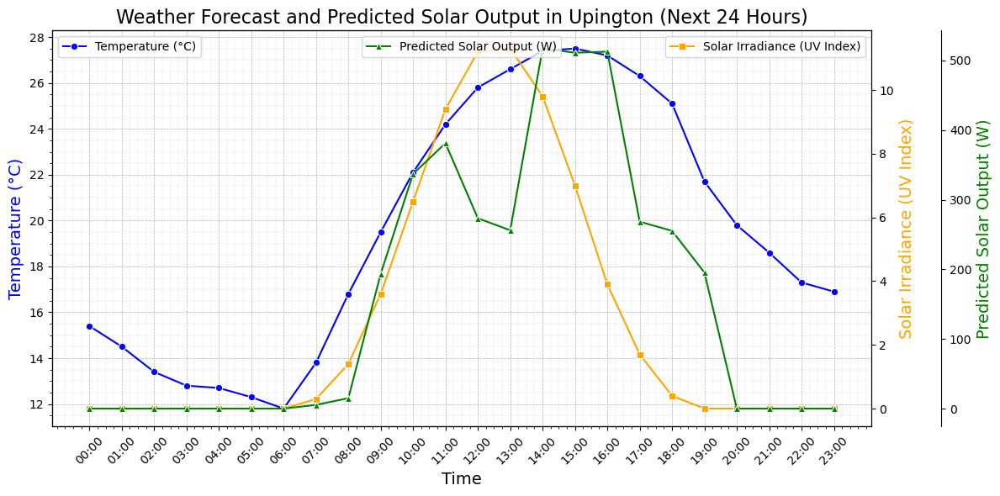

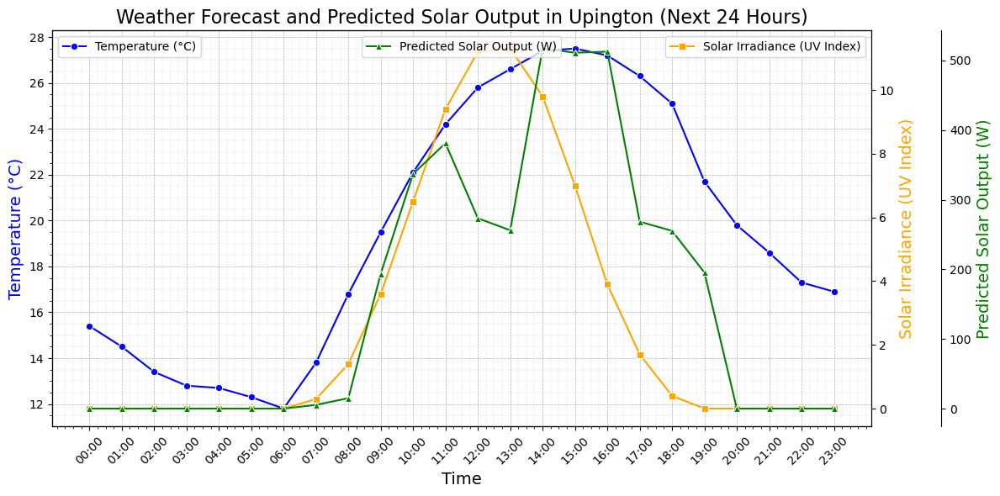

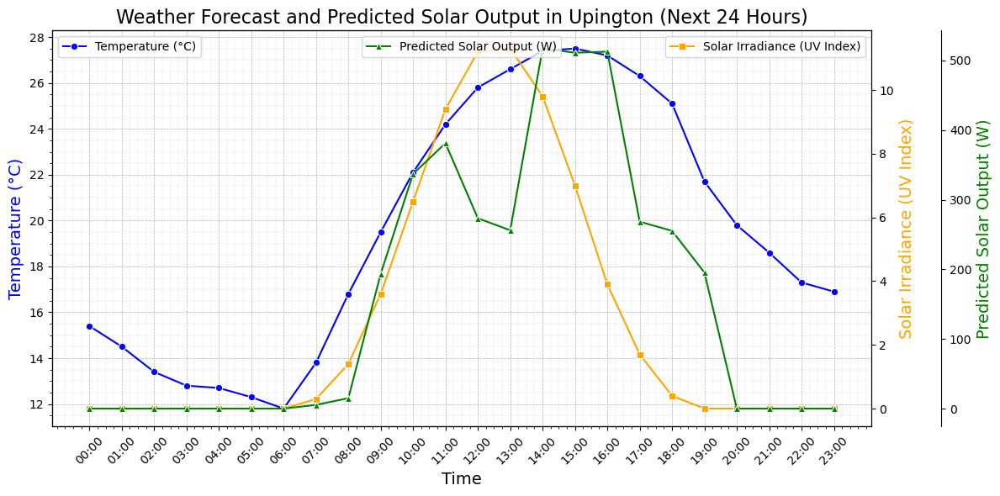

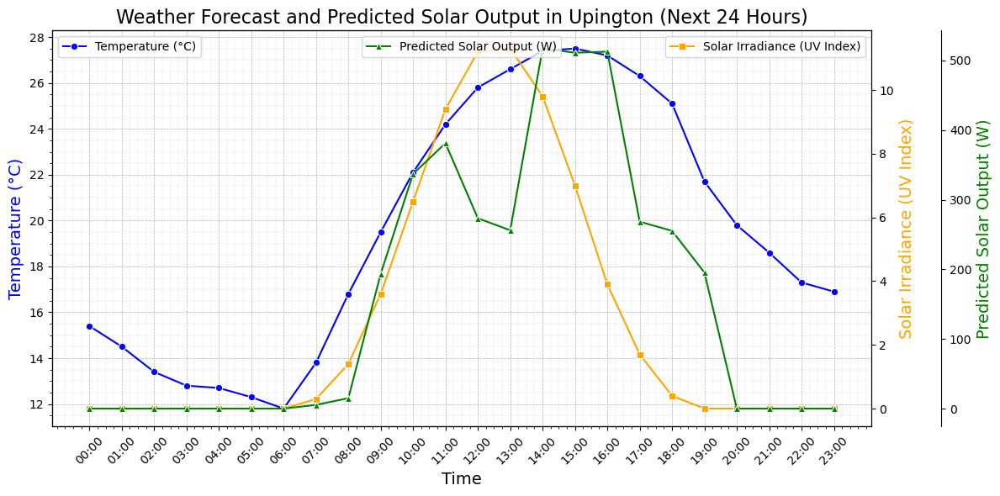

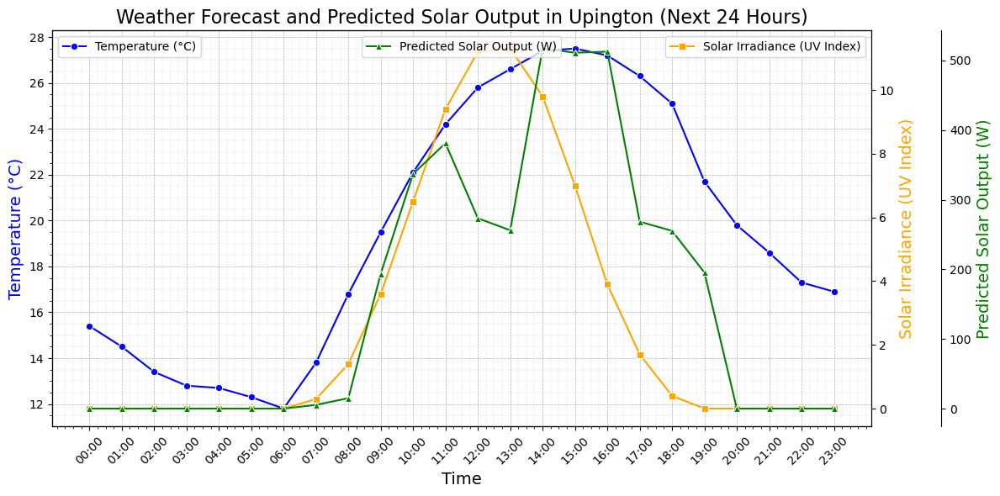

KeyboardInterrupt: 

In [54]:
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import joblib  # For loading the trained Random Forest model
import time  # For sleep function
import os  # For file handling

API_KEY = '255771c7e223415e9b9205541241910'
LOCATION = 'Upington'
HOURS = 48  # Request data for 48 hours
url = f'http://api.weatherapi.com/v1/forecast.json?key={API_KEY}&q={LOCATION}&hours={HOURS}'

# Load the pre-trained Random Forest model
model = joblib.load('random_forest_model.pkl')

# File to store weather data
data_file = 'weather_data.csv'

def get_weather_forecast():
    global HOURS  # Declare HOURS as global to modify its value

    response = requests.get(url)
    
    if response.status_code == 200:
        data = response.json()
        forecast_hours = data['forecast']['forecastday'][0]['hour']
        
        # Check if we have enough data for the requested hours
        if len(forecast_hours) < HOURS:
            print(f"Warning: Only {len(forecast_hours)} hours of data available.")
            HOURS = len(forecast_hours)

        # Extract relevant data for plotting
        times = [hour['time'] for hour in forecast_hours[:HOURS]]
        temps = [hour['temp_c'] for hour in forecast_hours[:HOURS]]
        solar_irradiance = [hour['uv'] for hour in forecast_hours[:HOURS]]  # Approximation
        
        # Approximate GHI from UV index (using 25-30 W/m² conversion)
        ghi = [uv * 27.5 for uv in solar_irradiance]  # Using midpoint 27.5 W/m² as conversion factor
        dni = [g * 0.8 for g in ghi]  # Approximate DNI
        dhi = [g * 0.2 for g in ghi]  # Approximate DHI
        wind_speed = [0 for _ in range(HOURS)]  # Placeholder for wind speed
        
        # Prepare DataFrame for model input
        df_weather = pd.DataFrame({
            'timestamp': pd.to_datetime(times),  # Convert to datetime
            'ghi': ghi,
            'dni': dni,
            'dhi': dhi,
            'temperature': temps,
            'wind_speed': wind_speed
        })

        # Ensure all columns have the same length
        if any(len(arr) != HOURS for arr in [ghi, dni, dhi, temps]):
            print("Error: Inconsistent data lengths.")
            return

        # Predict solar output using the model
        df_weather['Predicted Solar Output'] = model.predict(df_weather[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']])

        # Create a DataFrame for easy plotting
        df = pd.DataFrame({
            'Time': df_weather['timestamp'],
            'Temperature (°C)': temps,
            'Solar Irradiance': solar_irradiance,
            'Predicted Solar Output': df_weather['Predicted Solar Output']
        })
        
        # Save data to CSV
        if os.path.exists(data_file):
            df.to_csv(data_file, mode='a', header=False, index=False)
        else:
            df.to_csv(data_file, index=False)

        # Plotting
        plt.figure(figsize=(12, 6))
        ax1 = plt.gca()

        # Plot temperature
        line1 = sns.lineplot(data=df, x='Time', y='Temperature (°C)', ax=ax1, label='Temperature (°C)', color='b', marker='o')
        
        # Create a second y-axis for solar irradiance
        ax2 = ax1.twinx()
        line2 = sns.lineplot(data=df, x='Time', y='Solar Irradiance', ax=ax2, label='Solar Irradiance (UV Index)', color='orange', marker='s')
        
        # Create a third y-axis for predicted solar output
        ax3 = ax1.twinx()
        ax3.spines['right'].set_position(('outward', 60))  # Move the third axis outward
        line3 = sns.lineplot(data=df, x='Time', y='Predicted Solar Output', ax=ax3, label='Predicted Solar Output (W)', color='g', marker='^')

        # Set labels and title
        ax1.set_title(f'Weather Forecast and Predicted Solar Output in {LOCATION} (Next {HOURS} Hours)', fontsize=16)
        ax1.set_xlabel('Time', fontsize=14)
        ax1.set_ylabel('Temperature (°C)', color='b', fontsize=14)
        ax2.set_ylabel('Solar Irradiance (UV Index)', color='orange', fontsize=14)
        ax3.set_ylabel('Predicted Solar Output (W)', color='g', fontsize=14)

        # Customize ticks and grid
        ax1.set_xticks(df['Time'])  # Set x-ticks to match time intervals
        ax1.set_xticklabels(df['Time'].dt.strftime('%H:%M'), rotation=45)
        
        ax1.grid(True, which='both', linestyle='--', linewidth=0.5)  # Add grid lines
        ax1.minorticks_on()
        ax1.grid(True, which='minor', linestyle=':', linewidth=0.3)  # Minor grid lines

        # Add legends manually
        ax1.legend(loc='upper left')
        ax2.legend(loc='upper right')
        ax3.legend(loc='upper center')

        plt.tight_layout()
        plt.show()
        
    else:
        print(f"Error: {response.status_code}")

if __name__ == "__main__":
    while True:  # Infinite loop to repeat every 5 minutes
        get_weather_forecast()
        time.sleep(10)  # Wait for 5 minutes (300 seconds)


In [19]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

# Load data
features = pd.read_csv('weather_data.csv')
target = pd.read_csv('power_data.csv')
data = features.merge(target, on='timestamp', how='inner')

# Prepare input features and target variable
X = data[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']].values
y = data['power_output'].values

# Scale the data
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y.reshape(-1, 1))

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42)

# Build the model with more layers, dropout, and reduced learning rate
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1)
])

# Learning rate scheduler
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=10000,
    decay_rate=0.9
)

# Compile model
optimizer = Adam(learning_rate=lr_schedule)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train model
model.fit(X_train, y_train, epochs=500, batch_size=16, validation_split=0.3, callbacks=[early_stopping])

# Evaluate
loss = model.evaluate(X_test, y_test)
print(f'Model Loss: {loss}')

# Make predictions
predictions = model.predict(X_test)

# Save the trained model
model.save('lstm_model.h5') 


NameError: name 'y_scaled' is not defined

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


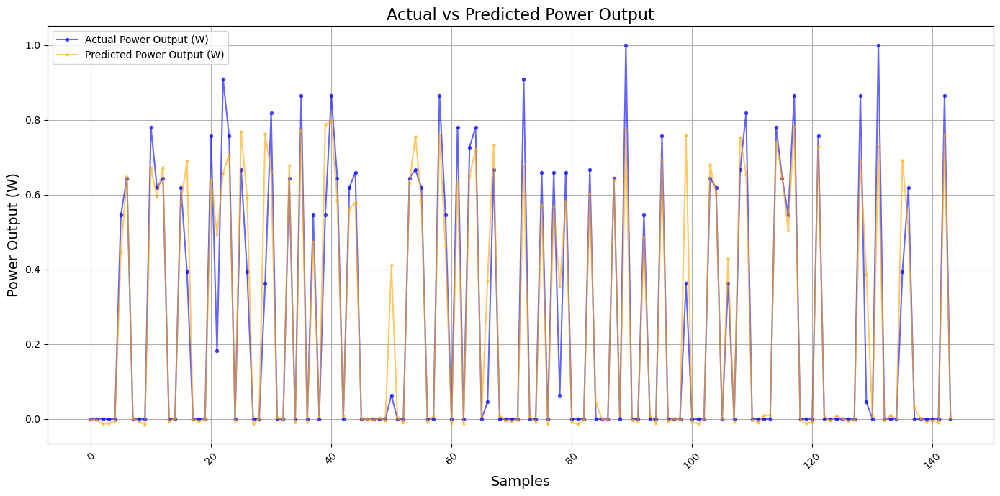

In [46]:
import matplotlib.pyplot as plt

# Make predictions on the test set
predictions = model.predict(X_test)

# Plotting actual vs predicted values
plt.figure(figsize=(14, 7))
plt.plot(y_test, label='Actual Power Output (W)', color='blue', marker='o', markersize=3, alpha=0.6)
plt.plot(predictions, label='Predicted Power Output (W)', color='orange', marker='x', markersize=3, alpha=0.6)

# Customize the plot
plt.title('Actual vs Predicted Power Output', fontsize=16)
plt.xlabel('Samples', fontsize=14)
plt.ylabel('Power Output (W)', fontsize=14)
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


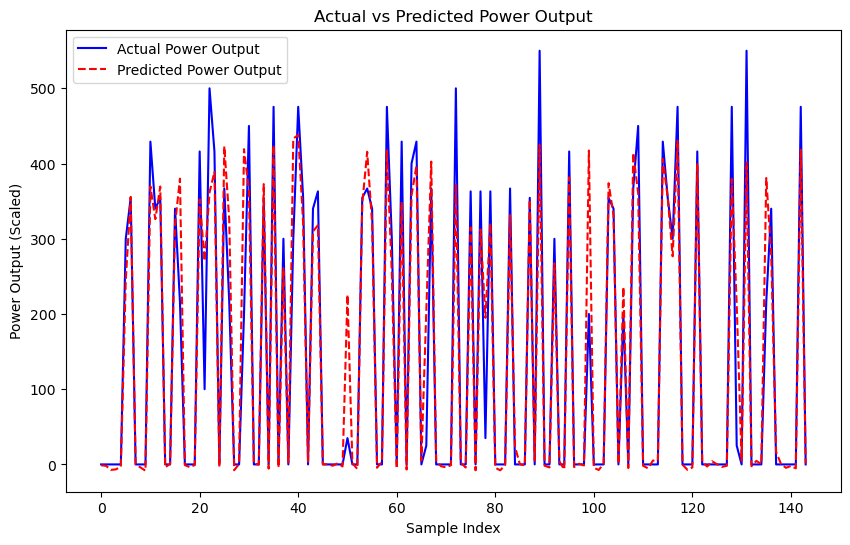

NameError: name 'history' is not defined

In [48]:
import matplotlib.pyplot as plt
import numpy as np

# Plot Predictions vs Actual
def plot_predictions(y_test, predictions):
    plt.figure(figsize=(10, 6))
    plt.plot(y_test, label='Actual Power Output', color='blue')
    plt.plot(predictions, label='Predicted Power Output', color='red', linestyle='--')
    plt.title('Actual vs Predicted Power Output')
    plt.xlabel('Sample Index')
    plt.ylabel('Power Output (Scaled)')
    plt.legend()
    plt.show()

# Plot Training and Validation Loss
def plot_loss(history):
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Training Loss', color='blue')
    plt.plot(history.history['val_loss'], label='Validation Loss', color='red', linestyle='--')
    plt.title('Training and Validation Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss (Mean Squared Error)')
    plt.legend()
    plt.show()

# Unscale the predictions and the actual data
def unscale_data(scaler, y_scaled):
    return scaler.inverse_transform(y_scaled.reshape(-1, 1))

# Make Predictions
predictions = model.predict(X_test)

# Unscale y_test and predictions (since we scaled earlier)
y_test_unscaled = unscale_data(scaler, y_test)
predictions_unscaled = unscale_data(scaler, predictions)

# Plot Actual vs Predicted
plot_predictions(y_test_unscaled, predictions_unscaled)

# Plot Loss Curves
plot_loss(history)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


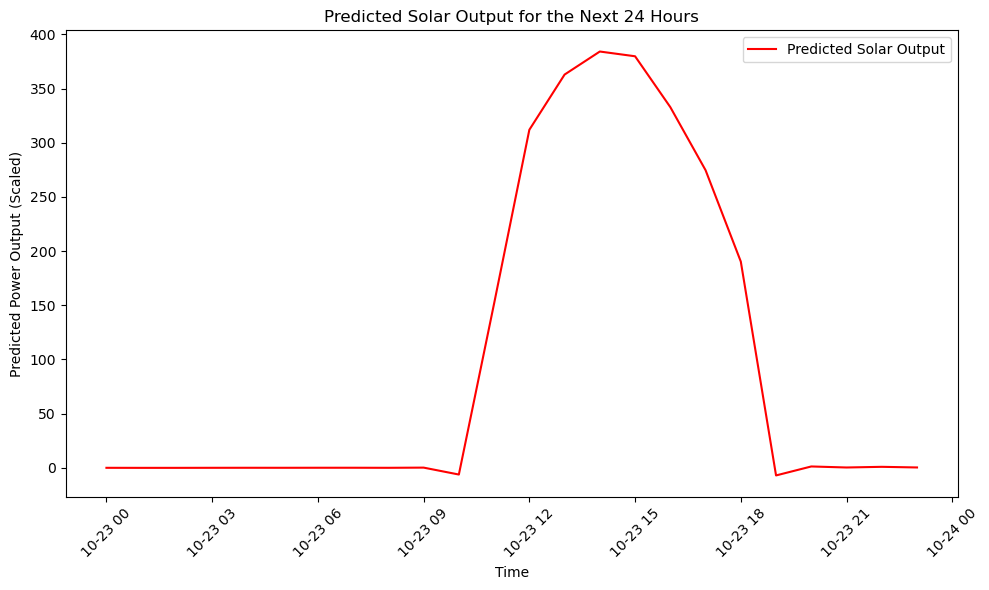

In [17]:
import requests
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

# Step 1: Request future weather data from WeatherAPI
API_KEY = '255771c7e223415e9b9205541241910'
LOCATION = 'Upington'
HOURS = 24  # Request data for the next 48 hours
url = f'http://api.weatherapi.com/v1/forecast.json?key={API_KEY}&q={LOCATION}&hours={HOURS}'

# Fetch the weather data from API
response = requests.get(url)
data = response.json()

# Step 2: Preprocess the weather data
forecast_hours = data['forecast']['forecastday'][0]['hour'][:HOURS]
times = [hour['time'] for hour in forecast_hours]
ghi = [hour['solar'] if 'solar' in hour else 0 for hour in forecast_hours]  # Assume 0 if not available
dni = [hour['uv'] for hour in forecast_hours]  # Using UV as a proxy for direct irradiance
dhi = [0 for _ in range(HOURS)]  # Placeholder for DHI if not provided
temps = [hour['temp_c'] for hour in forecast_hours]
wind_speed = [hour['wind_kph'] for hour in forecast_hours]

# Prepare DataFrame for model input
df_weather = pd.DataFrame({
    'timestamp': pd.to_datetime(times),
    'ghi': ghi,
    'dni': dni,
    'dhi': dhi,
    'temperature': temps,
    'wind_speed': wind_speed
})

# Step 3: Load the pre-trained LSTM model (ensure the model is saved as 'lstm_model.h5')
model = tf.keras.models.load_model('lstm_model.h5')

# Step 4: Scale the data before prediction
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(df_weather[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']])

# Step 5: Make predictions using the LSTM model
predictions = model.predict(X_scaled)

# Step 6: Visualize the predictions
plt.figure(figsize=(10, 6))
plt.plot(df_weather['timestamp'], predictions, label='Predicted Solar Output', color='red')
plt.title('Predicted Solar Output for the Next 24 Hours')
plt.xlabel('Time')
plt.ylabel('Predicted Power Output (Scaled)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [57]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming predictions for both LSTM and Random Forest models have already been generated
# and that `y_test` represents the true values

# Make predictions using LSTM (already trained and loaded)
lstm_predictions = model.predict(X_test)

# Load the pre-trained Random Forest model and make predictions (replace with your Random Forest model)
rf_model = joblib.load('random_forest_model.pkl')  # Load your RF model here
rf_predictions = rf_model.predict(X_test)

# Convert data to a DataFrame for easier handling
results_df = pd.DataFrame({
    'True Output': y_test,
    'LSTM Predictions': lstm_predictions.flatten(),
    'RF Predictions': rf_predictions.flatten()
})

# Time-series plot for actual vs predicted values (LSTM and Random Forest)
plt.figure(figsize=(16, 6))
plt.plot(results_df['True Output'], label='True Output', color='black', linewidth=2)
plt.plot(results_df['LSTM Predictions'], label='LSTM Predictions', color='blue', linestyle='--')
plt.plot(results_df['RF Predictions'], label='RF Predictions', color='green', linestyle='--')
plt.title('Actual vs Predicted Power Output: LSTM vs Random Forest', fontsize=16)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Power Output (W)', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

# Error histogram: LSTM vs Random Forest
plt.figure(figsize=(12, 6))
lstm_errors = results_df['LSTM Predictions'] - results_df['True Output']
rf_errors = results_df['RF Predictions'] - results_df['True Output']
sns.histplot(lstm_errors, color='blue', kde=True, label='LSTM Errors', stat='density')
sns.histplot(rf_errors, color='green', kde=True, label='RF Errors', stat='density')
plt.title('Error Distribution: LSTM vs Random Forest', fontsize=16)
plt.xlabel('Prediction Error (W)', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

# Scatter plot to show the correlation between true values and predicted values for LSTM
plt.figure(figsize=(6, 6))
plt.scatter(results_df['True Output'], results_df['LSTM Predictions'], alpha=0.5, label='LSTM Predictions', color='blue')
plt.plot([0, 550], [0, 550], color='black', linewidth=2, linestyle='--')  # Line of perfect prediction
plt.title('True vs LSTM Predicted Power Output', fontsize=16)
plt.xlabel('True Power Output (W)', fontsize=12)
plt.ylabel('LSTM Predicted Power Output (W)', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

# Scatter plot to show the correlation between true values and predicted values for Random Forest
plt.figure(figsize=(6, 6))
plt.scatter(results_df['True Output'], results_df['RF Predictions'], alpha=0.5, label='RF Predictions', color='green')
plt.plot([0, 550], [0, 550], color='black', linewidth=2, linestyle='--')  # Line of perfect prediction
plt.title('True vs RF Predicted Power Output', fontsize=16)
plt.xlabel('True Power Output (W)', fontsize=12)
plt.ylabel('RF Predicted Power Output (W)', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

# Mean Squared Error (MSE) comparison
lstm_mse = np.mean(np.square(lstm_errors))
rf_mse = np.mean(np.square(rf_errors))

print(f'LSTM Mean Squared Error (MSE): {lstm_mse:.2f}')
print(f'Random Forest Mean Squared Error (MSE): {rf_mse:.2f}')


C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


ValueError: Per-column arrays must each be 1-dimensional

(1032, 6)
(720, 2)
Epoch 1/500


C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 57655.7070 - val_loss: 61675.8555
Epoch 2/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 53128.2422 - val_loss: 58024.5898
Epoch 3/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 51389.6523 - val_loss: 44462.5938
Epoch 4/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 41338.2500 - val_loss: 21252.6309
Epoch 5/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 15414.9219 - val_loss: 14178.6299
Epoch 6/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 10824.4941 - val_loss: 11543.6719
Epoch 7/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9027.8564 - val_loss: 10017.7295
Epoch 8/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7377.1362 - val_loss: 9468.0547
Epoch 9/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6594.1016 - val_loss: 9039.8789
Epoch 10/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7043.6279 - val_loss: 8849.0879
Epoch 11/500
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6970.5488 - val_loss: 8669.0

Random Forest Loss: 1997.3456056103355


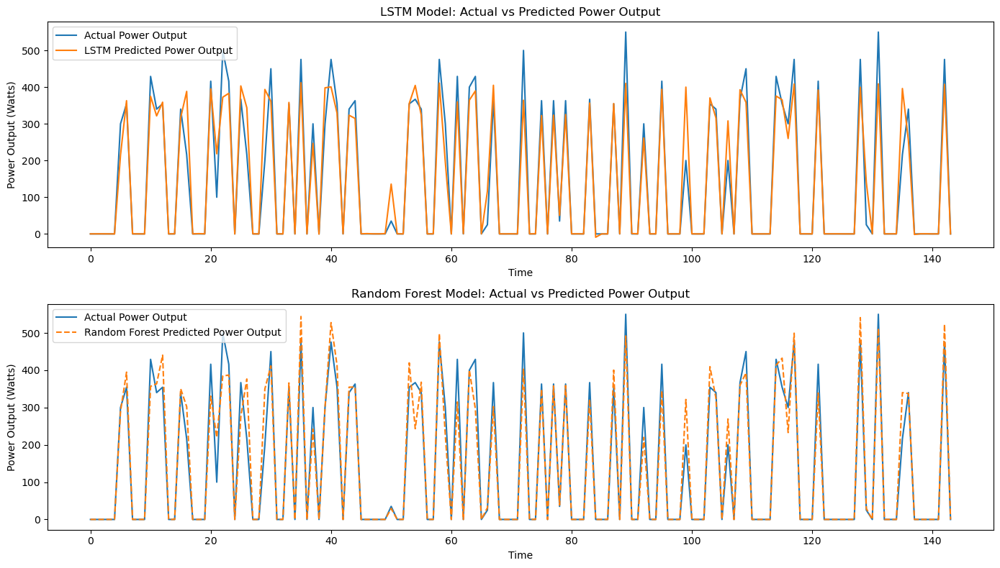

<Figure size 1000x600 with 0 Axes>

Final LSTM Loss: 2810.41015625
Final Random Forest Loss: 1997.3456056103355


In [65]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Load the features and target data
features = pd.read_csv('weather_data.csv')  # Load your weather data
target = pd.read_csv('power_data.csv')  # Load the power output data

# Check for the shape of the columns
print(features.shape)
print(target.shape)

# Ensure the target data is aligned with the features
# Assuming both datasets have a common timestamp column to merge on
data = features.merge(target, on='timestamp', how='inner')

# Check if any column is 2-dimensional and fix it
for col in data.columns:
    if data[col].ndim > 1:
        data[col] = data[col].squeeze()  # Squeeze it into 1D if needed

# Prepare input features and target variable
X = data[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']].values
y = data['power_output'].values  # Change this to match the column name in power_data.csv

# Scale the data
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Build the model with more layers, dropout, and reduced learning rate
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1)
])

# Learning rate scheduler
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=10000,
    decay_rate=0.9
)

# Compile model
optimizer = Adam(learning_rate=lr_schedule)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)


# Train the model and capture the training history
history = model.fit(X_train, y_train, epochs=500, batch_size=16, validation_split=0.3, callbacks=[early_stopping])

# Evaluate
lstm_loss = model.evaluate(X_test, y_test)
print(f'Model Loss: {loss}')

# Make predictions
lstm_predictions = model.predict(X_test)

# Save the trained model
model.save('lstm_model.h5')


# Random Forest Model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Evaluate Random Forest
rf_predictions = rf_model.predict(X_test)
rf_loss = mean_squared_error(y_test, rf_predictions)
print(f'Random Forest Loss: {rf_loss}')

# Plotting results
plt.figure(figsize=(14, 8))

# Plot LSTM Predictions vs Actual
plt.subplot(2, 1, 1)
plt.plot(y_test, label='Actual Power Output')
plt.plot(lstm_predictions, label='LSTM Predicted Power Output')
plt.title('LSTM Model: Actual vs Predicted Power Output')
plt.xlabel('Time')
plt.ylabel('Power Output (Watts)')
plt.legend()

# Plot Random Forest Predictions vs Actual
plt.subplot(2, 1, 2)
plt.plot(y_test, label='Actual Power Output')
plt.plot(rf_predictions, label='Random Forest Predicted Power Output', linestyle='dashed')
plt.title('Random Forest Model: Actual vs Predicted Power Output')
plt.xlabel('Time')
plt.ylabel('Power Output (Watts)')
plt.legend()

plt.tight_layout()
plt.show()

# Visualize Losses
plt.figure(figsize=(10, 6))


plt.show()

# Comparison of Random Forest vs LSTM Loss
print(f"Final LSTM Loss: {lstm_loss}")
print(f"Final Random Forest Loss: {rf_loss}")


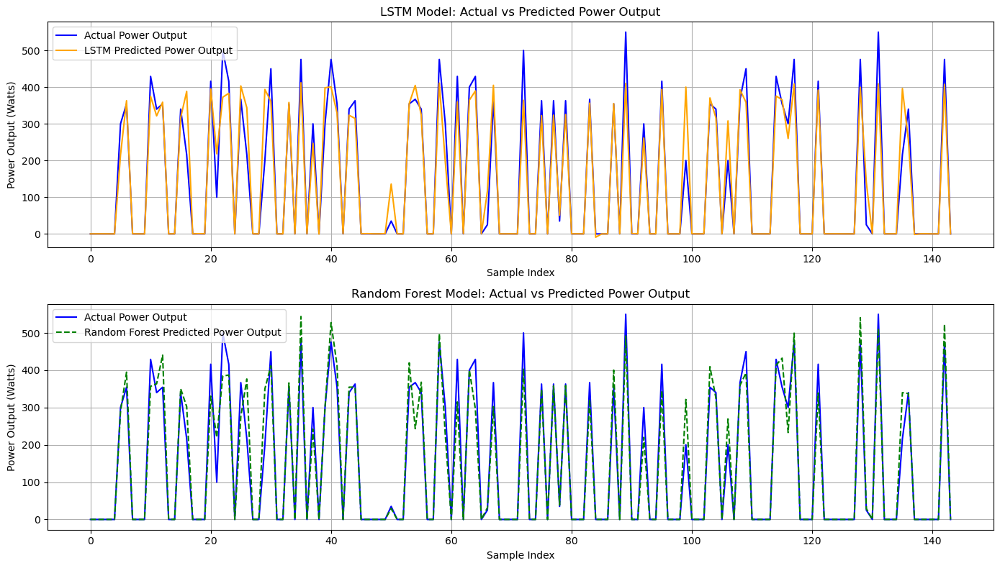

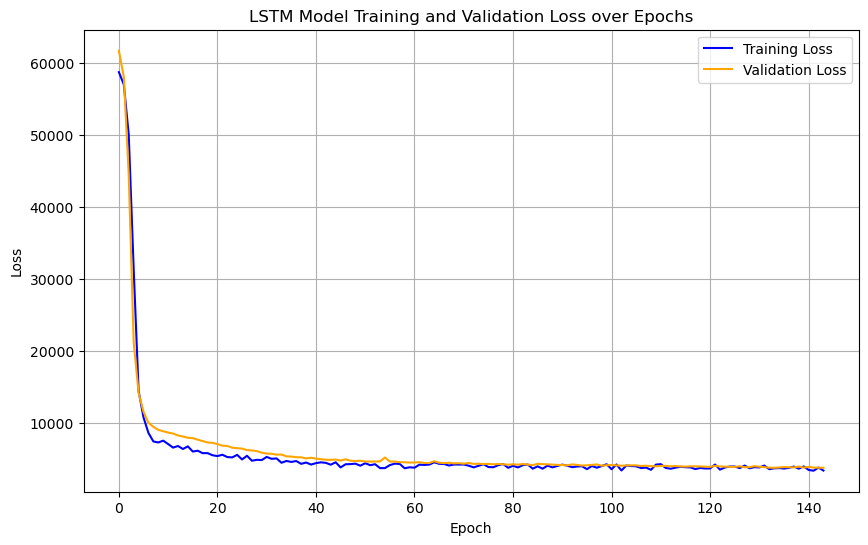

Final LSTM Loss: 2810.41015625
Final Random Forest Loss: 1997.3456056103355


In [67]:
import matplotlib.pyplot as plt

# Make sure to call plt.figure() before each subplot
plt.figure(figsize=(14, 8))

# Plot LSTM Predictions vs Actual
plt.subplot(2, 1, 1)
plt.plot(y_test, label='Actual Power Output', color='blue')
plt.plot(lstm_predictions, label='LSTM Predicted Power Output', color='orange')
plt.title('LSTM Model: Actual vs Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output (Watts)')
plt.legend()
plt.grid()

# Plot Random Forest Predictions vs Actual
plt.subplot(2, 1, 2)
plt.plot(y_test, label='Actual Power Output', color='blue')
plt.plot(rf_predictions, label='Random Forest Predicted Power Output', color='green', linestyle='dashed')
plt.title('Random Forest Model: Actual vs Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output (Watts)')
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

# Visualize Losses
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange')
plt.title('LSTM Model Training and Validation Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

# Comparison of Random Forest vs LSTM Loss
print(f"Final LSTM Loss: {lstm_loss}")
print(f"Final Random Forest Loss: {rf_loss}")


Epoch 1/200


C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\ops\nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (10, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 62876.8750 - val_loss: 41751.7656
Epoch 2/200
 1/46 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 45217.5273

C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\ops\nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 22357.3125 - val_loss: 14217.1289
Epoch 3/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8184.3008 - val_loss: 10721.1621
Epoch 4/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6197.7305 - val_loss: 9714.8184
Epoch 5/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7054.7329 - val_loss: 9277.7500
Epoch 6/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6633.8828 - val_loss: 8815.2617
Epoch 7/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6789.8682 - val_loss: 8549.9922
Epoch 8/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5703.2065 - val_loss: 8115.5894
Epoch 9/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4566.9238 - val_loss: 9021.2480
Epoch 10/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6270.7544 - val_loss: 8704.2061
Epoch 11/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5297.2661 - val_loss: 7029.8438
Epoch 12/200
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5031.7476 - val_loss: 6828.2070
Epoch

C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\ops\nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


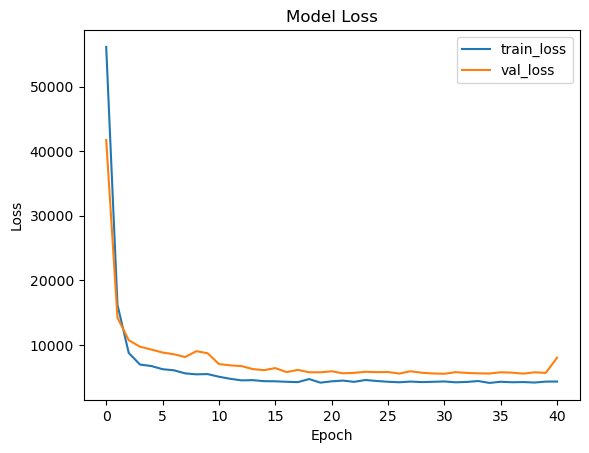

In [89]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping

# Load the features and target data
features = pd.read_csv('weather_data.csv')  # Load your weather data
target = pd.read_csv('power_data.csv')  # Load the power output data

# Ensure the target data is aligned with the features
data = features.merge(target, on='timestamp', how='inner')

# Prepare input features and target variable
X = data[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']].values
y = data['power_output'].values  # Change this to match the column name in power_data.csv

# Scale the data
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Define a simple Transformer model
class SimpleTransformer(tf.keras.Model):
    def __init__(self, embed_size, heads, num_layers, output_dim):
        super(SimpleTransformer, self).__init__()
        self.input_layer = tf.keras.layers.Input(shape=(X_train.shape[1],))
        self.attention_layers = [tf.keras.layers.MultiHeadAttention(num_heads=heads, key_dim=embed_size) for _ in range(num_layers)]
        self.flatten = tf.keras.layers.Flatten()
        self.dense1 = tf.keras.layers.Dense(128, activation='relu')
        self.dense2 = tf.keras.layers.Dense(output_dim)

    def call(self, inputs):
        # Reshape inputs for attention layer
        x = tf.expand_dims(inputs, axis=1)  # Shape: (batch_size, 1, num_features)
        for attention in self.attention_layers:
            x = attention(x, x)
        x = self.flatten(x)
        x = self.dense1(x)
        return self.dense2(x)

# Build and compile the model
embed_size = 64  # Embedding size
heads = 4  # Number of attention heads
num_layers = 2  # Number of attention layers
output_dim = 1  # Output dimension for power output

model = SimpleTransformer(embed_size, heads, num_layers, output_dim)
model.compile(optimizer='adam', loss='mean_squared_error')

# Implement Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=200, batch_size=10, validation_split=0.2, callbacks=[early_stopping])

# Evaluate the model
loss = model.evaluate(X_test, y_test)
print(f'Model Loss: {loss}')

# Make predictions
predictions = model.predict(X_test)

# (Optional) Visualize training history
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()


Epoch 1/100


C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\ops\nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 61419.4805 - val_loss: 60235.5820
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 50565.0664 - val_loss: 22238.6680
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 14947.9570 - val_loss: 16243.6562
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 12613.8779 - val_loss: 12816.0684
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8589.0225 - val_loss: 11136.0664
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6543.2095 - val_loss: 10552.9795
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6470.0703 - val_loss: 10426.6738
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6810.4585 - val_loss: 9551.2734
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5196.7646 - val_loss: 9525.5586
Epoch 10/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6506.9766 - val_loss: 8852.2744
Epoch 11/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6109.7915 - val_loss: 8652.61

C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\ops\nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


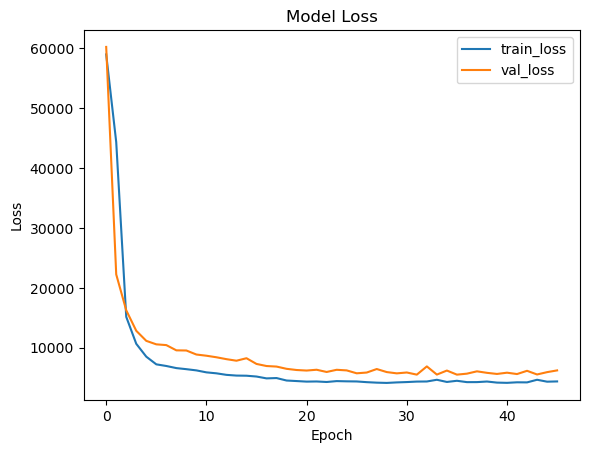

In [93]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Load the features and target data
features = pd.read_csv('weather_data.csv')  # Load your weather data
target = pd.read_csv('power_data.csv')  # Load the power output data

# Ensure the target data is aligned with the features
data = features.merge(target, on='timestamp', how='inner')

# Prepare input features and target variable
X = data[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']].values
y = data['power_output'].values  # Change this to match the column name in power_data.csv

# Scale the data
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Define a simple Transformer model
class SimpleTransformer(tf.keras.Model):
    def __init__(self, embed_size, heads, num_layers, output_dim):
        super(SimpleTransformer, self).__init__()
        self.attention_layers = [tf.keras.layers.MultiHeadAttention(num_heads=heads, key_dim=embed_size) for _ in range(num_layers)]
        self.flatten = tf.keras.layers.Flatten()
        self.dense1 = tf.keras.layers.Dense(128, activation='relu')
        self.dense2 = tf.keras.layers.Dense(output_dim)

    def call(self, inputs):
        # Reshape inputs for attention layer
        x = tf.expand_dims(inputs, axis=1)  # Shape: (batch_size, 1, num_features)
        for attention in self.attention_layers:
            x = attention(x, x)
        x = self.flatten(x)
        x = self.dense1(x)
        return self.dense2(x)

# Build and compile the model
embed_size = 64  # Embedding size
heads = 4  # Number of attention heads
num_layers = 2  # Number of attention layers
output_dim = 1  # Output dimension for power output

model = SimpleTransformer(embed_size, heads, num_layers, output_dim)
model.compile(optimizer='adam', loss='mean_squared_error')

# Implement Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=16, validation_split=0.2, callbacks=[early_stopping])

# Evaluate the model
loss = model.evaluate(X_test, y_test)
print(f'Model Loss: {loss}')

# Make predictions
predictions = model.predict(X_test)

# (Optional) Visualize training history
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()


Epoch 1/150


C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\ops\nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


92/92 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 50382.2148 - val_loss: 15084.2979
Epoch 2/150
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 10616.2090 - val_loss: 9912.8789
Epoch 3/150
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6733.6699 - val_loss: 9027.7393
Epoch 4/150
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5204.2754 - val_loss: 9271.3477
Epoch 5/150
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6368.7896 - val_loss: 8037.2925
Epoch 6/150
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6028.0752 - val_loss: 7283.0107
Epoch 7/150
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5989.9736 - val_loss: 6878.7842
Epoch 8/150
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4673.3081 - val_loss: 7562.4819
Epoch 9/150
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5006.1597 - val_loss: 6158.9863
Epoch 10/150
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4050.4702 - val_loss: 5570.9639
Epoch 11/150
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4432.0425 - val_loss: 5467.0488
Epoch 

C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\ops\nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


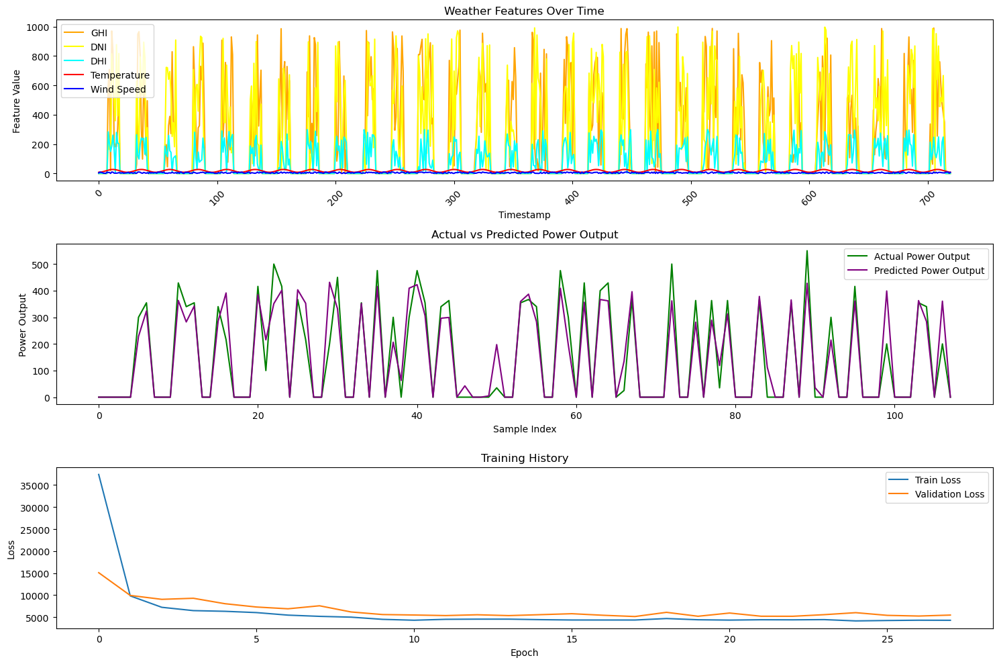

In [107]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping

# Load the features and target data
features = pd.read_csv('weather_data.csv')  # Load your weather data
target = pd.read_csv('power_data.csv')  # Load the power output data

# Ensure the target data is aligned with the features
data = features.merge(target, on='timestamp', how='inner')

# Prepare input features and target variable
X = data[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']].values
y = data['power_output'].values  # Change this to match the column name in power_data.csv

# Scale the data
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.15, random_state=42)

# Define a simple Transformer model
class SimpleTransformer(tf.keras.Model):
    def __init__(self, embed_size, heads, num_layers, output_dim):
        super(SimpleTransformer, self).__init__()
        self.attention_layers = [tf.keras.layers.MultiHeadAttention(num_heads=heads, key_dim=embed_size) for _ in range(num_layers)]
        self.flatten = tf.keras.layers.Flatten()
        self.dense1 = tf.keras.layers.Dense(128, activation='relu')
        self.dense2 = tf.keras.layers.Dense(output_dim)

    def call(self, inputs):
        # Reshape inputs for attention layer
        x = tf.expand_dims(inputs, axis=1)  # Shape: (batch_size, 1, num_features)
        for attention in self.attention_layers:
            x = attention(x, x)
        x = self.flatten(x)
        x = self.dense1(x)
        return self.dense2(x)

# Build and compile the model
embed_size = 64  # Embedding size
heads = 4  # Number of attention heads
num_layers = 2  # Number of attention layers
output_dim = 1  # Output dimension for power output

model = SimpleTransformer(embed_size, heads, num_layers, output_dim)
model.compile(optimizer='adam', loss='mean_squared_error')

# Implement Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=150, batch_size=5, validation_split=0.25, callbacks=[early_stopping])

# Evaluate the model
loss = model.evaluate(X_test, y_test)
print(f'Model Loss: {loss}')

# Make predictions
predictions = model.predict(X_test)

# Plot input data
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
plt.plot( data['ghi'], label='GHI', color='orange')
plt.plot( data['dni'], label='DNI', color='yellow')
plt.plot( data['dhi'], label='DHI', color='cyan')
plt.plot( data['temperature'], label='Temperature', color='red')
plt.plot( data['wind_speed'], label='Wind Speed', color='blue')
plt.title('Weather Features Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Feature Value')
plt.legend()
plt.xticks(rotation=45)

# Plot actual vs predicted power output
plt.subplot(3, 1, 2)
plt.plot(y_test, label='Actual Power Output', color='green')
plt.plot(predictions, label='Predicted Power Output', color='purple')
plt.title('Actual vs Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

# Plot training history
plt.subplot(3, 1, 3)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training History')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


Epoch 1/200


C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\ops\nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 52408.7500 - val_loss: 16163.1973
Epoch 2/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9646.3994 - val_loss: 13848.1807
Epoch 3/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8682.1816 - val_loss: 8876.5166
Epoch 4/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6690.0469 - val_loss: 9784.7646
Epoch 5/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5746.6782 - val_loss: 7411.9199
Epoch 6/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5722.0151 - val_loss: 6798.8726
Epoch 7/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4428.9536 - val_loss: 6162.3530
Epoch 8/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4962.8838 - val_loss: 6277.9727
Epoch 9/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4939.7295 - val_loss: 6931.6431
Epoch 10/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4714.6011 - val_loss: 5536.1724
Epoch 11/200
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4358.4604 - val_loss: 6433.7900
Epoch 

C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\ops\nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


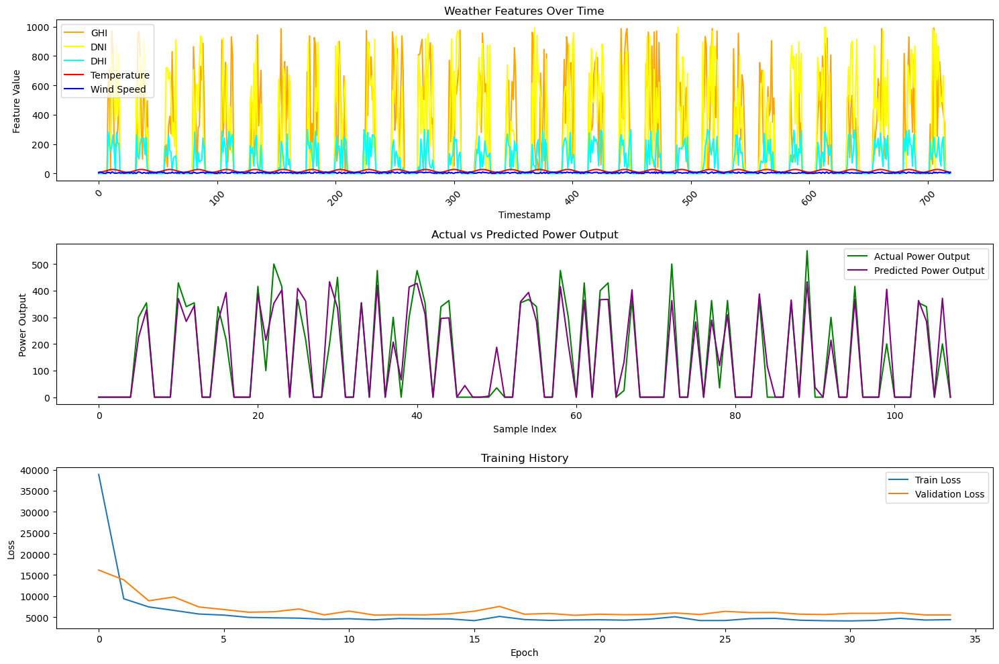

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping

# Load the features and target data
features = pd.read_csv('weather_data.csv')  # Load your weather data
target = pd.read_csv('power_data.csv')  # Load the power output data

# Ensure the target data is aligned with the features
data = features.merge(target, on='timestamp', how='inner')

# Prepare input features and target variable
X = data[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']].values
y = data['power_output'].values  # Change this to match the column name in power_data.csv

# Scale the features and target
scaler_X = MinMaxScaler()
#scaler_y = MinMaxScaler()
X_scaled = scaler_X.fit_transform(X)
#y_scaled = scaler_y.fit_transform(y.reshape(-1, 1)).flatten()

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.15, random_state=42)

# Define a more complex Transformer model
class ImprovedTransformer(tf.keras.Model):
    def __init__(self, embed_size, heads, num_layers, output_dim, dropout_rate=0.2):
        super(ImprovedTransformer, self).__init__()
        self.attention_layers = [tf.keras.layers.MultiHeadAttention(num_heads=heads, key_dim=embed_size) for _ in range(num_layers)]
        self.flatten = tf.keras.layers.Flatten()
        self.dense1 = tf.keras.layers.Dense(256, activation='relu')
        self.dropout = tf.keras.layers.Dropout(dropout_rate)
        self.dense2 = tf.keras.layers.Dense(output_dim)

    def call(self, inputs):
        x = tf.expand_dims(inputs, axis=1)  # Shape: (batch_size, 1, num_features)
        for attention in self.attention_layers:
            x = attention(x, x)
        x = self.flatten(x)
        x = self.dense1(x)
        x = self.dropout(x)
        return self.dense2(x)

# Build and compile the model
embed_size = 64  # Embedding size
heads = 4  # Number of attention heads
num_layers = 3  # Number of attention layers (increased)
output_dim = 1  # Output dimension for power output

model = ImprovedTransformer(embed_size, heads, num_layers, output_dim)
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mean_squared_error')

# Implement Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=200, batch_size=8, validation_split=0.2, callbacks=[early_stopping])

# Evaluate the model
loss = model.evaluate(X_test, y_test)
print(f'Model Loss: {loss}')

# Make predictions and inverse transform
predictions = model.predict(X_test)
#predictions_inverse = scaler_y.inverse_transform(predictions)

# Plot input data
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
plt.plot(data['ghi'], label='GHI', color='orange')
plt.plot(data['dni'], label='DNI', color='yellow')
plt.plot(data['dhi'], label='DHI', color='cyan')
plt.plot(data['temperature'], label='Temperature', color='red')
plt.plot(data['wind_speed'], label='Wind Speed', color='blue')
plt.title('Weather Features Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Feature Value')
plt.legend()
plt.xticks(rotation=45)

# Plot actual vs predicted power output
plt.subplot(3, 1, 2)
plt.plot(y_test, label='Actual Power Output', color='green')
plt.plot(predictions, label='Predicted Power Output', color='purple')
plt.title('Actual vs Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

# Plot training history
plt.subplot(3, 1, 3)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training History')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [10]:
print(data.isnull().sum())


timestamp       0
ghi             0
dni             0
dhi             0
temperature     0
wind_speed      0
power_output    0
dtype: int64


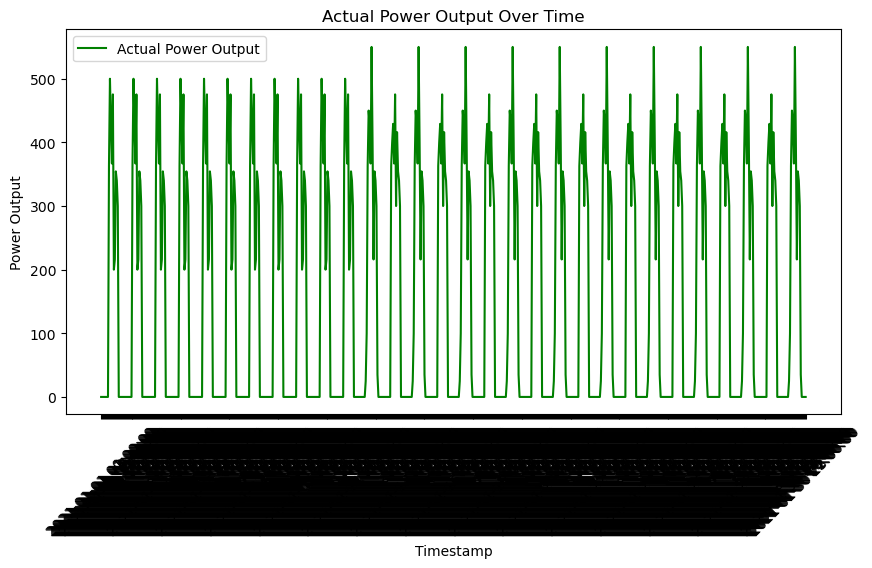

In [113]:
plt.figure(figsize=(10, 5))
plt.plot(data['timestamp'], data['power_output'], label='Actual Power Output', color='green')
plt.title('Actual Power Output Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Power Output')
plt.legend()
plt.xticks(rotation=45)
plt.show()


In [115]:
print(y_scaled.min(), y_scaled.max())


0.0 1.0


Epoch 1/200


C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\ops\nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


41/41 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 58525.4219 - val_loss: 20902.2188
Epoch 2/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 16565.6562 - val_loss: 12569.1426
Epoch 3/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 7411.5454 - val_loss: 9624.4717
Epoch 4/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6575.0366 - val_loss: 8727.1738
Epoch 5/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7000.4795 - val_loss: 8033.1294
Epoch 6/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6797.5083 - val_loss: 7586.0337
Epoch 7/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5921.6343 - val_loss: 6825.6616
Epoch 8/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4427.0063 - val_loss: 6181.9790
Epoch 9/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5150.0190 - val_loss: 7677.3618
Epoch 10/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4756.9121 - val_loss: 5506.1802
Epoch 11/200
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3876.7158 - val_loss: 5676.2368
Epoc

C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\ops\nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


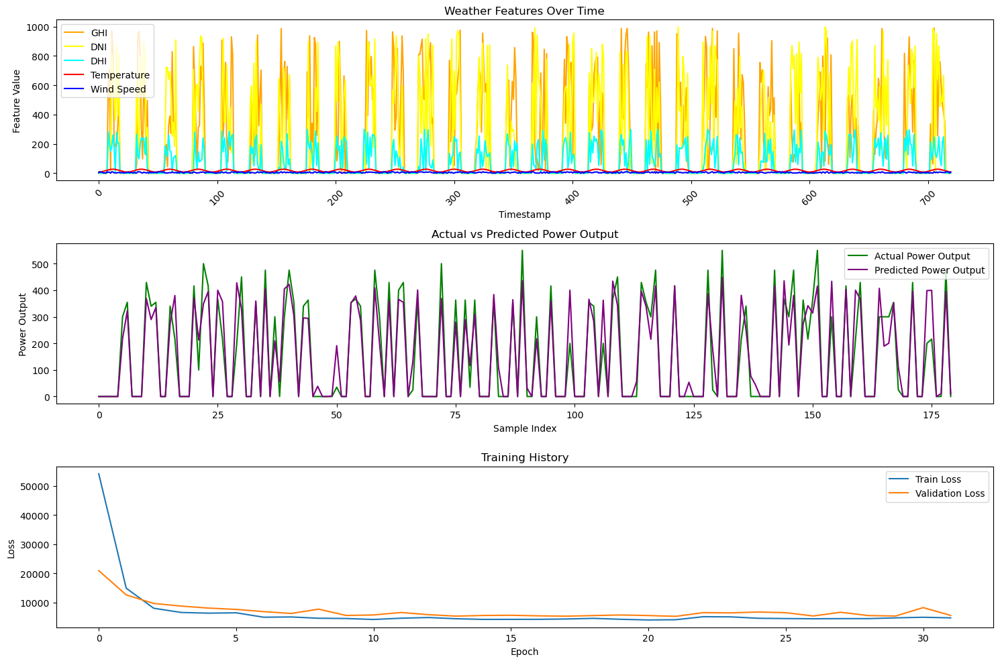

In [143]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping

# Load the features and target data
features = pd.read_csv('weather_data.csv')  # Load your weather data
target = pd.read_csv('power_data.csv')  # Load the power output data

# Ensure the target data is aligned with the features
data = features.merge(target, on='timestamp', how='inner')

# Prepare input features and target variable
X = data[['ghi', 'dni', 'dhi', 'temperature', 'wind_speed']].values
y = data['power_output'].values  # Use raw power output without scaling

# Scale only the input features
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.25, random_state=42)

# Define a simple Transformer model
class SimpleTransformer(tf.keras.Model):
    def __init__(self, embed_size, heads, num_layers, output_dim):
        super(SimpleTransformer, self).__init__()
        self.attention_layers = [tf.keras.layers.MultiHeadAttention(num_heads=heads, key_dim=embed_size) for _ in range(num_layers)]
        self.flatten = tf.keras.layers.Flatten()
        self.dense1 = tf.keras.layers.Dense(128, activation='relu')
        self.dense2 = tf.keras.layers.Dense(output_dim)

    def call(self, inputs):
        # Reshape inputs for attention layer
        x = tf.expand_dims(inputs, axis=1)  # Shape: (batch_size, 1, num_features)
        for attention in self.attention_layers:
            x = attention(x, x)
        x = self.flatten(x)
        x = self.dense1(x)
        return self.dense2(x)

# Build and compile the model
embed_size = 64  # Embedding size
heads = 4  # Number of attention heads
num_layers = 4  # Number of attention layers
output_dim = 1  # Output dimension for power output

model = SimpleTransformer(embed_size, heads, num_layers, output_dim)
model.compile(optimizer='adam', loss='mean_squared_error')

# Implement Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=200, batch_size=10, validation_split=0.25, callbacks=[early_stopping])

# Evaluate the model
loss = model.evaluate(X_test, y_test)
print(f'Model Loss: {loss}')

# Make predictions
predictions = model.predict(X_test)

# Plot input data
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
plt.plot(data['ghi'], label='GHI', color='orange')
plt.plot(data['dni'], label='DNI', color='yellow')
plt.plot(data['dhi'], label='DHI', color='cyan')
plt.plot(data['temperature'], label='Temperature', color='red')
plt.plot(data['wind_speed'], label='Wind Speed', color='blue')
plt.title('Weather Features Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Feature Value')
plt.legend()
plt.xticks(rotation=45)

# Plot actual vs predicted power output
plt.subplot(3, 1, 2)
plt.plot(y_test, label='Actual Power Output', color='green')
plt.plot(predictions, label='Predicted Power Output', color='purple')
plt.title('Actual vs Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

# Plot training history
plt.subplot(3, 1, 3)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training History')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [145]:
import numpy as np

# Example parameters
P_demand = 100  # Total demand in MW
P_gas_max = 50  # Max power from gas generator in MW
P_gas_min = 10  # Min power from gas generator in MW
P_diesel_max = 40  # Max power from diesel generator in MW
P_diesel_min = 5  # Min power from diesel generator in MW
P_hydro_max = 30  # Max power from hydro generator in MW
P_hydro_min = 0   # Min power from hydro generator in MW
P_battery_max = 20  # Max power from battery in MW
SoC_max = 100  # Max state of charge in kWh
SoC_min = 20   # Min state of charge in kWh
C_battery = 100  # Capacity of the battery in kWh
Delta_t = 1    # Time increment in hours

# Example decision variables
P_gas = np.random.uniform(P_gas_min, P_gas_max)
P_diesel = np.random.uniform(P_diesel_min, P_diesel_max)
P_hydro = np.random.uniform(P_hydro_min, P_hydro_max)
P_battery = np.random.uniform(-P_battery_max, P_battery_max)  # Can be negative for discharging
SoC_prev = 50  # Previous state of charge

# Power balance constraint
power_balance = P_gas + P_diesel + P_battery + P_hydro - P_demand

# SoC update and limits
SoC_new = SoC_prev + (P_battery / C_battery) * Delta_t
soc_constraint = (SoC_min <= SoC_new <= SoC_max)

# Output results
print("Power Balance Constraint:", power_balance)
print("SoC Constraint Met:", soc_constraint)


Power Balance Constraint: -45.206622172486206
SoC Constraint Met: True


In [147]:
pip install pyswarm


  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for pyswarm: filename=pyswarm-0.6-py3-none-any.whl size=4486 sha256=376ce93f6d6acba6ed4afc3f1860cb12db6ea2d0cd487804bc1aa4122b1aee11
  Stored in directory: c:\users\user\appdata\local\pip\cache\wheels\bb\4f\ec\8970b83323e16aa95034da175454843947376614d6d5e9627f
Successfully built pyswarm
Note: you may need to restart the kernel to use updated packages.


Stopping search: Swarm best position change less than 1e-08
Optimal Power Generation (MWh):
Battery: 49.67
Gas: 0.41
Diesel: 29.93
Hydro: 20.00
Total Cost: $5413.18


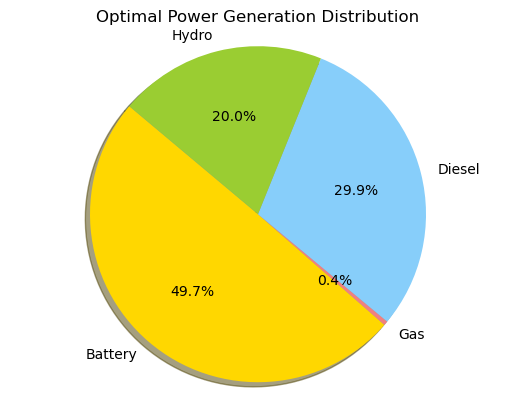

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from pyswarm import pso

# Objective function
def objective(x):
    # Costs per MWh for each generator type
    costs = np.array([10, 800, 120, 50])  # Battery, Gas, Diesel, Hydro costs
    return np.dot(costs, x)  # Total cost

# Constraints
def constraint1(x):
    return x[0] + x[1] + x[2] + x[3] - 100  # Total power balance

def constraint2(x):
    return 50 - x[0]  # Battery limit

def constraint3(x):
    return 40 - x[1]  # Gas limit

def constraint4(x):
    return 30 - x[2]  # Diesel limit

def constraint5(x):
    return 20 - x[3]  # Hydro limit

# Combine constraints into a list
def constraints(x):
    return [constraint1(x), constraint2(x), constraint3(x), 
            constraint4(x), constraint5(x)]

# Define lower and upper bounds
lb = [0, 0, 0, 0]  # Lower bounds for Battery, Gas, Diesel, Hydro
ub = [70, 60, 50, 40]  # Adjusted upper bounds

# Run PSO algorithm
try:
    xopt, fopt = pso(objective, lb, ub, f_ieqcons=constraints, swarmsize=100, maxiter=200)
    print("Optimal Power Generation (MWh):")
    print(f"Battery: {xopt[0]:.2f}")
    print(f"Gas: {xopt[1]:.2f}")
    print(f"Diesel: {xopt[2]:.2f}")
    print(f"Hydro: {xopt[3]:.2f}")
    print(f"Total Cost: ${fopt:.2f}")

    # Prepare data for pie chart
    sizes = xopt
    labels = ['Battery', 'Gas', 'Diesel', 'Hydro']
    colors = ['gold', 'lightcoral', 'lightskyblue', 'yellowgreen']

    # Check for valid pie chart sizes
    if all(size >= 0 for size in sizes) and any(size > 0 for size in sizes):
        plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%',
                shadow=True, startangle=140)
        plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
        plt.title('Optimal Power Generation Distribution')
        plt.show()
    else:
        print("Warning: Sizes for pie chart contain non-positive values.")
except Exception as e:
    print(f"An error occurred during optimization: {e}")


In [95]:
pip install pyabc

  Using cached GitPython-3.1.43-py3-none-any.whl.metadata (13 kB)
  Using cached gitdb-4.0.11-py3-none-any.whl.metadata (1.2 kB)
  Using cached smmap-5.0.1-py3-none-any.whl.metadata (4.3 kB)
   ---------------------------------------- 0.0/1.0 MB ? eta -:--:--
   ---------------------------------------- 1.0/1.0 MB 6.1 MB/s eta 0:00:00
   ---------------------------------------- 0.0/1.3 MB ? eta -:--:--
   --------------------------------- ------ 1.0/1.3 MB ? eta -:--:--
   ---------------------------------------- 1.3/1.3 MB 5.3 MB/s eta 0:00:00
Using cached GitPython-3.1.43-py3-none-any.whl (207 kB)
   ---------------------------------------- 0.0/2.1 MB ? eta -:--:--
   ----------------------------------- ---- 1.8/2.1 MB 98.3 MB/s eta 0:00:01
   ----------------------------------- ---- 1.8/2.1 MB 98.3 MB/s eta 0:00:01
   ----------------------------------- ---- 1.8/2.1 MB 98.3 MB/s eta 0:00:01
   ----------------------------------- ---- 1.8/2.1 MB 98.3 MB/s eta 0:00:01
   --------------

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [9]:
import numpy as np
import matplotlib.pyplot as plt
from pyabc import ABC  # Install a suitable ABC optimizer package

# Generator parameters
costs = np.array([100, 80, 120, 50])  # Cost per MWh for Battery, Gas, Diesel, Hydro
upper_bounds = np.array([70, 60, 50, 40])  # Generation upper bounds
min_losses = np.array([5, 10, 15, 2])  # Minimum losses per generator

# Total nominal supply based on upper bounds
total_nominal_supply = np.sum(upper_bounds)

# Set constant demand between 80% and 90% of total nominal supply
min_demand = 0.8 * total_nominal_supply
max_demand = 0.9 * total_nominal_supply
demand = 0.85 * total_nominal_supply  # Set demand to a constant 85% of total supply

# Objective function to minimize costs + losses
def objective(x):
    total_cost = np.dot(costs, x)  # Total cost of generation
    total_losses = np.dot(min_losses, x)  # Total losses
    return total_cost + total_losses

# Constraints for power balance and generator limits
def constraints(x):
    # Power balance constraint (total generation must meet demand)
    balance_constraint = [demand - np.sum(x)]
    
    # Generator upper bounds
    gen_constraints = [70 - x[0], 60 - x[1], 50 - x[2], 40 - x[3]]
    
    return np.hstack((balance_constraint, gen_constraints))

# Define lower and upper bounds for ABC
lb = np.array([0, 0, 0, 0])  # Minimum power from generators
ub = upper_bounds  # Upper bounds for generators

# Initialize the ABC optimizer
abc = ABC(objective, lb, ub, pop_size=50, max_iter=300)

# Run the ABC optimizer
best_solution, best_value = abc.run()

# Output results
print("Optimal Power Generation (MWh) for each generator:")
for i, gen in enumerate(['Battery', 'Gas', 'Diesel', 'Hydro']):
    print(f"{gen}: {best_solution[i]:.2f} MWh")

print(f"Total Cost + Losses: ${best_value:.2f}")

# Plotting generation mix
generators = ['Battery', 'Gas', 'Diesel', 'Hydro']
plt.bar(generators, best_solution, color=['gold', 'lightcoral', 'lightskyblue', 'yellowgreen'])
plt.xlabel('Generators')
plt.ylabel('Power (MW)')
plt.title('Optimal Power Generation Mix')
plt.show()


ImportError: cannot import name 'ABC' from 'pyabc' (C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\pyabc\__init__.py)

In [11]:
!conda install abcoptimization


Retrieving notices: ...working... done
Channels:
 - defaults
 - conda-forge
Platform: win-64
Solving environment: ...working... failed



PackagesNotFoundError: The following packages are not available from current channels:

  - abcoptimization

Current channels:

  - defaults
  - https://conda.anaconda.org/conda-forge/win-64
  - https://conda.anaconda.org/conda-forge/noarch

To search for alternate channels that may provide the conda package you're
looking for, navigate to

    https://anaconda.org

and use the search bar at the top of the page.




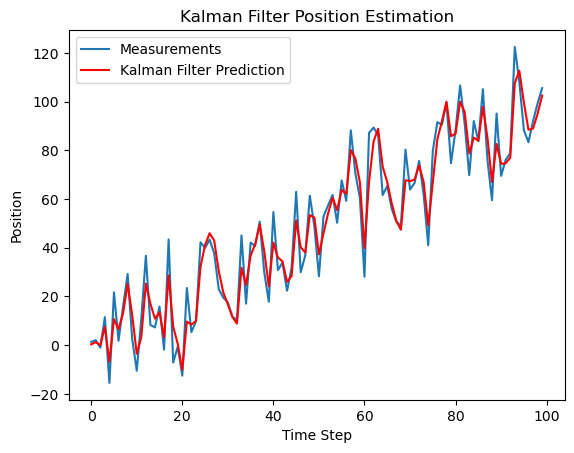

In [17]:
import numpy as np
import matplotlib.pyplot as plt

class KalmanFilter:
    def __init__(self, F, H, Q, R, P, x0):
        self.F = F  # State transition matrix
        self.H = H  # Observation matrix
        self.Q = Q  # Process noise covariance
        self.R = R  # Measurement noise covariance
        self.P = P  # Estimate error covariance
        self.x = x0  # Initial state

    def predict(self):
        # Predict the next state
        self.x = np.dot(self.F, self.x)
        self.P = np.dot(np.dot(self.F, self.P), self.F.T) + self.Q
        return self.x

    def update(self, z):
        # Update the state with measurement z
        y = z - np.dot(self.H, self.x)  # Measurement residual
        S = self.R + np.dot(self.H, np.dot(self.P, self.H.T))  # Residual covariance
        K = np.dot(np.dot(self.P, self.H.T), np.linalg.inv(S))  # Kalman gain

        # Update the state and covariance matrix
        self.x += np.dot(K, y)
        I = np.eye(self.F.shape[0])
        self.P = np.dot(I - np.dot(K, self.H), self.P)

def example():
    dt = 1.0  # Time step
    F = np.array([[1, dt], [0, 1]])  # State transition matrix
    H = np.array([[1, 0]])            # Observation matrix
    Q = np.array([[1, 0], [0, 3]])    # Process noise covariance
    R = np.array([[10]])               # Measurement noise covariance
    P = np.eye(2)                      # Initial estimate error covariance
    x0 = np.array([[0], [0]])         # Initial state (position and velocity)

    kf = KalmanFilter(F=F, H=H, Q=Q, R=R, P=P, x0=x0)

    measurements = [i + np.random.normal(0, 15) for i in range(100)]  # Simulated noisy measurements
    predictions = []

    for z in measurements:
        kf.predict()
        kf.update(np.array([[z]]))
        predictions.append(kf.x[0][0])  # Store predicted position

    plt.plot(measurements, label='Measurements')
    plt.plot(predictions, label='Kalman Filter Prediction', color='red')
    plt.legend()
    plt.xlabel('Time Step')
    plt.ylabel('Position')
    plt.title('Kalman Filter Position Estimation')
    plt.show()

if __name__ == '__main__':
    example()

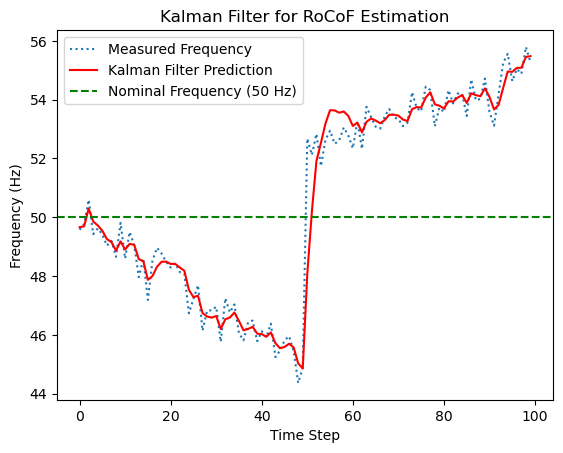

In [19]:
import numpy as np
import matplotlib.pyplot as plt

class KalmanFilter:
    def __init__(self, F, H, Q, R, P, x0):
        self.F = F  # State transition matrix
        self.H = H  # Observation matrix
        self.Q = Q  # Process noise covariance
        self.R = R  # Measurement noise covariance
        self.P = P  # Estimate error covariance
        self.x = x0  # Initial state

    def predict(self):
        # Predict the next state
        self.x = np.dot(self.F, self.x)
        self.P = np.dot(np.dot(self.F, self.P), self.F.T) + self.Q
        return self.x

    def update(self, z):
        # Update the state with measurement z
        y = z - np.dot(self.H, self.x)  # Measurement residual
        S = self.R + np.dot(self.H, np.dot(self.P, self.H.T))  # Residual covariance
        K = np.dot(np.dot(self.P, self.H.T), np.linalg.inv(S))  # Kalman gain

        # Update the state and covariance matrix
        self.x += np.dot(K, y)
        I = np.eye(self.F.shape[0])
        self.P = np.dot(I - np.dot(K, self.H), self.P)

def example():
    dt = 1.0  # Time step
    F = np.array([[1, dt], [0, 1]])  # State transition matrix (f_k+1 = f_k + RoCoF * dt)
    H = np.array([[1, 0]])            # Observation matrix (we only observe frequency)
    Q = np.array([[0.01, 0], [0, 0.01]])  # Process noise covariance
    R = np.array([[0.5]])              # Measurement noise covariance
    P = np.eye(2)                      # Initial estimate error covariance
    x0 = np.array([[50], [0]])         # Initial state (frequency at 50 Hz and RoCoF at 0)

    kf = KalmanFilter(F=F, H=H, Q=Q, R=R, P=P, x0=x0)

    true_frequency = []
    measured_frequency = []
    predictions_frequency = []

    for t in range(100):
        if t < 50:
            freq_change = -0.1  # Simulate a drop in frequency for the first half
        else:
            freq_change = 0.05  # Simulate recovery in frequency for the second half
        
        true_freq = 50 + freq_change * t + np.random.normal(0, 0.5)  # True frequency with noise
        measured_frequency.append(true_freq)

        kf.predict()
        kf.update(np.array([[true_freq]]))
        
        predictions_frequency.append(kf.x[0][0])  # Store predicted frequency

    plt.plot(measured_frequency, label='Measured Frequency', linestyle='dotted')
    plt.plot(predictions_frequency, label='Kalman Filter Prediction', color='red')
    plt.axhline(y=50, color='green', linestyle='--', label='Nominal Frequency (50 Hz)')
    plt.legend()
    plt.xlabel('Time Step')
    plt.ylabel('Frequency (Hz)')
    plt.title('Kalman Filter for RoCoF Estimation')
    plt.show()

if __name__ == '__main__':
    example()

In [21]:
def calculate_power_capacity(H, F_n, f, delta_t):
    # Calculate frequency deviation
    delta_f = F_n - f
    
    # Calculate Rate of Change of Frequency (RoCoF)
    r_OCOF = delta_f / delta_t
    
    # Calculate power capacity needed
    P = 2 * H * F_n * r_OCOF
    
    return P

def main():
    # Given values
    H = 10  # Inertia in seconds
    F_n = 60  # Nominal frequency in Hz
    f = 58  # Current frequency in Hz
    delta_t = 1  # Time interval in seconds

    # Calculate power capacity needed
    power_capacity_needed = calculate_power_capacity(H, F_n, f, delta_t)
    
    print(f"Power capacity needed to stabilize frequency: {power_capacity_needed:.2f} MW")

if __name__ == "__main__":
    main()

Power capacity needed to stabilize frequency: 2400.00 MW


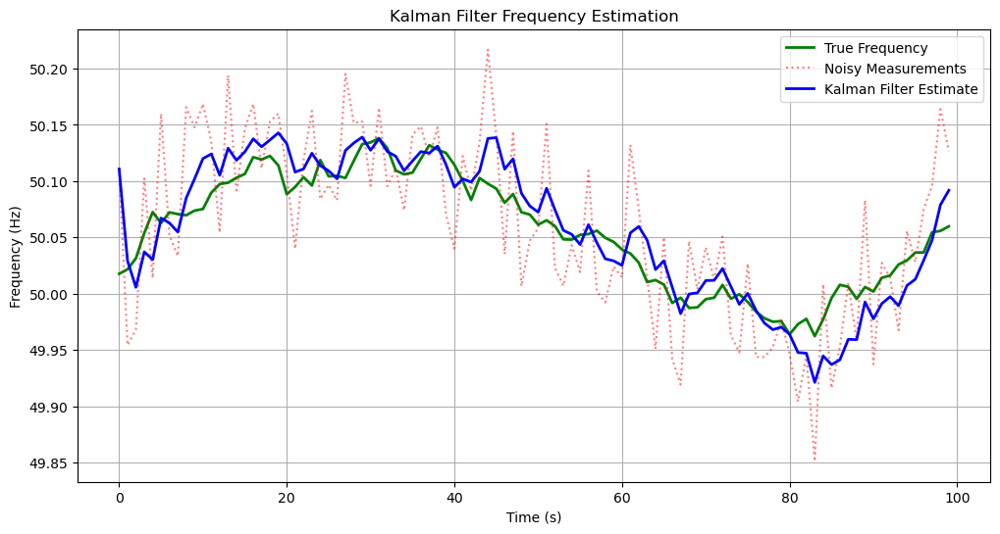

In [23]:
import numpy as np
import matplotlib.pyplot as plt

# Simulated true frequency values and noisy measurements
np.random.seed(0)  # For reproducibility
true_frequency = 50 + np.cumsum(np.random.normal(0, 0.01, 100))  # True frequency
measurements = true_frequency + np.random.normal(0, 0.05, 100)  # Noisy measurements

# Kalman filter parameters
Q = 0.001  # Process noise covariance
R = 0.01   # Measurement noise covariance
P = 1      # Initial error covariance
x_hat = 50 # Initial estimate

# Store estimates for plotting
estimates = []

# Kalman Filter Implementation
for z in measurements:
    # Prediction step
    x_hat_minus = x_hat  # Predicted state
    P_minus = P + Q      # Predicted covariance

    # Update step
    K = P_minus / (P_minus + R)  # Kalman Gain
    x_hat = x_hat_minus + K * (z - x_hat_minus)  # Updated estimate
    P = (1 - K) * P_minus          # Updated covariance

    # Store the estimate
    estimates.append(x_hat)

# Plotting results
plt.figure(figsize=(12, 6))
plt.plot(true_frequency, label='True Frequency', color='green', linewidth=2)
plt.plot(measurements, label='Noisy Measurements', color='red', linestyle='dotted', alpha=0.5)
plt.plot(estimates, label='Kalman Filter Estimate', color='blue', linewidth=2)
plt.title('Kalman Filter Frequency Estimation')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.legend()
plt.grid()
plt.show()


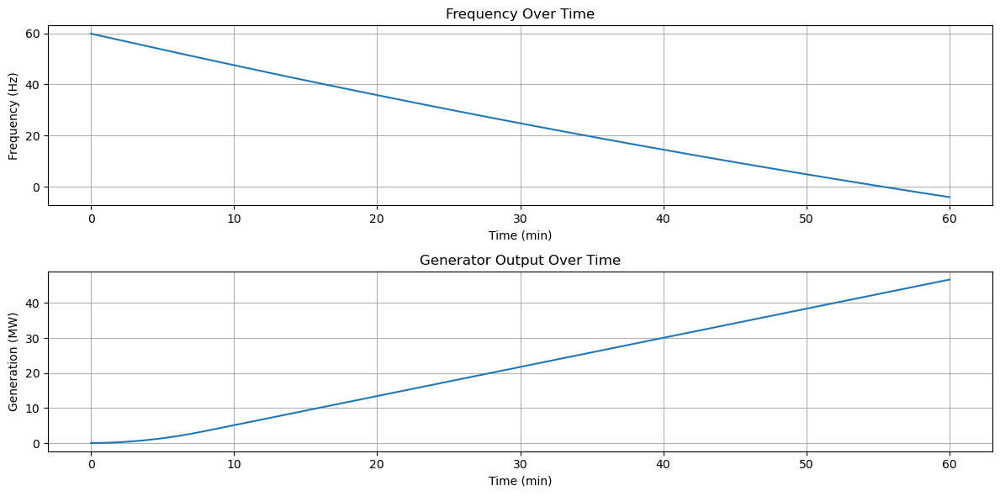

In [25]:
import numpy as np
import matplotlib.pyplot as plt

# Constants
H = 10  # System inertia constant (seconds)
R = 5   # Maximum ramp rate (MW/min)
P_d = 150  # Demand (MW)
time = np.linspace(0, 60, 600)  # 0 to 60 minutes

# Initialize variables
P_g = 0  # Initial generation
F = 60   # Initial frequency (Hz)
frequencies = []
generations = []

# Control gains
K_p = 0.1
K_i = 0.01
K_d = 0.01

# Simulation loop
for t in time:
    # Calculate power mismatch
    delta_P = P_g - P_d

    # Calculate RoCoF
    rocof = delta_P / (2 * H)

    # Update frequency
    F += rocof / 60  # Convert min to sec
    frequencies.append(F)

    # Control signal (simple PI controller)
    u = K_p * (60 - F)  # Target frequency of 60 Hz
    u = np.clip(u, 0, 1)  # Limit control signal to [0,1]

    # Update generation based on ramp rate
    P_g += R * u / 60  # Ramp up/down generation (MW)

    # Store generation for plotting
    generations.append(P_g)

# Plot results
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(time, frequencies)
plt.title('Frequency Over Time')
plt.xlabel('Time (min)')
plt.ylabel('Frequency (Hz)')
plt.grid()

plt.subplot(2, 1, 2)
plt.plot(time, generations)
plt.title('Generator Output Over Time')
plt.xlabel('Time (min)')
plt.ylabel('Generation (MW)')
plt.grid()

plt.tight_layout()
plt.show()


In [12]:
pip install numpy pandas scikit-learn keras tensorflow


Note: you may need to restart the kernel to use updated packages.


In [14]:
import numpy as np
import pandas as pd
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from keras.models import Sequential
from keras.layers import Dense, LSTM
from keras.layers import SimpleRNN

# Load the weather data and power output data (first 200 rows)
weather_data = pd.read_csv('weather_data.csv').head(700)
power_output_data = pd.read_csv('power_data.csv').head(700)

# Merge the weather data with power output data (using first 200 rows from each)
data = pd.concat([weather_data, power_output_data], axis=1)

# Select features and target
X = data[['wind_speed']].values  # Features (e.g., wind speed)
y = data['power_output'].values  # Target (wind power output)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 1. Support Vector Machine (SVM) Model
svm_model = SVR(kernel='rbf')
svm_model.fit(X_train, y_train)
svm_preds_train = svm_model.predict(X_train)
svm_preds_test = svm_model.predict(X_test)

# 2. Recurrent Neural Network (RNN) Model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(units=50, activation='relu', input_shape=(X_train.shape[1], 1)))
rnn_model.add(Dense(1))
rnn_model.compile(optimizer='adam', loss='mean_squared_error')
rnn_model.fit(X_train, y_train, epochs=50, batch_size=32)
rnn_preds_train = rnn_model.predict(X_train)
rnn_preds_test = rnn_model.predict(X_test)

# 3. Long Short-Term Memory (LSTM) Model
lstm_model = Sequential()
lstm_model.add(LSTM(units=55, activation='relu', input_shape=(X_train.shape[1], 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mean_squared_error')
lstm_model.fit(X_train, y_train, epochs=55, batch_size=32)
lstm_preds_train = lstm_model.predict(X_train)
lstm_preds_test = lstm_model.predict(X_test)

# Stack the predictions of individual models
X_train_stack = np.column_stack((svm_preds_train, rnn_preds_train, lstm_preds_train))
X_test_stack = np.column_stack((svm_preds_test, rnn_preds_test, lstm_preds_test))

# 4. Meta-model (Linear Regression) to combine base model predictions
meta_model = LinearRegression()
meta_model.fit(X_train_stack, y_train)

# Predict using the stacked model
final_preds_train = meta_model.predict(X_train_stack)
final_preds_test = meta_model.predict(X_test_stack)

# Evaluate the performance
train_mae = mean_absolute_error(y_train, final_preds_train)
test_mae = mean_absolute_error(y_test, final_preds_test)

print(f'Training MAE: {train_mae}')
print(f'Test MAE: {test_mae}')


Epoch 1/50


C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 62129.1172
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 54597.5508
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 53846.6016
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 59085.8398 
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 55284.5117  
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 58921.7227  
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 61736.8242
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 59422.4414  
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 54758.3320 
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 50876.8320
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 54450.7852 3
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 53218.6094
Epoch 13/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 53371.4844 
Epoch 14/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 54909.1328
Epoch 15/50
18/18 ━━━━━━━━━━━

In [20]:
import numpy as np
import pandas as pd
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import MinMaxScaler  # Import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM
from keras.layers import SimpleRNN

# Load the weather data and power output data (first 700 rows)
weather_data = pd.read_csv('weather_data.csv').head(710)
power_output_data = pd.read_csv('power_data.csv').head(710)

# Merge the weather data with power output data (using first 700 rows from each)
data = pd.concat([weather_data, power_output_data], axis=1)

# Select features and target
X = data[['wind_speed']].values  # Features (e.g., wind speed)
y = data['power_output'].values  # Target (wind power output)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature scaling: Use MinMaxScaler to scale only the input features (X) between 0 and 1
scaler = MinMaxScaler(feature_range=(0, 1))
X_train = scaler.fit_transform(X_train)  # Fit and transform training data
X_test = scaler.transform(X_test)        # Only transform test data

# 1. Support Vector Machine (SVM) Model
svm_model = SVR(kernel='rbf')
svm_model.fit(X_train, y_train)
svm_preds_train = svm_model.predict(X_train)
svm_preds_test = svm_model.predict(X_test)

# 2. Recurrent Neural Network (RNN) Model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(units=50, activation='relu', input_shape=(X_train.shape[1], 1)))
rnn_model.add(Dense(1))
rnn_model.compile(optimizer='adam', loss='mean_squared_error')
rnn_model.fit(X_train, y_train, epochs=50, batch_size=32)
rnn_preds_train = rnn_model.predict(X_train)
rnn_preds_test = rnn_model.predict(X_test)

# 3. Long Short-Term Memory (LSTM) Model
lstm_model = Sequential()
lstm_model.add(LSTM(units=55, activation='relu', input_shape=(X_train.shape[1], 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mean_squared_error')
lstm_model.fit(X_train, y_train, epochs=55, batch_size=32)
lstm_preds_train = lstm_model.predict(X_train)
lstm_preds_test = lstm_model.predict(X_test)

# Stack the predictions of individual models
X_train_stack = np.column_stack((svm_preds_train, rnn_preds_train, lstm_preds_train))
X_test_stack = np.column_stack((svm_preds_test, rnn_preds_test, lstm_preds_test))

# 4. Meta-model (Linear Regression) to combine base model predictions
meta_model = LinearRegression()
meta_model.fit(X_train_stack, y_train)

# Predict using the stacked model
final_preds_train = meta_model.predict(X_train_stack)
final_preds_test = meta_model.predict(X_test_stack)

# Evaluate the performance
train_mae = mean_absolute_error(y_train, final_preds_train)
test_mae = mean_absolute_error(y_test, final_preds_test)

print(f'Training MAE: {train_mae}')
print(f'Test MAE: {test_mae}')


Epoch 1/50


C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 56847.4180
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 58961.5312  
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 54642.8516 
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 59913.1602
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 62868.5352 0
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 60112.9688
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 64721.9414 
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 56053.0352
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 60864.9336 9
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 59055.6289 
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 59891.3867 
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 58085.1680
Epoch 13/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 54411.8047
Epoch 14/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 58738.4414  
Epoch 15/50
18/18 ━━━━━━━━━━

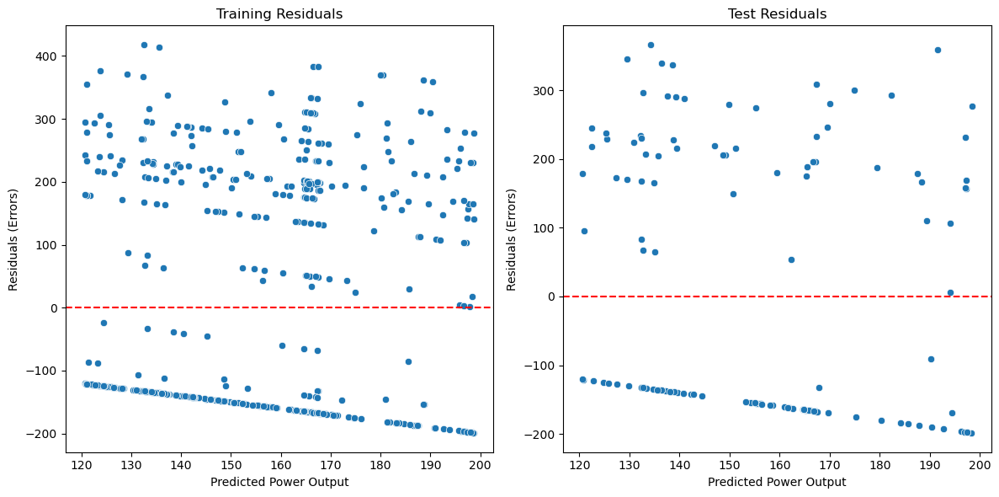

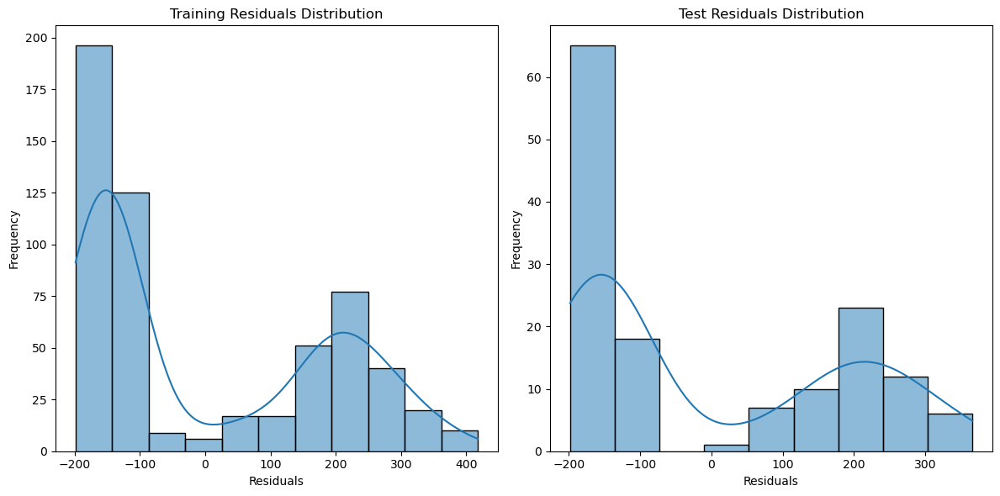

Training MAE: 175.21356618426458
Test MAE: 178.53562664773665
Training MSE: 34954.51381683413
Test MSE: 35444.13362301819
Training RMSE: 186.96126287772591
Test RMSE: 188.26612447017172
Training R²: 0.013531013374776357
Test R²: -0.019357530672855505


In [24]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler  # Import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM
from keras.layers import SimpleRNN

# Assuming you have the trained models and predictions (final_preds_train, final_preds_test)

# Calculate residuals (errors)
train_residuals = y_train - final_preds_train
test_residuals = y_test - final_preds_test

# Plotting residuals
plt.figure(figsize=(12, 6))

# Training residuals
plt.subplot(1, 2, 1)
sns.scatterplot(x=final_preds_train, y=train_residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title('Training Residuals')
plt.xlabel('Predicted Power Output')
plt.ylabel('Residuals (Errors)')

# Test residuals
plt.subplot(1, 2, 2)
sns.scatterplot(x=final_preds_test, y=test_residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title('Test Residuals')
plt.xlabel('Predicted Power Output')
plt.ylabel('Residuals (Errors)')

plt.tight_layout()
plt.show()

# Histogram of residuals
plt.figure(figsize=(12, 6))

# Training residuals
plt.subplot(1, 2, 1)
sns.histplot(train_residuals, kde=True)
plt.title('Training Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

# Test residuals
plt.subplot(1, 2, 2)
sns.histplot(test_residuals, kde=True)
plt.title('Test Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Evaluation metrics
train_mae = mean_absolute_error(y_train, final_preds_train)
test_mae = mean_absolute_error(y_test, final_preds_test)
train_mse = mean_squared_error(y_train, final_preds_train)
test_mse = mean_squared_error(y_test, final_preds_test)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = r2_score(y_train, final_preds_train)
test_r2 = r2_score(y_test, final_preds_test)

# Print out metrics
print(f'Training MAE: {train_mae}')
print(f'Test MAE: {test_mae}')
print(f'Training MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Training RMSE: {train_rmse}')
print(f'Test RMSE: {test_rmse}')
print(f'Training R²: {train_r2}')
print(f'Test R²: {test_r2}')


C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 60290.5352
Epoch 2/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 57610.1992
Epoch 3/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 53298.3516
Epoch 4/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 59113.0586
Epoch 5/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 54956.33593
Epoch 6/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 58559.7539 
Epoch 7/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 54934.8633
Epoch 8/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 49917.9922  
Epoch 9/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 53725.4375
Epoch 10/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 58825.0977 5
Epoch 11/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 49908.4883 6
Epoch 12/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 53835.6367
Epoch 13/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 55503.1211
Epoch 14/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 49273.6211  
Epoch 15/50
12/12 ━

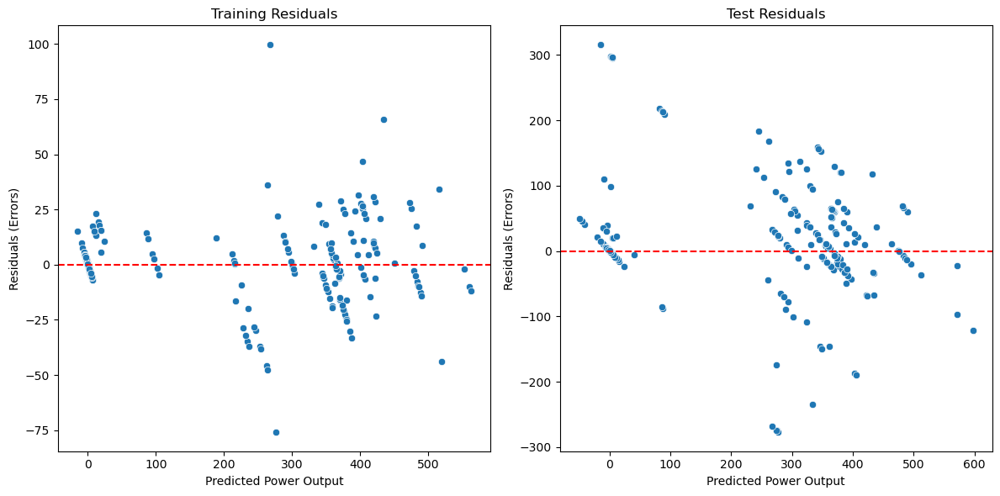

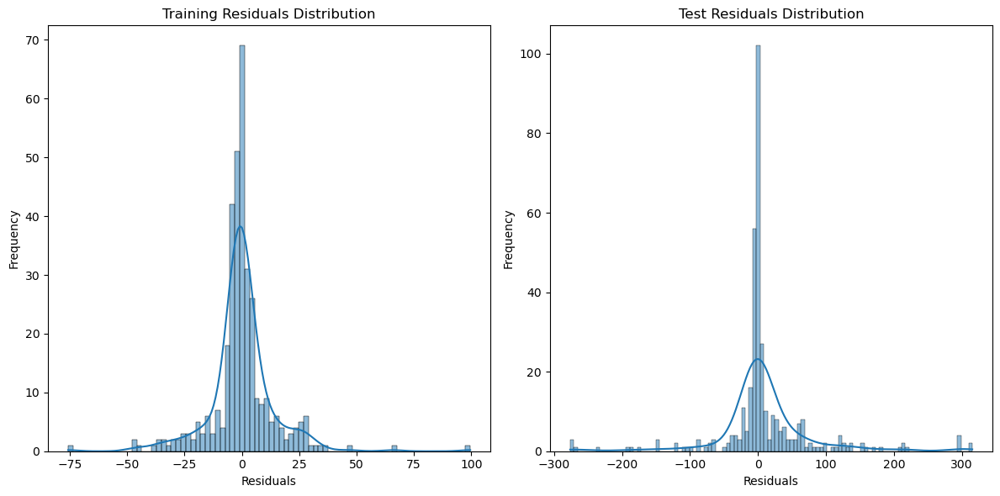

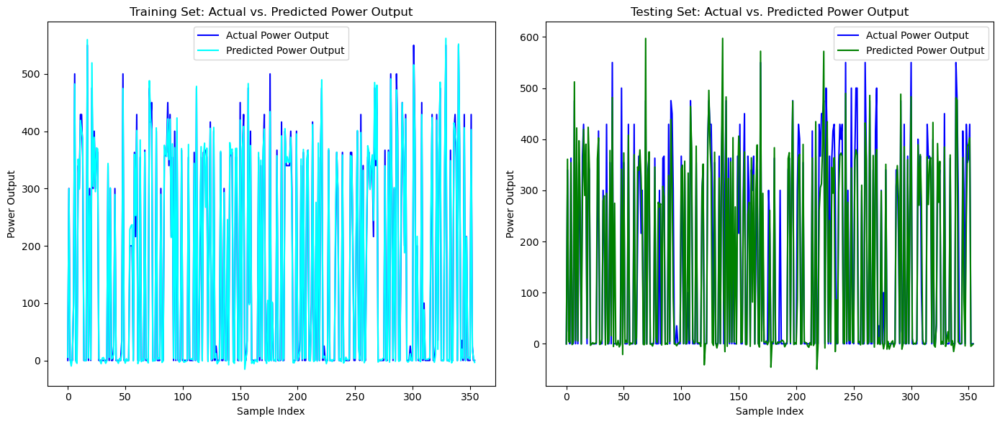

Training MAE: 8.431599644151536
Test MAE: 36.53123974463477
Training MSE: 207.3892303500443
Test MSE: 5264.2966782212025
Training RMSE: 14.401014906944729
Test RMSE: 72.55547311003632
Training R²: 0.9939245053749308
Test R²: 0.8555517379587562


In [30]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from keras.models import Sequential
from keras.layers import Dense, LSTM, SimpleRNN
import xgboost as xgb

# Load the weather data and power output data (first 700 rows)
weather_data = pd.read_csv('weather_data.csv').head(710)
power_output_data = pd.read_csv('power_data.csv').head(710)

# Merge the weather data with power output data (using first 700 rows from each)
data = pd.concat([weather_data, power_output_data], axis=1)

# Select features and target (Adding more features like temperature, humidity, and wind speed)
X = data[['wind_speed', 'temperature']].values  # Features
y = data['power_output'].values  # Target (wind power output)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

# Feature scaling: Use MinMaxScaler to scale only the input features (X) between 0 and 1
scaler = MinMaxScaler(feature_range=(0, 1))
X_train = scaler.fit_transform(X_train)  # Fit and transform training data
X_test = scaler.transform(X_test)        # Only transform test data

# Define models

# 1. Support Vector Machine (SVM) Model
svm_model = SVR(kernel='rbf')

# 2. Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# 3. XGBoost Regressor
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)

# 4. Recurrent Neural Network (RNN) Model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(units=50, activation='relu', input_shape=(X_train.shape[1], 1)))
rnn_model.add(Dense(1))
rnn_model.compile(optimizer='adam', loss='mean_squared_error')

# 5. Long Short-Term Memory (LSTM) Model
lstm_model = Sequential()
lstm_model.add(LSTM(units=55, activation='relu', input_shape=(X_train.shape[1], 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# Train models

# 1. SVM
svm_model.fit(X_train, y_train)
svm_preds_train = svm_model.predict(X_train)
svm_preds_test = svm_model.predict(X_test)

# 2. Random Forest
rf_model.fit(X_train, y_train)
rf_preds_train = rf_model.predict(X_train)
rf_preds_test = rf_model.predict(X_test)

# 3. XGBoost
xgb_model.fit(X_train, y_train)
xgb_preds_train = xgb_model.predict(X_train)
xgb_preds_test = xgb_model.predict(X_test)

# 4. RNN
rnn_model.fit(X_train, y_train, epochs=50, batch_size=32)
rnn_preds_train = rnn_model.predict(X_train)
rnn_preds_test = rnn_model.predict(X_test)

# 5. LSTM
lstm_model.fit(X_train, y_train, epochs=55, batch_size=32)
lstm_preds_train = lstm_model.predict(X_train)
lstm_preds_test = lstm_model.predict(X_test)

# Stack the predictions of individual models
X_train_stack = np.column_stack((svm_preds_train, rf_preds_train, xgb_preds_train, rnn_preds_train, lstm_preds_train))
X_test_stack = np.column_stack((svm_preds_test, rf_preds_test, xgb_preds_test, rnn_preds_test, lstm_preds_test))

# Meta-model (Linear Regression) to combine base model predictions
meta_model = LinearRegression()
meta_model.fit(X_train_stack, y_train)

# Predict using the stacked model
final_preds_train = meta_model.predict(X_train_stack)
final_preds_test = meta_model.predict(X_test_stack)

# Calculate residuals (errors)
train_residuals = y_train - final_preds_train
test_residuals = y_test - final_preds_test

# Plotting residuals
plt.figure(figsize=(12, 6))

# Training residuals
plt.subplot(1, 2, 1)
sns.scatterplot(x=final_preds_train, y=train_residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title('Training Residuals')
plt.xlabel('Predicted Power Output')
plt.ylabel('Residuals (Errors)')

# Test residuals
plt.subplot(1, 2, 2)
sns.scatterplot(x=final_preds_test, y=test_residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title('Test Residuals')
plt.xlabel('Predicted Power Output')
plt.ylabel('Residuals (Errors)')

plt.tight_layout()
plt.show()

# Histogram of residuals
plt.figure(figsize=(12, 6))

# Training residuals
plt.subplot(1, 2, 1)
sns.histplot(train_residuals, kde=True)
plt.title('Training Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

# Test residuals
plt.subplot(1, 2, 2)
sns.histplot(test_residuals, kde=True)
plt.title('Test Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Plot Actual vs. Predicted Power Output
plt.figure(figsize=(14, 6))

# Training Set
plt.subplot(1, 2, 1)
plt.plot(y_train, label='Actual Power Output', color='blue')
plt.plot(final_preds_train, label='Predicted Power Output', color='cyan')
plt.title('Training Set: Actual vs. Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

# Testing Set
plt.subplot(1, 2, 2)
plt.plot(y_test, label='Actual Power Output', color='blue')
plt.plot(final_preds_test, label='Predicted Power Output', color='green')
plt.title('Testing Set: Actual vs. Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

plt.tight_layout()
plt.show()

# Evaluation metrics
train_mae = mean_absolute_error(y_train, final_preds_train)
test_mae = mean_absolute_error(y_test, final_preds_test)
train_mse = mean_squared_error(y_train, final_preds_train)
test_mse = mean_squared_error(y_test, final_preds_test)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = r2_score(y_train, final_preds_train)
test_r2 = r2_score(y_test, final_preds_test)

# Print out metrics
print(f'Training MAE: {train_mae}')
print(f'Test MAE: {test_mae}')
print(f'Training MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Training RMSE: {train_rmse}')
print(f'Test RMSE: {test_rmse}')
print(f'Training R²: {train_r2}')
print(f'Test R²: {test_r2}')


In [32]:
from sklearn.model_selection import cross_val_score, KFold
from sklearn.linear_model import LinearRegression
import numpy as np

# Define the cross-validation strategy
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Cross-validate SVM model
svm_scores = cross_val_score(svm_model, X, y, cv=kf, scoring='neg_mean_absolute_error')
print("SVM MAE (Cross-Validation):", -np.mean(svm_scores))

# Cross-validate Random Forest model
rf_scores = cross_val_score(rf_model, X, y, cv=kf, scoring='neg_mean_absolute_error')
print("Random Forest MAE (Cross-Validation):", -np.mean(rf_scores))

# Cross-validate XGBoost model
xgb_scores = cross_val_score(xgb_model, X, y, cv=kf, scoring='neg_mean_absolute_error')
print("XGBoost MAE (Cross-Validation):", -np.mean(xgb_scores))


SVM MAE (Cross-Validation): 89.06729110801032
Random Forest MAE (Cross-Validation): 32.779814574152944
XGBoost MAE (Cross-Validation): 36.601302384235986


In [34]:
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import LinearRegression

# Train each base model on the full dataset to get predictions for stacking
svm_model.fit(X, y)
rf_model.fit(X, y)
xgb_model.fit(X, y)

# Get predictions from each base model to form a new training set for the meta-model
svm_preds = svm_model.predict(X).reshape(-1, 1)
rf_preds = rf_model.predict(X).reshape(-1, 1)
xgb_preds = xgb_model.predict(X).reshape(-1, 1)

# Stack predictions
X_stack = np.hstack((svm_preds, rf_preds, xgb_preds))

# Initialize the meta-model
meta_model = LinearRegression()

# Perform cross-validation on the stacked model
stacked_preds = cross_val_predict(meta_model, X_stack, y, cv=kf)
stacked_mae = mean_absolute_error(y, stacked_preds)

print("Stacked Model MAE (Cross-Validation):", stacked_mae)


Stacked Model MAE (Cross-Validation): 14.253457254885328


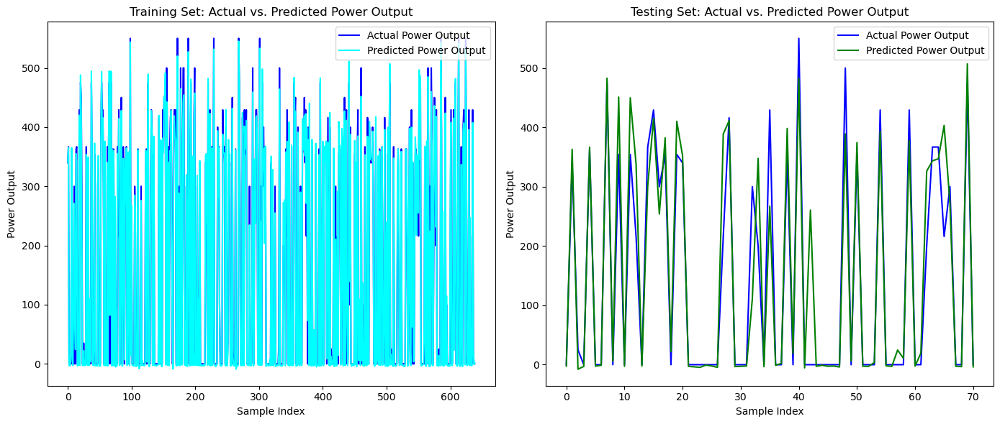

Training MAE: 13.605746727110063
Test MAE: 34.95393511805257
Training MSE: 561.2203585321666
Test MSE: 4310.390693056508
Training RMSE: 23.69008988020448
Test RMSE: 65.65356572994727
Training R²: 0.9841662120133581
Test R²: 0.872953784882773


In [40]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
import pandas as pd

# Load and prepare data
weather_data = pd.read_csv('weather_data.csv').head(710)
power_output_data = pd.read_csv('power_data.csv').head(710)
data = pd.concat([weather_data, power_output_data], axis=1)
X = data[['wind_speed', 'temperature']].values
y = data['power_output'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Feature scaling
scaler = MinMaxScaler(feature_range=(0, 1))
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Define base models: Random Forest and XGBoost
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)

# Train base models
rf_model.fit(X_train, y_train)
xgb_model.fit(X_train, y_train)

# Generate predictions for training and testing sets
rf_preds_train = rf_model.predict(X_train)
rf_preds_test = rf_model.predict(X_test)
xgb_preds_train = xgb_model.predict(X_train)
xgb_preds_test = xgb_model.predict(X_test)

# Stack predictions as features for the meta-model
X_train_stack = np.column_stack((rf_preds_train, xgb_preds_train))
X_test_stack = np.column_stack((rf_preds_test, xgb_preds_test))

# Define and train the meta-model
meta_model = LinearRegression()
meta_model.fit(X_train_stack, y_train)

# Make final predictions using the stacked model
final_preds_train = meta_model.predict(X_train_stack)
final_preds_test = meta_model.predict(X_test_stack)

# Plot Actual vs. Predicted Power Output
plt.figure(figsize=(14, 6))

# Training Set
plt.subplot(1, 2, 1)
plt.plot(y_train, label='Actual Power Output', color='blue')
plt.plot(final_preds_train, label='Predicted Power Output', color='cyan')
plt.title('Training Set: Actual vs. Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

# Testing Set
plt.subplot(1, 2, 2)
plt.plot(y_test, label='Actual Power Output', color='blue')
plt.plot(final_preds_test, label='Predicted Power Output', color='green')
plt.title('Testing Set: Actual vs. Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

plt.tight_layout()
plt.show()

# Calculate and print evaluation metrics
train_mae = mean_absolute_error(y_train, final_preds_train)
test_mae = mean_absolute_error(y_test, final_preds_test)
train_mse = mean_squared_error(y_train, final_preds_train)
test_mse = mean_squared_error(y_test, final_preds_test)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = r2_score(y_train, final_preds_train)
test_r2 = r2_score(y_test, final_preds_test)

print(f'Training MAE: {train_mae}')
print(f'Test MAE: {test_mae}')
print(f'Training MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Training RMSE: {train_rmse}')
print(f'Test RMSE: {test_rmse}')
print(f'Training R²: {train_r2}')
print(f'Test R²: {test_r2}')


C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 53837.6875
Epoch 2/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 52830.6484
Epoch 3/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 54423.07813
Epoch 4/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 57365.1250 
Epoch 5/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 54212.0938 
Epoch 6/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 58720.0703 
Epoch 7/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 55163.1680
Epoch 8/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 54994.6094 0
Epoch 9/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 54423.23837
Epoch 10/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 53584.7891
Epoch 11/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 49730.4062 
Epoch 12/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 53767.66800
Epoch 13/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 48268.7227  
Epoch 14/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 48258.4727
Epoch 15/50
12/12 

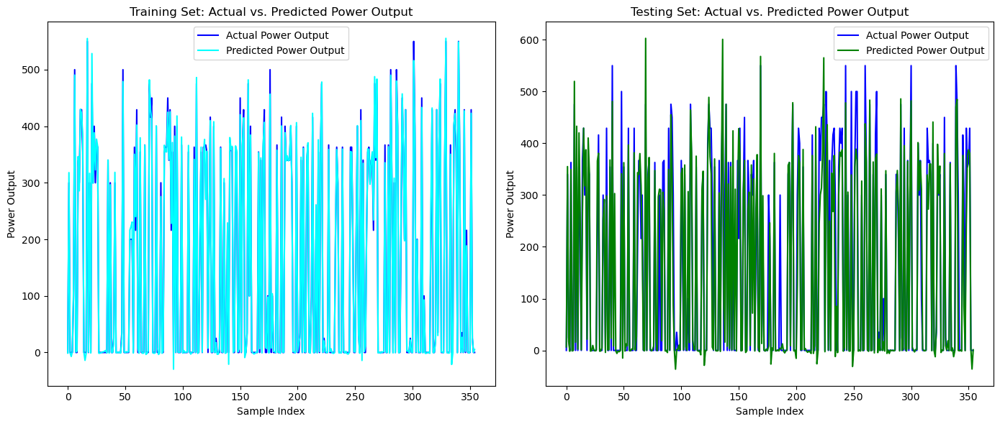

Training MAE: 6.412654572682656
Test MAE: 36.12173439938417
Training MSE: 141.57326552936402
Test MSE: 5433.356953283787
Training RMSE: 11.898456434738248
Test RMSE: 73.71130817780802
Training R²: 0.995852592671638
Test R²: 0.85091285371539


In [44]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from keras.models import Sequential
from keras.layers import Dense, LSTM, SimpleRNN
import xgboost as xgb

# Load the weather data and power output data (first 700 rows)
weather_data = pd.read_csv('weather_data.csv').head(710)
power_output_data = pd.read_csv('power_data.csv').head(710)

# Merge the weather data with power output data (using first 700 rows from each)
data = pd.concat([weather_data, power_output_data], axis=1)

# Select features and target
X = data[['wind_speed', 'temperature']].values  # Features
y = data['power_output'].values  # Target

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

# Feature scaling
scaler = MinMaxScaler(feature_range=(0, 1))
X_train = scaler.fit_transform(X_train)  # Fit and transform training data
X_test = scaler.transform(X_test)        # Only transform test data

# Define models

# 1. Support Vector Machine (SVM) Model
svm_model = SVR(kernel='rbf')

# 2. Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# 3. XGBoost Regressor
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)

# 4. Gradient Boosting Regressor
gb_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)

# 5. K-Nearest Neighbors Regressor
knn_model = KNeighborsRegressor(n_neighbors=5)

# 6. Recurrent Neural Network (RNN) Model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(units=50, activation='relu', input_shape=(X_train.shape[1], 1)))
rnn_model.add(Dense(1))
rnn_model.compile(optimizer='adam', loss='mean_squared_error')

# 7. Long Short-Term Memory (LSTM) Model
lstm_model = Sequential()
lstm_model.add(LSTM(units=55, activation='relu', input_shape=(X_train.shape[1], 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# Train models

# 1. SVM
svm_model.fit(X_train, y_train)
svm_preds_train = svm_model.predict(X_train)
svm_preds_test = svm_model.predict(X_test)

# 2. Random Forest
rf_model.fit(X_train, y_train)
rf_preds_train = rf_model.predict(X_train)
rf_preds_test = rf_model.predict(X_test)

# 3. XGBoost
xgb_model.fit(X_train, y_train)
xgb_preds_train = xgb_model.predict(X_train)
xgb_preds_test = xgb_model.predict(X_test)

# 4. Gradient Boosting
gb_model.fit(X_train, y_train)
gb_preds_train = gb_model.predict(X_train)
gb_preds_test = gb_model.predict(X_test)

# 5. K-Nearest Neighbors
knn_model.fit(X_train, y_train)
knn_preds_train = knn_model.predict(X_train)
knn_preds_test = knn_model.predict(X_test)

# 6. RNN
X_train_rnn = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test_rnn = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
rnn_model.fit(X_train_rnn, y_train, epochs=50, batch_size=32)
rnn_preds_train = rnn_model.predict(X_train_rnn).flatten()
rnn_preds_test = rnn_model.predict(X_test_rnn).flatten()

# 7. LSTM
lstm_model.fit(X_train_rnn, y_train, epochs=55, batch_size=32)
lstm_preds_train = lstm_model.predict(X_train_rnn).flatten()
lstm_preds_test = lstm_model.predict(X_test_rnn).flatten()

# Stack the predictions of individual models
X_train_stack = np.column_stack((svm_preds_train, rf_preds_train, xgb_preds_train, gb_preds_train, knn_preds_train, rnn_preds_train, lstm_preds_train))
X_test_stack = np.column_stack((svm_preds_test, rf_preds_test, xgb_preds_test, gb_preds_test, knn_preds_test, rnn_preds_test, lstm_preds_test))

# Meta-model (Linear Regression) to combine base model predictions
meta_model = LinearRegression()
meta_model.fit(X_train_stack, y_train)

# Predict using the stacked model
final_preds_train = meta_model.predict(X_train_stack)
final_preds_test = meta_model.predict(X_test_stack)

# Calculate residuals (errors)
train_residuals = y_train - final_preds_train
test_residuals = y_test - final_preds_test

# Plotting actual vs. predicted for training and testing sets
plt.figure(figsize=(14, 6))

# Training Set
plt.subplot(1, 2, 1)
plt.plot(y_train, label='Actual Power Output', color='blue')
plt.plot(final_preds_train, label='Predicted Power Output', color='cyan')
plt.title('Training Set: Actual vs. Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

# Testing Set
plt.subplot(1, 2, 2)
plt.plot(y_test, label='Actual Power Output', color='blue')
plt.plot(final_preds_test, label='Predicted Power Output', color='green')
plt.title('Testing Set: Actual vs. Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

plt.tight_layout()
plt.show()

# Evaluation metrics
train_mae = mean_absolute_error(y_train, final_preds_train)
test_mae = mean_absolute_error(y_test, final_preds_test)
train_mse = mean_squared_error(y_train, final_preds_train)
test_mse = mean_squared_error(y_test, final_preds_test)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = r2_score(y_train, final_preds_train)
test_r2 = r2_score(y_test, final_preds_test)

# Print out metrics
print(f'Training MAE: {train_mae}')
print(f'Test MAE: {test_mae}')
print(f'Training MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Training RMSE: {train_rmse}')
print(f'Test RMSE: {test_rmse}')
print(f'Training R²: {train_r2}')
print(f'Test R²: {test_r2}')


C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - loss: 56610.9961
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 55605.8516 
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 55993.6719 
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 65262.9336   
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 57439.6875   
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 57877.7539
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 58068.6992 
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 56871.2617
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 59227.5352
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 56542.8711 8
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 53925.1523  
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 53134.0234 
Epoch 13/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 51968.5117
Epoch 14/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 50564.6172
Epoch 15/50
18

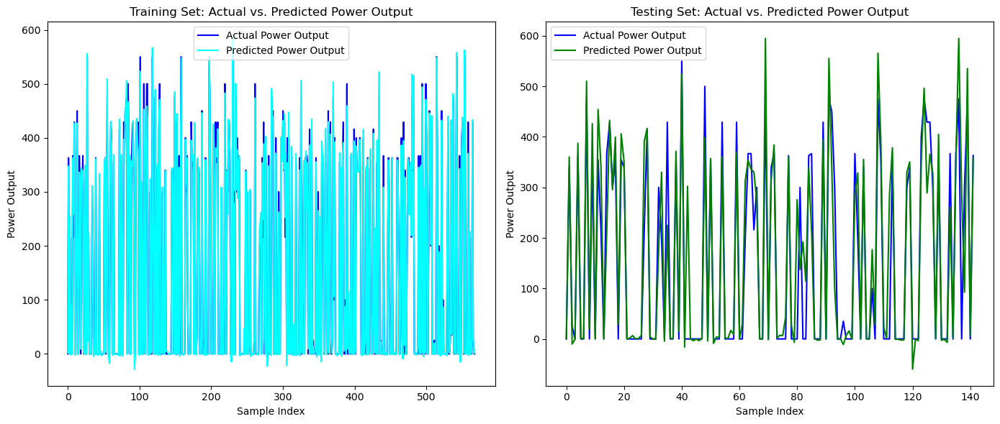

Training MAE: 9.561965285974706
Test MAE: 43.32095146909069
Training MSE: 298.2488337832622
Test MSE: 6197.4432424290935
Training RMSE: 17.269882274736624
Test RMSE: 78.72384163916986
Training R²: 0.9915829690446836
Test R²: 0.8217642866580034


In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression, Ridge
from keras.models import Sequential
from keras.layers import Dense, LSTM, SimpleRNN
import xgboost as xgb

# Load the weather data and power output data (first 700 rows)
weather_data = pd.read_csv('weather_data.csv').head(710)
power_output_data = pd.read_csv('power_data.csv').head(710)

# Merge the weather data with power output data (using first 700 rows from each)
data = pd.concat([weather_data, power_output_data], axis=1)

# Select features and target
X = data[['wind_speed', 'temperature']].values  # Features
y = data['power_output'].values  # Target

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature scaling
scaler = MinMaxScaler(feature_range=(0, 1))
X_train = scaler.fit_transform(X_train)  # Fit and transform training data
X_test = scaler.transform(X_test)        # Only transform test data

# Define models

# 1. Support Vector Machine (SVM) Model
svm_model = SVR(kernel='rbf')

# 2. Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# 3. XGBoost Regressor
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)

# 4. Gradient Boosting Regressor
gb_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)

# 5. K-Nearest Neighbors Regressor
knn_model = KNeighborsRegressor(n_neighbors=5)

# 6. Recurrent Neural Network (RNN) Model
rnn_model = Sequential()
rnn_model.add(SimpleRNN(units=50, activation='relu', input_shape=(X_train.shape[1], 1)))
rnn_model.add(Dense(1))
rnn_model.compile(optimizer='adam', loss='mean_squared_error')

# 7. Long Short-Term Memory (LSTM) Model
lstm_model = Sequential()
lstm_model.add(LSTM(units=55, activation='relu', input_shape=(X_train.shape[1], 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# Train models

# 1. SVM
svm_model.fit(X_train, y_train)
svm_preds_train = svm_model.predict(X_train)
svm_preds_test = svm_model.predict(X_test)

# 2. Random Forest
rf_model.fit(X_train, y_train)
rf_preds_train = rf_model.predict(X_train)
rf_preds_test = rf_model.predict(X_test)

# 3. XGBoost
xgb_model.fit(X_train, y_train)
xgb_preds_train = xgb_model.predict(X_train)
xgb_preds_test = xgb_model.predict(X_test)

# 4. Gradient Boosting
gb_model.fit(X_train, y_train)
gb_preds_train = gb_model.predict(X_train)
gb_preds_test = gb_model.predict(X_test)

# 5. K-Nearest Neighbors
knn_model.fit(X_train, y_train)
knn_preds_train = knn_model.predict(X_train)
knn_preds_test = knn_model.predict(X_test)

# 6. RNN
X_train_rnn = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test_rnn = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
rnn_model.fit(X_train_rnn, y_train, epochs=50, batch_size=32)
rnn_preds_train = rnn_model.predict(X_train_rnn).flatten()
rnn_preds_test = rnn_model.predict(X_test_rnn).flatten()

# 7. LSTM
lstm_model.fit(X_train_rnn, y_train, epochs=55, batch_size=32)
lstm_preds_train = lstm_model.predict(X_train_rnn).flatten()
lstm_preds_test = lstm_model.predict(X_test_rnn).flatten()

# Stack the predictions of individual models
X_train_stack = np.column_stack((svm_preds_train, rf_preds_train, xgb_preds_train, gb_preds_train, knn_preds_train, rnn_preds_train, lstm_preds_train))
X_test_stack = np.column_stack((svm_preds_test, rf_preds_test, xgb_preds_test, gb_preds_test, knn_preds_test, rnn_preds_test, lstm_preds_test))

# Meta-model (Ridge Regression) to combine base model predictions (L2 regularization)
meta_model = Ridge(alpha=1.0)  # 'alpha' is the regularization strength
meta_model.fit(X_train_stack, y_train)

# Predict using the stacked model
final_preds_train = meta_model.predict(X_train_stack)
final_preds_test = meta_model.predict(X_test_stack)

# Calculate residuals (errors)
train_residuals = y_train - final_preds_train
test_residuals = y_test - final_preds_test

# Plotting actual vs. predicted for training and testing sets
plt.figure(figsize=(14, 6))

# Training Set
plt.subplot(1, 2, 1)
plt.plot(y_train, label='Actual Power Output', color='blue')
plt.plot(final_preds_train, label='Predicted Power Output', color='cyan')
plt.title('Training Set: Actual vs. Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

# Testing Set
plt.subplot(1, 2, 2)
plt.plot(y_test, label='Actual Power Output', color='blue')
plt.plot(final_preds_test, label='Predicted Power Output', color='green')
plt.title('Testing Set: Actual vs. Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

plt.tight_layout()
plt.show()

# Evaluation metrics
train_mae = mean_absolute_error(y_train, final_preds_train)
test_mae = mean_absolute_error(y_test, final_preds_test)
train_mse = mean_squared_error(y_train, final_preds_train)
test_mse = mean_squared_error(y_test, final_preds_test)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = r2_score(y_train, final_preds_train)
test_r2 = r2_score(y_test, final_preds_test)

# Print out metrics
print(f'Training MAE: {train_mae}')
print(f'Test MAE: {test_mae}')
print(f'Training MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Training RMSE: {train_rmse}')
print(f'Test RMSE: {test_rmse}')
print(f'Training R²: {train_r2}')
print(f'Test R²: {test_r2}')


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.linear_model import Ridge
from keras.models import Sequential
from keras.layers import Dense, LSTM, SimpleRNN
import xgboost as xgb
from prophet import Prophet

# Load the weather data and power output data (first 700 rows)
weather_data = pd.read_csv('weather_data.csv').head(710)
power_output_data = pd.read_csv('power_data.csv').head(710)

# Merge the weather data with power output data (using first 700 rows from each)
data = pd.concat([weather_data, power_output_data], axis=1)

# Prepare data for Prophet (Prophet requires a 'ds' (date) and 'y' (target) column)
data_prophet = data[['timestamp', 'power_output']]  # Assuming 'date' is the column with datetime information
data_prophet['timestamp'] = pd.to_datetime(data_prophet['timestamp'])  # Ensure the date column is datetime
data_prophet = data_prophet.rename(columns={'timestamp': 'ds', 'power_output': 'y'})

# Split data into training and testing sets
train_prophet = data_prophet[:int(0.8*len(data_prophet))]  # Use 80% of data for training
test_prophet = data_prophet[int(0.8*len(data_prophet)):]

# Prophet model
prophet_model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)
prophet_model.fit(train_prophet)

# Create a dataframe to make predictions (extending the dates for prediction)
future = prophet_model.make_future_dataframe(train_prophet, periods=len(test_prophet), freq='D')
forecast = prophet_model.predict(future)

# Extract the predicted values
prophet_preds_train = forecast['yhat'][:len(train_prophet)]
prophet_preds_test = forecast['yhat'][-len(test_prophet):]

# Calculate the residuals for Prophet
train_residuals_prophet = train_prophet['y'] - prophet_preds_train
test_residuals_prophet = test_prophet['y'] - prophet_preds_test

# Plotting actual vs. predicted for Prophet
plt.figure(figsize=(14, 6))

# Training Set
plt.subplot(1, 2, 1)
plt.plot(train_prophet['ds'], train_prophet['y'], label='Actual Power Output', color='blue')
plt.plot(train_prophet['ds'], prophet_preds_train, label='Predicted Power Output', color='cyan')
plt.title('Training Set: Prophet Actual vs. Predicted Power Output')
plt.xlabel('Date')
plt.ylabel('Power Output')
plt.legend()

# Testing Set
plt.subplot(1, 2, 2)
plt.plot(test_prophet['ds'], test_prophet['y'], label='Actual Power Output', color='blue')
plt.plot(test_prophet['ds'], prophet_preds_test, label='Predicted Power Output', color='green')
plt.title('Testing Set: Prophet Actual vs. Predicted Power Output')
plt.xlabel('Date')
plt.ylabel('Power Output')
plt.legend()

plt.tight_layout()
plt.show()

# Evaluate Prophet model (MAE, MSE, RMSE, R²)
train_mae_prophet = mean_absolute_error(train_prophet['y'], prophet_preds_train)
test_mae_prophet = mean_absolute_error(test_prophet['y'], prophet_preds_test)
train_mse_prophet = mean_squared_error(train_prophet['y'], prophet_preds_train)
test_mse_prophet = mean_squared_error(test_prophet['y'], prophet_preds_test)
train_rmse_prophet = np.sqrt(train_mse_prophet)
test_rmse_prophet = np.sqrt(test_mse_prophet)
train_r2_prophet = r2_score(train_prophet['y'], prophet_preds_train)
test_r2_prophet = r2_score(test_prophet['y'], prophet_preds_test)

# Print out Prophet metrics
print(f'Prophet Training MAE: {train_mae_prophet}')
print(f'Prophet Test MAE: {test_mae_prophet}')
print(f'Prophet Training MSE: {train_mse_prophet}')
print(f'Prophet Test MSE: {test_mse_prophet}')
print(f'Prophet Training RMSE: {train_rmse_prophet}')
print(f'Prophet Test RMSE: {test_rmse_prophet}')
print(f'Prophet Training R²: {train_r2_prophet}')
print(f'Prophet Test R²: {test_r2_prophet}')

# Continue stacking Prophet with other models

# Stack the predictions of individual models (including Prophet) along with other base models
X_train_stack = np.column_stack((svm_preds_train, rf_preds_train, xgb_preds_train, gb_preds_train, knn_preds_train, rnn_preds_train, lstm_preds_train, prophet_preds_train))
X_test_stack = np.column_stack((svm_preds_test, rf_preds_test, xgb_preds_test, gb_preds_test, knn_preds_test, rnn_preds_test, lstm_preds_test, prophet_preds_test))

# Meta-model (Ridge Regression) to combine base model predictions (L2 regularization)
meta_model = Ridge(alpha=1.0)
meta_model.fit(X_train_stack, y_train)

# Predict using the stacked model
final_preds_train = meta_model.predict(X_train_stack)
final_preds_test = meta_model.predict(X_test_stack)

# Calculate residuals (errors)
train_residuals = y_train - final_preds_train
test_residuals = y_test - final_preds_test

# Plotting actual vs. predicted for training and testing sets
plt.figure(figsize=(14, 6))

# Training Set
plt.subplot(1, 2, 1)
plt.plot(y_train, label='Actual Power Output', color='blue')
plt.plot(final_preds_train, label='Predicted Power Output', color='cyan')
plt.title('Training Set: Actual vs. Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

# Testing Set
plt.subplot(1, 2, 2)
plt.plot(y_test, label='Actual Power Output', color='blue')
plt.plot(final_preds_test, label='Predicted Power Output', color='green')
plt.title('Testing Set: Actual vs. Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

plt.tight_layout()
plt.show()

# Final Evaluation metrics
train_mae = mean_absolute_error(y_train, final_preds_train)
test_mae = mean_absolute_error(y_test, final_preds_test)
train_mse = mean_squared_error(y_train, final_preds_train)
test_mse = mean_squared_error(y_test, final_preds_test)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = r2_score(y_train, final_preds_train)
test_r2 = r2_score(y_test, final_preds_test)

# Print out final metrics
print(f'Training MAE: {train_mae}')
print(f'Test MAE: {test_mae}')
print(f'Training MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Training RMSE: {train_rmse}')
print(f'Test RMSE: {test_rmse}')
print(f'Training R²: {train_r2}')
print(f'Test R²: {test_r2}')


ValueError: cannot assemble with duplicate keys

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.linear_model import Ridge
from keras.models import Sequential
from keras.layers import Dense, LSTM, SimpleRNN
import xgboost as xgb
from prophet import Prophet

# Load the weather data and power output data (first 700 rows)
weather_data = pd.read_csv('weather_data.csv').head(710)
power_output_data = pd.read_csv('power_data.csv').head(710)

# Merge the weather data with power output data (using first 700 rows from each)
data = pd.concat([weather_data, power_output_data], axis=1)

# Select features and target
X = data[['wind_speed', 'temperature']].values  # Features
y = data['power_output'].values  # Target (wind power output)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

# Feature scaling
scaler = MinMaxScaler(feature_range=(0, 1))
X_train = scaler.fit_transform(X_train)  # Fit and transform training data
X_test = scaler.transform(X_test)        # Only transform test data

# Define base models

# 1. Support Vector Machine (SVM)
svm_model = SVR(kernel='rbf')

# 2. Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# 3. XGBoost Regressor
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)

# 4. Gradient Boosting Regressor
gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)

# 5. K-Nearest Neighbors Regressor
knn_model = KNeighborsRegressor(n_neighbors=5)

# 6. Recurrent Neural Network (RNN)
rnn_model = Sequential()
rnn_model.add(SimpleRNN(units=50, activation='relu', input_shape=(X_train.shape[1], 1)))
rnn_model.add(Dense(1))
rnn_model.compile(optimizer='adam', loss='mean_squared_error')

# 7. Long Short-Term Memory (LSTM)
lstm_model = Sequential()
lstm_model.add(LSTM(units=55, activation='relu', input_shape=(X_train.shape[1], 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# 8. Prophet Model (Time-series)
data_prophet = data[['timestamp', 'power_output']]  # Assuming 'date' column exists
data_prophet['timestamp'] = pd.to_datetime(data_prophet['timestamp'])  # Ensure the date column is datetime
data_prophet = data_prophet.rename(columns={'timestamp': 'ds', 'power_output': 'y'})

train_prophet = data_prophet[:int(0.8*len(data_prophet))]
test_prophet = data_prophet[int(0.8*len(data_prophet)):]

prophet_model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)
prophet_model.fit(train_prophet)

# Create a dataframe for predictions
future = prophet_model.make_future_dataframe(train_prophet, periods=len(test_prophet), freq='D')
forecast = prophet_model.predict(future)

prophet_preds_train = forecast['yhat'][:len(train_prophet)]
prophet_preds_test = forecast['yhat'][-len(test_prophet):]

# Train and Predict using other models

# 1. Train models (SVM, Random Forest, XGBoost, etc.)
svm_model.fit(X_train, y_train)
rf_model.fit(X_train, y_train)
xgb_model.fit(X_train, y_train)
gb_model.fit(X_train, y_train)
knn_model.fit(X_train, y_train)

rnn_model.fit(X_train, y_train, epochs=50, batch_size=32)
lstm_model.fit(X_train, y_train, epochs=55, batch_size=32)

# Get predictions from each model
svm_preds_train = svm_model.predict(X_train)
svm_preds_test = svm_model.predict(X_test)

rf_preds_train = rf_model.predict(X_train)
rf_preds_test = rf_model.predict(X_test)

xgb_preds_train = xgb_model.predict(X_train)
xgb_preds_test = xgb_model.predict(X_test)

gb_preds_train = gb_model.predict(X_train)
gb_preds_test = gb_model.predict(X_test)

knn_preds_train = knn_model.predict(X_train)
knn_preds_test = knn_model.predict(X_test)

rnn_preds_train = rnn_model.predict(X_train)
rnn_preds_test = rnn_model.predict(X_test)

lstm_preds_train = lstm_model.predict(X_train)
lstm_preds_test = lstm_model.predict(X_test)

# Stack predictions from all models, including Prophet
X_train_stack = np.column_stack((svm_preds_train, rf_preds_train, xgb_preds_train, gb_preds_train, knn_preds_train, rnn_preds_train, lstm_preds_train, prophet_preds_train))
X_test_stack = np.column_stack((svm_preds_test, rf_preds_test, xgb_preds_test, gb_preds_test, knn_preds_test, rnn_preds_test, lstm_preds_test, prophet_preds_test))

# Meta-model (Ridge Regression) to combine base model predictions
meta_model = Ridge(alpha=1.0)
meta_model.fit(X_train_stack, y_train)

# Final predictions using the stacked model
final_preds_train = meta_model.predict(X_train_stack)
final_preds_test = meta_model.predict(X_test_stack)

# Calculate residuals (errors)
train_residuals = y_train - final_preds_train
test_residuals = y_test - final_preds_test

# Plotting residuals
plt.figure(figsize=(12, 6))

# Training residuals
plt.subplot(1, 2, 1)
sns.scatterplot(x=final_preds_train, y=train_residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title('Training Residuals')
plt.xlabel('Predicted Power Output')
plt.ylabel('Residuals (Errors)')

# Test residuals
plt.subplot(1, 2, 2)
sns.scatterplot(x=final_preds_test, y=test_residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title('Test Residuals')
plt.xlabel('Predicted Power Output')
plt.ylabel('Residuals (Errors)')

plt.tight_layout()
plt.show()

# Histogram of residuals
plt.figure(figsize=(12, 6))

# Training residuals
plt.subplot(1, 2, 1)
sns.histplot(train_residuals, kde=True)
plt.title('Training Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

# Test residuals
plt.subplot(1, 2, 2)
sns.histplot(test_residuals, kde=True)
plt.title('Test Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Plot Actual vs. Predicted Power Output
plt.figure(figsize=(14, 6))

# Training Set
plt.subplot(1, 2, 1)
plt.plot(y_train, label='Actual Power Output', color='blue')
plt.plot(final_preds_train, label='Predicted Power Output', color='cyan')
plt.title('Training Set: Actual vs. Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

# Testing Set
plt.subplot(1, 2, 2)
plt.plot(y_test, label='Actual Power Output', color='blue')
plt.plot(final_preds_test, label='Predicted Power Output', color='green')
plt.title('Testing Set: Actual vs. Predicted Power Output')
plt.xlabel('Sample Index')
plt.ylabel('Power Output')
plt.legend()

plt.tight_layout()
plt.show()

# Evaluation metrics
train_mae = mean_absolute_error(y_train, final_preds_train)
test_mae = mean_absolute_error(y_test, final_preds_test)
train_mse = mean_squared_error(y_train, final_preds_train)
test_mse = mean_squared_error(y_test, final_preds_test)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = r2_score(y_train, final_preds_train)
test_r2 = r2_score(y_test, final_preds_test)

# Print out metrics
print(f'Training MAE: {train_mae}')
print(f'Test MAE: {test_mae}')
print(f'Training MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Training RMSE: {train_rmse}')
print(f'Test RMSE: {test_rmse}')
print(f'Training R²: {train_r2}')
print(f'Test R²: {test_r2}')


C:\Users\user\anaconda3\envs\ATLITE_Peter\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


ValueError: cannot assemble with duplicate keys

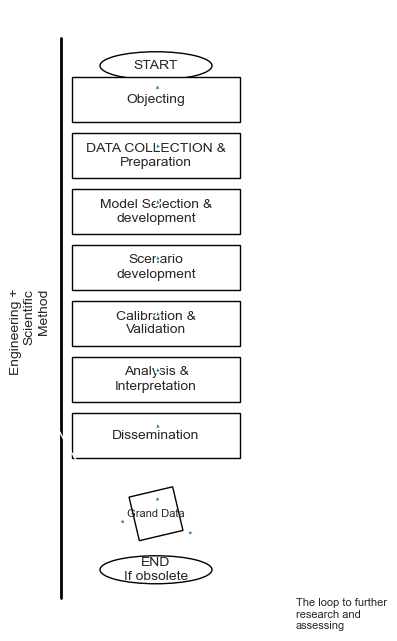

In [5]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

# Set a seaborn style (optional, but makes the plot look nicer)
sns.set_style("whitegrid")  # You can choose other styles like "darkgrid", "ticks", etc.

# Define shape positions and sizes (adjust as needed)
start_x, start_y = 0.5, 0.95
end_x, end_y = 0.5, 0.05
rect_width, rect_height = 0.3, 0.08
rect_spacing = 0.02

rect_labels = [
    "Objecting",
    "DATA COLLECTION &\nPreparation",
    "Model Selection &\ndevelopment",
    "Scenario\ndevelopment",
    "Calibration &\nValidation",
    "Analysis &\nInterpretation",
    "Dissemination",
]

# Create plot
fig, ax = plt.subplots(figsize=(6, 8))
ax.set_aspect("equal")
ax.axis("off")

# Draw Start and End ovals
start_oval = patches.Ellipse((start_x, start_y), 0.2, 0.05, angle=0, linewidth=1, edgecolor='black', facecolor='white')
end_oval = patches.Ellipse((end_x, end_y), 0.2, 0.05, angle=0, linewidth=1, edgecolor='black', facecolor='white')
ax.add_patch(start_oval)
ax.add_patch(end_oval)
plt.text(start_x, start_y, "START", ha="center", va="center")
plt.text(end_x, end_y, "END\nIf obsolete", ha="center", va="center")

# Draw Rectangles
rect_y = start_y - rect_height - rect_spacing
for label in rect_labels:
    rect = patches.Rectangle((start_x - rect_width / 2, rect_y), rect_width, rect_height, linewidth=1, edgecolor='black', facecolor='white')
    ax.add_patch(rect)
    plt.text(start_x, rect_y + rect_height / 2, label, ha="center", va="center")
    rect_y -= rect_height + rect_spacing

# Draw Diamond
diamond_y = rect_y + rect_height/2 - 0.04
diamond = patches.RegularPolygon((start_x, diamond_y), numVertices=4, radius=0.04*1.414, orientation=45, linewidth=1, edgecolor='black', facecolor='white')
ax.add_patch(diamond)
plt.text(start_x, diamond_y, "Grand Data", ha="center", va="center", fontsize=8)

# Draw Arrows (Corrected)
arrow_style = dict(arrowstyle="-|>", connectionstyle="arc3,rad=0.2")

# Start to first rect
plt.annotate("", xy=(start_x, start_y - 0.025), xytext=(start_x, start_y - rect_height/2), arrowprops=arrow_style)

# Rectangles
y = start_y - rect_height - rect_spacing/2
for i in range(len(rect_labels) - 1):
    plt.annotate("", xy=(start_x, y - rect_height/2), xytext=(start_x, y - rect_height - rect_spacing + rect_height/2), arrowprops=arrow_style)
    y -= rect_height + rect_spacing

# Last rect to diamond
plt.annotate("", xy=(start_x, rect_y + rect_height/2), xytext=(start_x, diamond_y + 0.025), arrowprops=arrow_style)

# Diamond to loop (Corrected)
plt.annotate("", xy=(start_x - 0.05, diamond_y - 0.025), 
             xytext=(start_x - 0.2, start_y - rect_height - rect_spacing + rect_height/2), 
             arrowprops=dict(arrowstyle="-|>", connectionstyle="arc3,rad=0.3"))

# Diamond to end (Corrected)
plt.annotate("", xy=(start_x + 0.05, diamond_y - 0.025), 
             xytext=(start_x + 0.2, end_y + 0.05), 
             arrowprops=dict(arrowstyle="-|>", connectionstyle="arc3,rad=-0.3"))

# Vertical Bar and Text
plt.plot([start_x - rect_width/2 - 0.02, start_x - rect_width/2 - 0.02], [start_y + 0.05, end_y - 0.05], color='black', linewidth=2)
plt.text(start_x - rect_width/2 - 0.04, start_y/2, "Engineering +\nScientific\nMethod", ha="right", va="center", rotation="vertical")

# Loop Text (Adjust position as needed)
plt.text(start_x + 0.25, diamond_y - 0.15, "The loop to further\nresearch and\nassessing", ha="left", va="top", fontsize=8)

plt.show()

In [11]:
import matplotlib.pyplot as plt
import networkx as nx

# Define flowchart nodes
nodes = [
    "START", "Objective", "Data Collection & Preparation",
    "Model Selection & Development", "Scenario Development",
    "Calibration & Validation", "Analysis & Interpretation",
    "Dissemination", "END if Obsolete"
]

# Define edges between nodes (arrows)
edges = [
    ("START", "Objective"),
    ("Objective", "Data Collection & Preparation"),
    ("Data Collection & Preparation", "Model Selection & Development"),
    ("Model Selection & Development", "Scenario Development"),
    ("Scenario Development", "Calibration & Validation"),
    ("Calibration & Validation", "Analysis & Interpretation"),
    ("Analysis & Interpretation", "Dissemination"),
    ("Dissemination", "END if Obsolete"),
    
    # Feedback loops
    ("Calibration & Validation", "Data Collection & Preparation"),
    ("Analysis & Interpretation", "Scenario Development"),
]

# Create a directed graph
G = nx.DiGraph()
G.add_nodes_from(nodes)
G.add_edges_from(edges)

# Define positions manually for better visualization
pos = {
    "START": (2, 8),
    "Objective": (2, 7),
    "Data Collection & Preparation": (2, 6),
    "Model Selection & Development": (2, 5),
    "Scenario Development": (2, 4),
    "Calibration & Validation": (2, 3),
    "Analysis & Interpretation": (2, 2),
    "Dissemination": (2, 1),
    "END if Obsolete": (2, 0)
}

# Draw the graph
plt.figure(figsize=(6, 10))
nx.draw(G, pos, with_labels=True, node_size=4000, node_color="lightblue", edge_color="black", arrows=True)

# Show the plot
plt.show()


ModuleNotFoundError: No module named 'networkx'

In [9]:
!pip install networkx


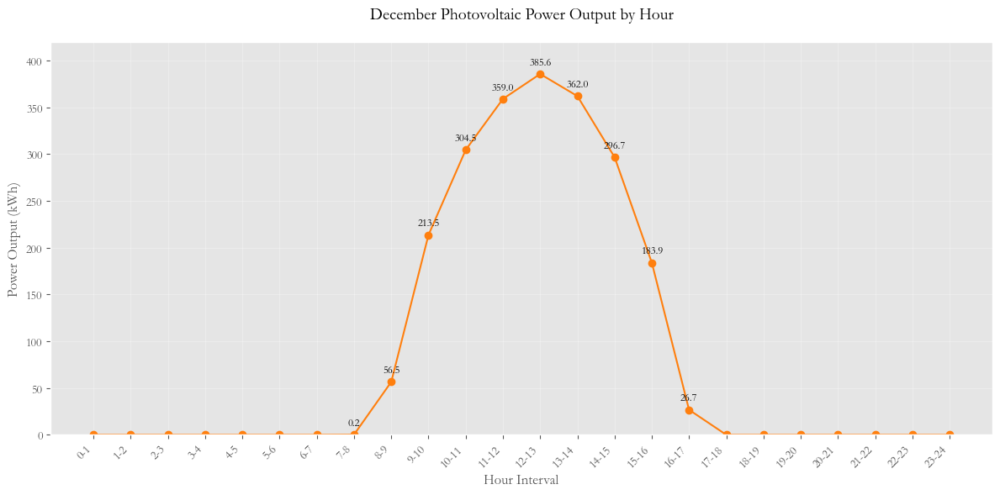

In [205]:
import matplotlib.pyplot as plt

# Hour intervals and corresponding December data
hours = [f"{i}-{i+1}" for i in range(24)]
power_output = [0.0] * 24  # Initialize all hours to 0

# Fill in the non-zero values from the data table
power_output[7] = 0.174    # 7-8
power_output[8] = 56.530   # 8-9
power_output[9] = 213.533  # 9-10
power_output[10] = 304.519 # 10-11
power_output[11] = 358.987 # 11-12
power_output[12] = 385.642 # 12-13
power_output[13] = 362.026 # 13-14
power_output[14] = 296.686 # 14-15
power_output[15] = 183.913 # 15-16
power_output[16] = 26.699  # 16-17

# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(hours, power_output, marker='o', linestyle='-', color='tab:orange')

# Formatting
plt.title('December Photovoltaic Power Output by Hour', fontsize=14, pad=20)
plt.xlabel('Hour Interval', fontsize=12)
plt.ylabel('Power Output (kWh)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(True, alpha=0.3)
plt.ylim(0, 420)  # Set y-axis limit to accommodate peak value

# Add data labels for non-zero values
for i, val in enumerate(power_output):
    if val > 0:
        plt.text(i, val+10, f'{val:.1f}', ha='center', fontsize=9)

plt.tight_layout()
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_23264\4172658733.py:56: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
C:\Users\user\AppData\Local\Temp\ipykernel_23264\4172658733.py:91: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000


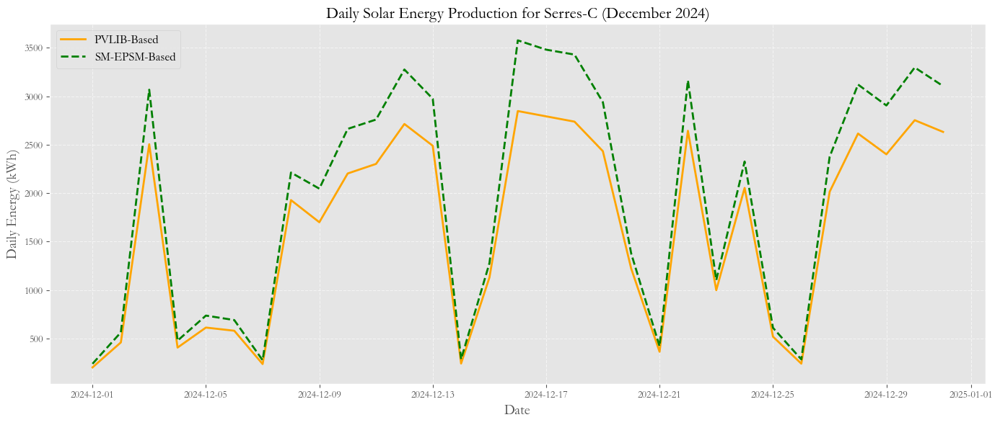

In [204]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pvlib

# Load and prepare data
file_path = "csv_40.886273_23.912687_fixed_23_180_PT5M.csv"
df = pd.read_csv(file_path)
df['period_end'] = pd.to_datetime(df['period_end'])
df.set_index('period_end', inplace=True)

# Filter for December 2024
df = df[(df.index.month == 12) & (df.index.year == 2024)]

# Ensure required columns
required_columns = ['dni', 'ghi', 'dhi', 'air_temp', 'albedo', 'zenith', 'azimuth',
                    'cloud_opacity', 'relative_humidity', 'wind_speed_10m']
for col in required_columns:
    if col not in df.columns:
        print(f"Warning: Column '{col}' is missing. Filling with zeros.")
        df[col] = 0

# --- Common System Parameters ---
tilt = 25
azimuth = 180
panel_power_max = 390  # W
system_capacity_kw = 1010.88
system_capacity_w = system_capacity_kw * 1000
num_panels = int(system_capacity_w / panel_power_max)
inverter_efficiency_pvlib = 0.99
inverter_efficiency_epsm = 0.98
temp_coeff_pvlib = -0.004
temp_coeff_epsm = -0.005
stc_irradiance = 1000  # W/m²

# ------------------------------------------------------------
# METHOD 1: PVLIB-based calculation
# ------------------------------------------------------------
solar_position = pvlib.solarposition.get_solarposition(df.index, 40.886273, 23.912687)
poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth,
    dni=df['dni'],
    ghi=df['ghi'],
    dhi=df['dhi'],
    solar_zenith=solar_position['apparent_zenith'],
    solar_azimuth=solar_position['azimuth']
)
poa_irradiance = poa['poa_global']

temp_cell = pvlib.temperature.sapm_cell(
    poa_irradiance, df['air_temp'], df['wind_speed_10m'], -3.47, -0.0594, 3
)
dc_power_pvlib = poa_irradiance * num_panels * 0.25 * (1 + temp_coeff_pvlib * (temp_cell - 25))
ac_power_pvlib = dc_power_pvlib * inverter_efficiency_pvlib
df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
daily_energy_pvlib = df['pvlib_energy_kWh'].resample('D').sum()

# ------------------------------------------------------------
# METHOD 2: SM-EPSM-based calculation (first-principles)
# ------------------------------------------------------------
tilt_rad = np.radians(tilt)
azimuth_panel_rad = np.radians(azimuth)
df['azimuth'] = df['azimuth'] % 360
zenith_rad = np.radians(df['zenith'])
azimuth_rad = np.radians(df['azimuth'])

aoi = np.degrees(np.arccos(
    np.cos(zenith_rad) * np.cos(tilt_rad) +
    np.sin(zenith_rad) * np.sin(tilt_rad) * np.cos(azimuth_rad - azimuth_panel_rad)
))
aoi = np.clip(aoi, 0, 180)

df['poa_direct'] = df['dni'] * np.cos(np.radians(aoi)) * (1 - df['cloud_opacity'] / 100)
df['poa_direct'] = df['poa_direct'].clip(lower=0)
df['poa_diffuse'] = df['dhi'] * (1 + np.cos(tilt_rad)) / 2
df['poa_sky_diffuse'] = df['ghi'] * df['albedo'] * (1 - np.cos(tilt_rad)) / 2
df['poa_total'] = df['poa_direct'] + df['poa_diffuse'] + df['poa_sky_diffuse']

nominal_operating_cell_temp = 45
df['module_temp'] = nominal_operating_cell_temp + df['poa_total'] / 800 * (28 - df['air_temp'])

df['dc_power'] = panel_power_max * (1 + temp_coeff_epsm * (df['module_temp'] - nominal_operating_cell_temp))
df['dc_power'] *= df['poa_total'] / stc_irradiance
df['dc_power'] *= (1 - 0.002 * df['relative_humidity'])

df['ac_power'] = df['dc_power'] * inverter_efficiency_epsm
df['scaled_power'] = df['ac_power'] * num_panels
df['actual_power'] = df['scaled_power'] * (1 - 0.01) * (1 - 0.01)

df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000
daily_energy_epsm = df['epsm_energy_kWh'].resample('D').sum()

# ------------------------------------------------------------
# Plot Both Results Together
# ------------------------------------------------------------
plt.rcParams["font.family"] = "Garamond"
plt.figure(figsize=(14, 6))

plt.plot(daily_energy_pvlib.index, daily_energy_pvlib, label="PVLIB-Based", linestyle='-', linewidth=2, color='orange')
plt.plot(daily_energy_epsm.index, daily_energy_epsm, label="SM-EPSM-Based", linestyle='--', linewidth=2, color='green')

plt.xlabel("Date", fontsize=14)
plt.ylabel("Daily Energy (kWh)", fontsize=14)
plt.title("Daily Solar Energy Production for Serres-C (December 2024)", fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("SERRES_C_December_PVLIB_vs_EPSM.pdf", format='pdf')
plt.show()


C:\Users\user\AppData\Local\Temp\ipykernel_23264\3991272247.py:56: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
C:\Users\user\AppData\Local\Temp\ipykernel_23264\3991272247.py:91: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000


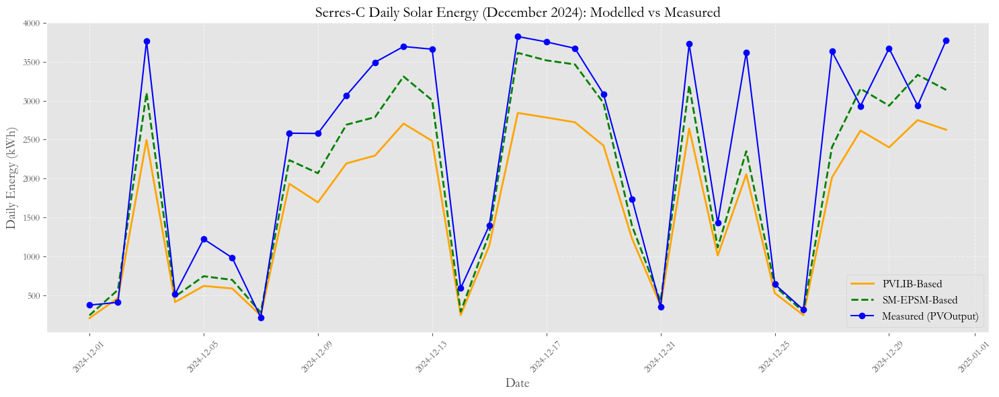

In [203]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pvlib

# Load and prepare satellite-based weather data
file_path = "csv_40.886273_23.912687_fixed_23_180_PT5M.csv"
df = pd.read_csv(file_path)
df['period_end'] = pd.to_datetime(df['period_end'])
df.set_index('period_end', inplace=True)

# Filter for December 2024
df = df[(df.index.month == 12) & (df.index.year == 2024)]

# Ensure required columns
required_columns = ['dni', 'ghi', 'dhi', 'air_temp', 'albedo', 'zenith', 'azimuth',
                    'cloud_opacity', 'relative_humidity', 'wind_speed_10m']
for col in required_columns:
    if col not in df.columns:
        print(f"Warning: Column '{col}' is missing. Filling with zeros.")
        df[col] = 0

# --- Common System Parameters ---
tilt = 25
azimuth = 180
panel_power_max = 390  # W
system_capacity_kw = 1010.88
system_capacity_w = system_capacity_kw * 1000
num_panels = int(system_capacity_w / panel_power_max)
inverter_efficiency_pvlib = 0.99
inverter_efficiency_epsm = 0.99
temp_coeff_pvlib = -0.005
temp_coeff_epsm = -0.005
stc_irradiance = 1000  # W/m²

# ------------------------------------------------------------
# METHOD 1: PVLIB-based calculation
# ------------------------------------------------------------
solar_position = pvlib.solarposition.get_solarposition(df.index, 40.886273, 23.912687)
poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth,
    dni=df['dni'],
    ghi=df['ghi'],
    dhi=df['dhi'],
    solar_zenith=solar_position['apparent_zenith'],
    solar_azimuth=solar_position['azimuth']
)
poa_irradiance = poa['poa_global']

temp_cell = pvlib.temperature.sapm_cell(
    poa_irradiance, df['air_temp'], df['wind_speed_10m'], -3.47, -0.0594, 3
)
dc_power_pvlib = poa_irradiance * num_panels * 0.25 * (1 + temp_coeff_pvlib * (temp_cell - 25))
ac_power_pvlib = dc_power_pvlib * inverter_efficiency_pvlib
df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
daily_energy_pvlib = df['pvlib_energy_kWh'].resample('D').sum()

# ------------------------------------------------------------
# METHOD 2: SM-EPSM-based calculation (first-principles)
# ------------------------------------------------------------
tilt_rad = np.radians(tilt)
azimuth_panel_rad = np.radians(azimuth)
df['azimuth'] = df['azimuth'] % 360
zenith_rad = np.radians(df['zenith'])
azimuth_rad = np.radians(df['azimuth'])

aoi = np.degrees(np.arccos(
    np.cos(zenith_rad) * np.cos(tilt_rad) +
    np.sin(zenith_rad) * np.sin(tilt_rad) * np.cos(azimuth_rad - azimuth_panel_rad)
))
aoi = np.clip(aoi, 0, 180)

df['poa_direct'] = df['dni'] * np.cos(np.radians(aoi)) * (1 - df['cloud_opacity'] / 100)
df['poa_direct'] = df['poa_direct'].clip(lower=0)
df['poa_diffuse'] = df['dhi'] * (1 + np.cos(tilt_rad)) / 2
df['poa_sky_diffuse'] = df['ghi'] * df['albedo'] * (1 - np.cos(tilt_rad)) / 2
df['poa_total'] = df['poa_direct'] + df['poa_diffuse'] + df['poa_sky_diffuse']

nominal_operating_cell_temp = 45
df['module_temp'] = nominal_operating_cell_temp + df['poa_total'] / 800 * (28 - df['air_temp'])

df['dc_power'] = panel_power_max * (1 + temp_coeff_epsm * (df['module_temp'] - nominal_operating_cell_temp))
df['dc_power'] *= df['poa_total'] / stc_irradiance
df['dc_power'] *= (1 - 0.002 * df['relative_humidity'])

df['ac_power'] = df['dc_power'] * inverter_efficiency_epsm
df['scaled_power'] = df['ac_power'] * num_panels
df['actual_power'] = df['scaled_power'] * (1 - 0.01) * (1 - 0.01)

df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000
daily_energy_epsm = df['epsm_energy_kWh'].resample('D').sum()

# ------------------------------------------------------------
# Load PVOutput Actual Data
# ------------------------------------------------------------
manual_data = {
    'Date': pd.date_range(start="2024-12-01", end="2024-12-31").strftime('%Y-%m-%d').tolist(),
    'Generated_kWh': [
        373.558, 409.092, 3766.367, 516.594, 1222.533, 981.751, 215.531, 2582.188,
        2578.355, 3067.820, 3493.070, 3695.074, 3660.718, 590.701, 1395.720, 3823.657,
        3754.435, 3671.951, 3086.333, 1737.742, 352.276, 3726.979, 1429.777, 3621.063,
        641.292, 313.622, 3631.622, 2931.336, 3671.368, 2936.603, 3776.459
    ]
}
pvoutput_df = pd.DataFrame(manual_data)
pvoutput_df['Date'] = pd.to_datetime(pvoutput_df['Date'])
pvoutput_df.set_index('Date', inplace=True)

# ------------------------------------------------------------
# Combined Plot: PVLIB, EPSM, PVOutput
# ------------------------------------------------------------
plt.rcParams["font.family"] = "Garamond"
plt.figure(figsize=(15, 6))

plt.plot(daily_energy_pvlib.index, daily_energy_pvlib, label="PVLIB-Based", linestyle='-', linewidth=2, color='orange')
plt.plot(daily_energy_epsm.index, daily_energy_epsm, label="SM-EPSM-Based", linestyle='--', linewidth=2, color='green')
plt.plot(pvoutput_df.index, pvoutput_df['Generated_kWh'], label="Measured (PVOutput)", linestyle='-', marker='o', color='blue')

plt.xlabel("Date", fontsize=14)
plt.ylabel("Daily Energy (kWh)", fontsize=14)
plt.title("Serres-C Daily Solar Energy (December 2024): Modelled vs Measured", fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("SERRES_C_Comparison_PVLIB_EPSM_PVOutput.pdf", format='pdf')
plt.show()


C:\Users\user\AppData\Local\Temp\ipykernel_23264\2803792692.py:56: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
C:\Users\user\AppData\Local\Temp\ipykernel_23264\2803792692.py:89: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000


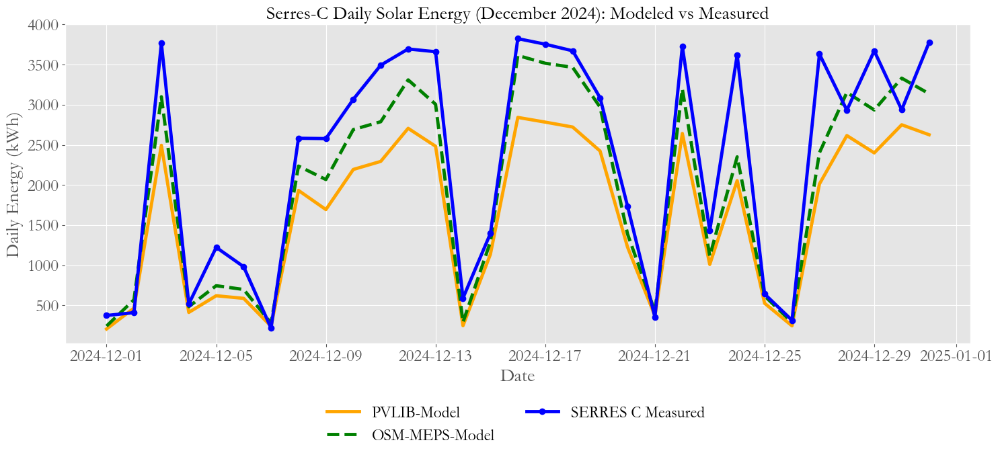

In [216]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pvlib

# Load and prepare satellite-based weather data
file_path = "csv_40.886273_23.912687_fixed_23_180_PT5M.csv"
df = pd.read_csv(file_path)
df['period_end'] = pd.to_datetime(df['period_end'])
df.set_index('period_end', inplace=True)

# Filter for December 2024
df = df[(df.index.month == 12) & (df.index.year == 2024)]

# Ensure required columns are present
required_columns = ['dni', 'ghi', 'dhi', 'air_temp', 'albedo', 'zenith', 'azimuth',
                    'cloud_opacity', 'relative_humidity', 'wind_speed_10m']
for col in required_columns:
    if col not in df.columns:
        print(f"Warning: Column '{col}' is missing. Filling with zeros.")
        df[col] = 0

# System configuration
tilt = 25
azimuth = 180
panel_power_max = 390  # W
system_capacity_kw = 1010.88
system_capacity_w = system_capacity_kw * 1000
num_panels = int(system_capacity_w / panel_power_max)
inverter_efficiency_pvlib = 0.99
inverter_efficiency_epsm = 0.99
temp_coeff_pvlib = -0.005
temp_coeff_epsm = -0.005
stc_irradiance = 1000  # W/m²

# PVLIB Method
solar_position = pvlib.solarposition.get_solarposition(df.index, 40.886273, 23.912687)
poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth,
    dni=df['dni'],
    ghi=df['ghi'],
    dhi=df['dhi'],
    solar_zenith=solar_position['apparent_zenith'],
    solar_azimuth=solar_position['azimuth']
)
poa_irradiance = poa['poa_global']

# Use SAPM temperature model correctly (no keyword args)
temp_cell = pvlib.temperature.sapm_cell(
    poa_irradiance, df['air_temp'], df['wind_speed_10m'], -3.47, -0.0594, 3
)

dc_power_pvlib = poa_irradiance * num_panels * 0.25 * (1 + temp_coeff_pvlib * (temp_cell - 25))
ac_power_pvlib = dc_power_pvlib * inverter_efficiency_pvlib
df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
daily_energy_pvlib = df['pvlib_energy_kWh'].resample('D').sum()

# SM-EPSM Method
tilt_rad = np.radians(tilt)
azimuth_panel_rad = np.radians(azimuth)
df['azimuth'] = df['azimuth'] % 360
zenith_rad = np.radians(df['zenith'])
azimuth_rad = np.radians(df['azimuth'])

aoi = np.degrees(np.arccos(
    np.cos(zenith_rad) * np.cos(tilt_rad) +
    np.sin(zenith_rad) * np.sin(tilt_rad) * np.cos(azimuth_rad - azimuth_panel_rad)
))
aoi = np.clip(aoi, 0, 180)

df['poa_direct'] = df['dni'] * np.cos(np.radians(aoi)) * (1 - df['cloud_opacity'] / 100)
df['poa_direct'] = df['poa_direct'].clip(lower=0)
df['poa_diffuse'] = df['dhi'] * (1 + np.cos(tilt_rad)) / 2
df['poa_sky_diffuse'] = df['ghi'] * df['albedo'] * (1 - np.cos(tilt_rad)) / 2
df['poa_total'] = df['poa_direct'] + df['poa_diffuse'] + df['poa_sky_diffuse']

nominal_operating_cell_temp = 45
df['module_temp'] = nominal_operating_cell_temp + df['poa_total'] / 800 * (28 - df['air_temp'])

df['dc_power'] = panel_power_max * (1 + temp_coeff_epsm * (df['module_temp'] - nominal_operating_cell_temp))
df['dc_power'] *= df['poa_total'] / stc_irradiance
df['dc_power'] *= (1 - 0.002 * df['relative_humidity'])

df['ac_power'] = df['dc_power'] * inverter_efficiency_epsm
df['scaled_power'] = df['ac_power'] * num_panels
df['actual_power'] = df['scaled_power'] * (1 - 0.01) * (1 - 0.01)

df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000
daily_energy_epsm = df['epsm_energy_kWh'].resample('D').sum()

# PVOutput actual data
manual_data = {
    'Date': pd.date_range(start="2024-12-01", end="2024-12-31").strftime('%Y-%m-%d').tolist(),
    'Generated_kWh': [
        373.558, 409.092, 3766.367, 516.594, 1222.533, 981.751, 215.531, 2582.188,
        2578.355, 3067.820, 3493.070, 3695.074, 3660.718, 590.701, 1395.720, 3823.657,
        3754.435, 3671.951, 3086.333, 1737.742, 352.276, 3726.979, 1429.777, 3621.063,
        641.292, 313.622, 3631.622, 2931.336, 3671.368, 2936.603, 3776.459
    ]
}
pvoutput_df = pd.DataFrame(manual_data)
pvoutput_df['Date'] = pd.to_datetime(pvoutput_df['Date'])
pvoutput_df.set_index('Date', inplace=True)

# Final Plot
plt.rcParams["font.family"] = "Garamond"
plt.figure(figsize=(15, 7))

# Increase line width for all plots
line_width = 3.5

# Plot data
plt.plot(daily_energy_pvlib.index, daily_energy_pvlib, label="PVLIB-Model", linestyle='-', linewidth=line_width, color='orange')
plt.plot(daily_energy_epsm.index, daily_energy_epsm, label="OSM-MEPS-Model", linestyle='--', linewidth=line_width, color='green')
plt.plot(pvoutput_df.index, pvoutput_df['Generated_kWh'], label="SERRES C Measured ", linestyle='-', marker='o', linewidth=line_width, markersize=6, color='blue')

# Labels and title with increased font size
plt.xlabel("Date", fontsize=20)
plt.ylabel("Daily Energy (kWh)", fontsize=20)
plt.title("Serres-C Daily Solar Energy (December 2024): Modeled vs Measured", fontsize=20)

plt.legend(
    fontsize=17,
    loc='upper center',
    bbox_to_anchor=(0.5, -0.15),  # (x, y) position below the plot
    ncol=2,                       # number of legend columns (adjust as needed)
    frameon=False                 # optional: removes the box around the legend
)


# Ticks
plt.xticks(rotation=0, fontsize=18)
plt.yticks(fontsize=18)

# Layout and save
plt.tight_layout()
plt.savefig("SERRES_C_Comparison_PVLIB_OSM-MEPS_PVOutput_1.pdf", format='pdf')
plt.show()



In [159]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Convert both series to the same timezone (e.g., UTC) or remove timezone information
daily_energy_pvlib.index = daily_energy_pvlib.index.tz_localize(None)  # Remove timezone info if any
daily_energy_epsm.index = daily_energy_epsm.index.tz_localize(None)  # Remove timezone info if any
pvoutput_df.index = pvoutput_df.index.tz_localize(None)  # Ensure PVOutput dataframe has no timezone info

# Ensure both series have the same index (in case of mismatched timestamps)
daily_energy_pvlib_aligned = daily_energy_pvlib.reindex(pvoutput_df.index, method='nearest')
daily_energy_epsm_aligned = daily_energy_epsm.reindex(pvoutput_df.index, method='nearest')

# Error metrics function
def compute_error_metrics(actual, predicted):
    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, predicted)
    r2 = r2_score(actual, predicted)
    return mse, rmse, mae, r2

# PVLIB vs PVOutput
mse_pvlib, rmse_pvlib, mae_pvlib, r2_pvlib = compute_error_metrics(pvoutput_df['Generated_kWh'], daily_energy_pvlib_aligned)
# SM-EPSM vs PVOutput
mse_epsm, rmse_epsm, mae_epsm, r2_epsm = compute_error_metrics(pvoutput_df['Generated_kWh'], daily_energy_epsm_aligned)

# Print the results
print(f"PVLIB vs PVOutput_SERRES-C Metrics: MSE = {mse_pvlib:.3f}, RMSE = {rmse_pvlib:.3f}, MAE = {mae_pvlib:.3f}, R² = {r2_pvlib:.3f}")
print(f"OSM-MEPS vs PVOutput_SERRES-C Metrics: MSE = {mse_epsm:.3f}, RMSE = {rmse_epsm:.3f}, MAE = {mae_epsm:.3f}, R² = {r2_epsm:.3f}")


PVLIB vs PVOutput_SERRES-C Metrics: MSE = 682931.700, RMSE = 826.397, MAE = 674.005, R² = 0.638
OSM-MEPS vs PVOutput_SERRES-C Metrics: MSE = 240267.454, RMSE = 490.171, MAE = 380.018, R² = 0.873


C:\Users\user\AppData\Local\Temp\ipykernel_23264\3099669395.py:56: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
C:\Users\user\AppData\Local\Temp\ipykernel_23264\3099669395.py:89: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000


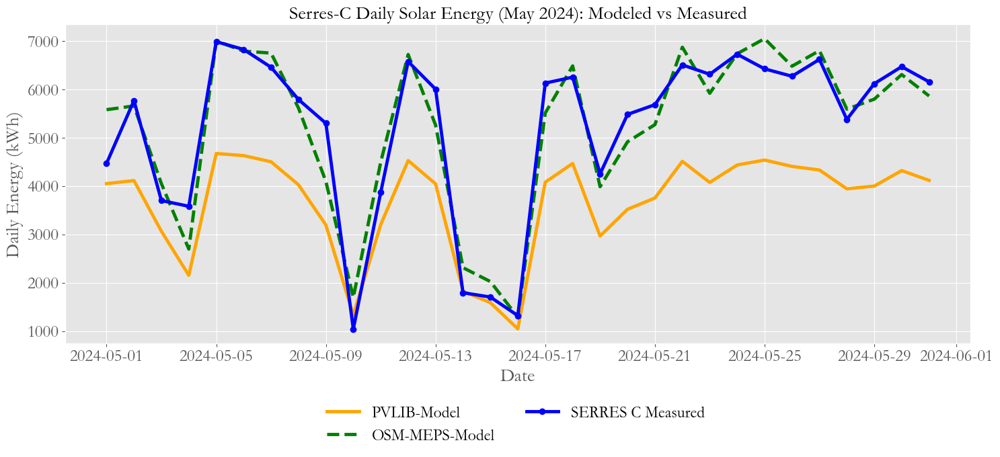

In [214]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pvlib

# Load and prepare satellite-based weather data
file_path = "csv_40.886273_23.912687_fixed_23_180_PT5M.csv"
df = pd.read_csv(file_path)
df['period_end'] = pd.to_datetime(df['period_end'])
df.set_index('period_end', inplace=True)

# Filter for December 2024
df = df[(df.index.month == 5) & (df.index.year == 2024)]

# Ensure required columns are present
required_columns = ['dni', 'ghi', 'dhi', 'air_temp', 'albedo', 'zenith', 'azimuth',
                    'cloud_opacity', 'relative_humidity', 'wind_speed_10m']
for col in required_columns:
    if col not in df.columns:
        print(f"Warning: Column '{col}' is missing. Filling with zeros.")
        df[col] = 0

# System configuration
tilt = 25
azimuth = 180
panel_power_max = 390  # W
system_capacity_kw = 1010.88
system_capacity_w = system_capacity_kw * 1000
num_panels = int(system_capacity_w / panel_power_max)
inverter_efficiency_pvlib = 0.99
inverter_efficiency_epsm = 0.99
temp_coeff_pvlib = -0.005
temp_coeff_epsm = -0.005
stc_irradiance = 1000  # W/m²

# PVLIB Method
solar_position = pvlib.solarposition.get_solarposition(df.index, 40.886273, 23.912687)
poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth,
    dni=df['dni'],
    ghi=df['ghi'],
    dhi=df['dhi'],
    solar_zenith=solar_position['apparent_zenith'],
    solar_azimuth=solar_position['azimuth']
)
poa_irradiance = poa['poa_global']

# Use SAPM temperature model correctly (no keyword args)
temp_cell = pvlib.temperature.sapm_cell(
    poa_irradiance, df['air_temp'], df['wind_speed_10m'], -3.47, -0.0594, 3
)

dc_power_pvlib = poa_irradiance * num_panels * 0.25 * (1 + temp_coeff_pvlib * (temp_cell - 25))
ac_power_pvlib = dc_power_pvlib * inverter_efficiency_pvlib
df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
daily_energy_pvlib = df['pvlib_energy_kWh'].resample('D').sum()

# SM-EPSM Method
tilt_rad = np.radians(tilt)
azimuth_panel_rad = np.radians(azimuth)
df['azimuth'] = df['azimuth'] % 360
zenith_rad = np.radians(df['zenith'])
azimuth_rad = np.radians(df['azimuth'])

aoi = np.degrees(np.arccos(
    np.cos(zenith_rad) * np.cos(tilt_rad) +
    np.sin(zenith_rad) * np.sin(tilt_rad) * np.cos(azimuth_rad - azimuth_panel_rad)
))
aoi = np.clip(aoi, 0, 180)

df['poa_direct'] = df['dni'] * np.cos(np.radians(aoi)) * (1 - df['cloud_opacity'] / 100)
df['poa_direct'] = df['poa_direct'].clip(lower=0)
df['poa_diffuse'] = df['dhi'] * (1 + np.cos(tilt_rad)) / 2
df['poa_sky_diffuse'] = df['ghi'] * df['albedo'] * (1 - np.cos(tilt_rad)) / 2
df['poa_total'] = df['poa_direct'] + df['poa_diffuse'] + df['poa_sky_diffuse']

nominal_operating_cell_temp = 45
df['module_temp'] = nominal_operating_cell_temp + df['poa_total'] / 800 * (28 - df['air_temp'])

df['dc_power'] = panel_power_max * (1 + temp_coeff_epsm * (df['module_temp'] - nominal_operating_cell_temp))
df['dc_power'] *= df['poa_total'] / stc_irradiance
df['dc_power'] *= (1 - 0.002 * df['relative_humidity'])

df['ac_power'] = df['dc_power'] * inverter_efficiency_epsm
df['scaled_power'] = df['ac_power'] * num_panels
df['actual_power'] = df['scaled_power'] * (1 - 0.01) * (1 - 0.01)

df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000
daily_energy_epsm = df['epsm_energy_kWh'].resample('D').sum()

# PVOutput actual data
manual_data = {
    "Date": pd.date_range(start="2024-05-01", end="2024-05-31", freq='D').strftime('%Y-%m-%d'),
    "Generated_kWh": [
        4471.536, 5772.225, 3702.504, 3584.121, 6990.819, 6829.450, 6460.444,
        5794.024, 5301.733, 1044.504, 3872.221, 6579.276, 6007.701, 1795.759, 1705.524,
        1321.289, 6132.768, 6256.532, 4255.149, 5485.074, 5686.328, 6509.426, 6316.062,
        6730.487, 6427.825, 6274.672, 6623.742, 5381.349, 6120.793, 6473.117, 6159.159
    ]
}
pvoutput_df = pd.DataFrame(manual_data)
pvoutput_df['Date'] = pd.to_datetime(pvoutput_df['Date'])
pvoutput_df.set_index('Date', inplace=True)

# Final Plot
plt.rcParams["font.family"] = "Garamond"
plt.figure(figsize=(15, 7))

# Increase line width for all plots
line_width = 3.5

# Plot data
plt.plot(daily_energy_pvlib.index, daily_energy_pvlib, label="PVLIB-Model", linestyle='-', linewidth=line_width, color='orange')
plt.plot(daily_energy_epsm.index, daily_energy_epsm, label="OSM-MEPS-Model", linestyle='--', linewidth=line_width, color='green')
plt.plot(pvoutput_df.index, pvoutput_df['Generated_kWh'], label="SERRES C Measured ", linestyle='-', marker='o', linewidth=line_width, markersize=6, color='blue')

# Labels and title with increased font size
plt.xlabel("Date", fontsize=20)
plt.ylabel("Daily Energy (kWh)", fontsize=20)
plt.title("Serres-C Daily Solar Energy (May 2024): Modeled vs Measured", fontsize=20)

plt.legend(
    fontsize=17,
    loc='upper center',
    bbox_to_anchor=(0.5, -0.15),  # (x, y) position below the plot
    ncol=2,                       # number of legend columns (adjust as needed)
    frameon=False                 # optional: removes the box around the legend
)


# Ticks
plt.xticks(rotation=0, fontsize=18)
plt.yticks(fontsize=18)

# Layout and save
plt.tight_layout()
plt.savefig("SERRES_C_Comparison_PVLIB_OSM-MEPS_PVOutput_2.pdf", format='pdf')
plt.show()


In [162]:
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Remove timezone info (if any)
daily_energy_pvlib.index = daily_energy_pvlib.index.tz_localize(None)
daily_energy_epsm.index = daily_energy_epsm.index.tz_localize(None)
pvoutput_df.index = pvoutput_df.index.tz_localize(None)

# Align the indices using 'nearest' to match measured timestamps
daily_energy_pvlib_aligned = daily_energy_pvlib.reindex(pvoutput_df.index, method='nearest')
daily_energy_epsm_aligned = daily_energy_epsm.reindex(pvoutput_df.index, method='nearest')

# Error metrics function
def compute_error_metrics(actual, predicted):
    mae = mean_absolute_error(actual, predicted)
    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    r2 = r2_score(actual, predicted)
    return mae, mse, rmse, r2

# Compute metrics for PVLIB
mae_pvlib, mse_pvlib, rmse_pvlib, r2_pvlib = compute_error_metrics(
    pvoutput_df['Generated_kWh'], daily_energy_pvlib_aligned
)

# Compute metrics for EPSM
mae_epsm, mse_epsm, rmse_epsm, r2_epsm = compute_error_metrics(
    pvoutput_df['Generated_kWh'], daily_energy_epsm_aligned
)

# Print results
print(f"\nPVLIB Model vs PVOutput_SERRES-C:")
print(f"MAE  = {mae_pvlib:.2f} kWh")
print(f"MSE  = {mse_pvlib:.2f} kWh²")
print(f"RMSE = {rmse_pvlib:.2f} kWh")
print(f"R²   = {r2_pvlib:.4f}")

print(f"\nOSM-MEPS Model vs PVOutput_SERRES-C:")
print(f"MAE  = {mae_epsm:.2f} kWh")
print(f"MSE  = {mse_epsm:.2f} kWh²")
print(f"RMSE = {rmse_epsm:.2f} kWh")
print(f"R²   = {r2_epsm:.4f}")



PVLIB Model vs PVOutput_SERRES-C:
MAE  = 1586.84 kWh
MSE  = 3034545.39 kWh²
RMSE = 1741.99 kWh
R²   = -0.0390

OSM-MEPS Model vs PVOutput_SERRES-C:
MAE  = 390.07 kWh
MSE  = 242066.63 kWh²
RMSE = 492.00 kWh
R²   = 0.9171


C:\Users\user\AppData\Local\Temp\ipykernel_23264\555129522.py:54: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
C:\Users\user\AppData\Local\Temp\ipykernel_23264\555129522.py:87: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000


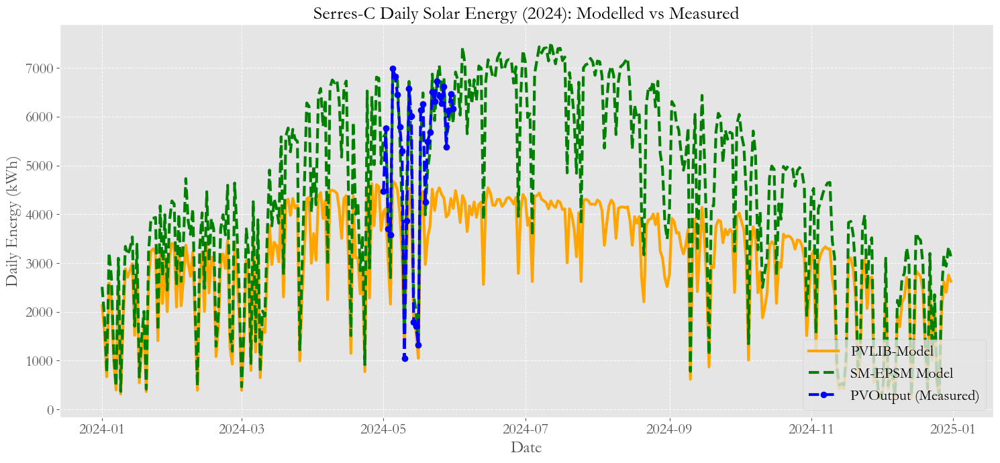

In [202]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pvlib

# === Load and prepare satellite-based weather data ===
file_path = "csv_40.886273_23.912687_fixed_23_180_PT5M.csv"
df = pd.read_csv(file_path)
df['period_end'] = pd.to_datetime(df['period_end'])
df.set_index('period_end', inplace=True)

# === Filter for the full year 2024 ===
df = df[df.index.year == 2024]

# === Ensure required columns are present ===
required_columns = ['dni', 'ghi', 'dhi', 'air_temp', 'albedo', 'zenith', 'azimuth',
                    'cloud_opacity', 'relative_humidity', 'wind_speed_10m']
for col in required_columns:
    if col not in df.columns:
        print(f"Warning: Column '{col}' is missing. Filling with zeros.")
        df[col] = 0

# === System configuration ===
tilt = 25
azimuth = 180
panel_power_max = 390  # W
system_capacity_kw = 1010.88
system_capacity_w = system_capacity_kw * 1000
num_panels = int(system_capacity_w / panel_power_max)
inverter_efficiency = 0.99
temp_coeff = -0.005
stc_irradiance = 1000  # W/m²

# === PVLIB Method ===
solar_position = pvlib.solarposition.get_solarposition(df.index, 40.886273, 23.912687)
poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth,
    dni=df['dni'],
    ghi=df['ghi'],
    dhi=df['dhi'],
    solar_zenith=solar_position['apparent_zenith'],
    solar_azimuth=solar_position['azimuth']
)
poa_irradiance = poa['poa_global']

# SAPM temperature model
temp_cell = pvlib.temperature.sapm_cell(
    poa_irradiance, df['air_temp'], df['wind_speed_10m'], -3.47, -0.0594, 3
)

dc_power_pvlib = poa_irradiance * num_panels * 0.25 * (1 + temp_coeff * (temp_cell - 25))
ac_power_pvlib = dc_power_pvlib * inverter_efficiency
df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
daily_energy_pvlib = df['pvlib_energy_kWh'].resample('D').sum()

# === SM-EPSM Method ===
tilt_rad = np.radians(tilt)
azimuth_panel_rad = np.radians(azimuth)
df['azimuth'] = df['azimuth'] % 360
zenith_rad = np.radians(df['zenith'])
azimuth_rad = np.radians(df['azimuth'])

aoi = np.degrees(np.arccos(
    np.cos(zenith_rad) * np.cos(tilt_rad) +
    np.sin(zenith_rad) * np.sin(tilt_rad) * np.cos(azimuth_rad - azimuth_panel_rad)
))
aoi = np.clip(aoi, 0, 180)

df['poa_direct'] = df['dni'] * np.cos(np.radians(aoi)) * (1 - df['cloud_opacity'] / 100)
df['poa_direct'] = df['poa_direct'].clip(lower=0)
df['poa_diffuse'] = df['dhi'] * (1 + np.cos(tilt_rad)) / 2
df['poa_sky_diffuse'] = df['ghi'] * df['albedo'] * (1 - np.cos(tilt_rad)) / 2
df['poa_total'] = df['poa_direct'] + df['poa_diffuse'] + df['poa_sky_diffuse']

nominal_operating_cell_temp = 45
df['module_temp'] = nominal_operating_cell_temp + df['poa_total'] / 800 * (28 - df['air_temp'])

df['dc_power'] = panel_power_max * (1 + temp_coeff * (df['module_temp'] - nominal_operating_cell_temp))
df['dc_power'] *= df['poa_total'] / stc_irradiance
df['dc_power'] *= (1 - 0.002 * df['relative_humidity'])

df['ac_power'] = df['dc_power'] * inverter_efficiency
df['scaled_power'] = df['ac_power'] * num_panels
df['actual_power'] = df['scaled_power'] * (1 - 0.01) * (1 - 0.01)

df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000
daily_energy_epsm = df['epsm_energy_kWh'].resample('D').sum()

# === Optional: Load PVOutput actual data if available ===
# Extend or replace below with actual 2024 data
# Example below is for May only; skip or update for full year if data is available

# Create full 2024 date range (leap year = 366 days)
date_range_2024 = pd.date_range(start="2024-01-01", end="2024-12-31", freq='D')

# Placeholder: NaN for now; replace with your actual data
generated_kWh = [np.nan] * len(date_range_2024)

pvoutput_df = pd.DataFrame({
    "Date": pd.date_range(start="2024-05-01", end="2024-05-31", freq='D'),
    "Generated_kWh": [
        4471.536, 5772.225, 3702.504, 3584.121, 6990.819, 6829.450, 6460.444,
        5794.024, 5301.733, 1044.504, 3872.221, 6579.276, 6007.701, 1795.759, 1705.524,
        1321.289, 6132.768, 6256.532, 4255.149, 5485.074, 5686.328, 6509.426, 6316.062,
        6730.487, 6427.825, 6274.672, 6623.742, 5381.349, 6120.793, 6473.117, 6159.159
    ]
})
pvoutput_df['Date'] = pd.to_datetime(pvoutput_df['Date'])
pvoutput_df.set_index('Date', inplace=True)

# === Final Plot ===
plt.rcParams["font.family"] = "Garamond"
plt.figure(figsize=(15, 7))

plt.plot(daily_energy_pvlib.index, daily_energy_pvlib, label="PVLIB-Model", linestyle='-', linewidth=3, color='orange')
plt.plot(daily_energy_epsm.index, daily_energy_epsm, label="SM-EPSM Model", linestyle='--', linewidth=3, color='green')

if not pvoutput_df.empty:
    plt.plot(pvoutput_df.index, pvoutput_df['Generated_kWh'], label="PVOutput (Measured)", linestyle='--', marker='o', linewidth=3, color='blue')

plt.xlabel("Date", fontsize=18)
plt.ylabel("Daily Energy (kWh)", fontsize=18)
plt.title("Serres-C Daily Solar Energy (2024): Modelled vs Measured", fontsize=20)
plt.legend(fontsize=16, loc='lower right')
plt.grid(True, linestyle='--', alpha=0.85)
plt.xticks(rotation=0, fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig("SERRES_C_Comparison_PVLIB_EPSM_PVOutput_Yearly.pdf", format='pdf')
plt.show()


C:\Users\user\AppData\Local\Temp\ipykernel_23264\1135036257.py:54: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
C:\Users\user\AppData\Local\Temp\ipykernel_23264\1135036257.py:87: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000


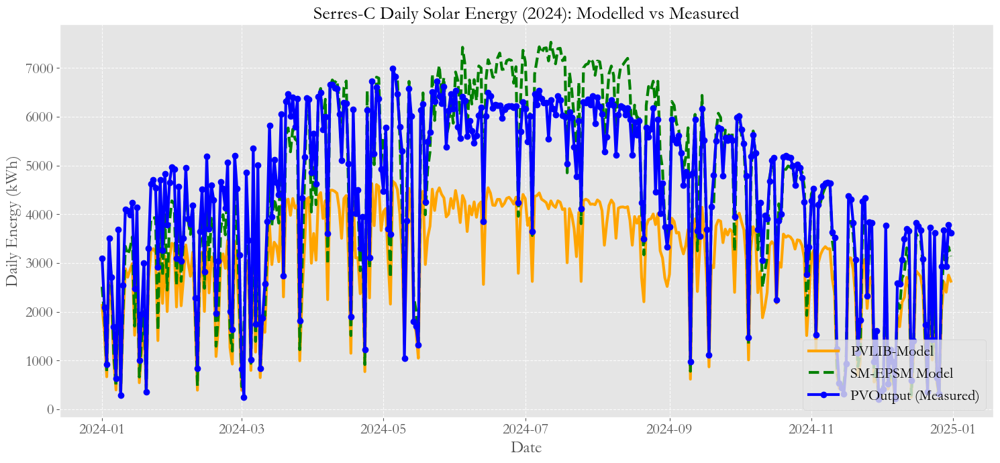

In [147]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pvlib

# === Load and prepare satellite-based weather data ===
file_path = "csv_40.886273_23.912687_fixed_23_180_PT5M.csv"
df = pd.read_csv(file_path)
df['period_end'] = pd.to_datetime(df['period_end'])
df.set_index('period_end', inplace=True)

# === Filter for the full year 2024 ===
df = df[df.index.year == 2024]

# === Ensure required columns are present ===
required_columns = ['dni', 'ghi', 'dhi', 'air_temp', 'albedo', 'zenith', 'azimuth',
                    'cloud_opacity', 'relative_humidity', 'wind_speed_10m']
for col in required_columns:
    if col not in df.columns:
        print(f"Warning: Column '{col}' is missing. Filling with zeros.")
        df[col] = 0

# === System configuration ===
tilt = 25
azimuth = 180
panel_power_max = 390  # W
system_capacity_kw = 1010.88
system_capacity_w = system_capacity_kw * 1000
num_panels = int(system_capacity_w / panel_power_max)
inverter_efficiency = 0.99
temp_coeff = -0.005
stc_irradiance = 1000  # W/m²

# === PVLIB Method ===
solar_position = pvlib.solarposition.get_solarposition(df.index, 40.886273, 23.912687)
poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth,
    dni=df['dni'],
    ghi=df['ghi'],
    dhi=df['dhi'],
    solar_zenith=solar_position['apparent_zenith'],
    solar_azimuth=solar_position['azimuth']
)
poa_irradiance = poa['poa_global']

# SAPM temperature model
temp_cell = pvlib.temperature.sapm_cell(
    poa_irradiance, df['air_temp'], df['wind_speed_10m'], -3.47, -0.0594, 3
)

dc_power_pvlib = poa_irradiance * num_panels * 0.25 * (1 + temp_coeff * (temp_cell - 25))
ac_power_pvlib = dc_power_pvlib * inverter_efficiency
df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
daily_energy_pvlib = df['pvlib_energy_kWh'].resample('D').sum()

# === SM-EPSM Method ===
tilt_rad = np.radians(tilt)
azimuth_panel_rad = np.radians(azimuth)
df['azimuth'] = df['azimuth'] % 360
zenith_rad = np.radians(df['zenith'])
azimuth_rad = np.radians(df['azimuth'])

aoi = np.degrees(np.arccos(
    np.cos(zenith_rad) * np.cos(tilt_rad) +
    np.sin(zenith_rad) * np.sin(tilt_rad) * np.cos(azimuth_rad - azimuth_panel_rad)
))
aoi = np.clip(aoi, 0, 180)

df['poa_direct'] = df['dni'] * np.cos(np.radians(aoi)) * (1 - df['cloud_opacity'] / 100)
df['poa_direct'] = df['poa_direct'].clip(lower=0)
df['poa_diffuse'] = df['dhi'] * (1 + np.cos(tilt_rad)) / 2
df['poa_sky_diffuse'] = df['ghi'] * df['albedo'] * (1 - np.cos(tilt_rad)) / 2
df['poa_total'] = df['poa_direct'] + df['poa_diffuse'] + df['poa_sky_diffuse']

nominal_operating_cell_temp = 45
df['module_temp'] = nominal_operating_cell_temp + df['poa_total'] / 800 * (28 - df['air_temp'])

df['dc_power'] = panel_power_max * (1 + temp_coeff * (df['module_temp'] - nominal_operating_cell_temp))
df['dc_power'] *= df['poa_total'] / stc_irradiance
df['dc_power'] *= (1 - 0.002 * df['relative_humidity'])

df['ac_power'] = df['dc_power'] * inverter_efficiency
df['scaled_power'] = df['ac_power'] * num_panels
df['actual_power'] = df['scaled_power'] * (1 - 0.01) * (1 - 0.01)

df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000
daily_energy_epsm = df['epsm_energy_kWh'].resample('D').sum()

# === Load PVOutput actual data ===
pvoutput_actual = pd.read_csv("serres_2024_full_dataset.csv")
pvoutput_actual['Date'] = pd.to_datetime(pvoutput_actual['Date'], dayfirst=False)
pvoutput_actual.set_index('Date', inplace=True)

# Clean and ensure proper numeric values
pvoutput_actual['Generated_kWh'] = pd.to_numeric(pvoutput_actual['Generated_kWh'], errors='coerce')
pvoutput_actual = pvoutput_actual.dropna()

# === Final Plot ===
plt.rcParams["font.family"] = "Garamond"
plt.figure(figsize=(15, 7))

plt.plot(daily_energy_pvlib.index, daily_energy_pvlib, label="PVLIB-Model", linestyle='-', linewidth=3, color='orange')
plt.plot(daily_energy_epsm.index, daily_energy_epsm, label="SM-EPSM Model", linestyle='--', linewidth=3, color='green')

if not pvoutput_actual.empty:
    measured = pvoutput_actual['Generated_kWh'].dropna()
    plt.plot(
        measured.index, 
        measured, 
        label="PVOutput (Measured)", 
        linestyle='-', 
        marker='o', 
        linewidth=3, 
        color='blue'
    )

plt.xlabel("Date", fontsize=18)
plt.ylabel("Daily Energy (kWh)", fontsize=18)
plt.title("Serres-C Daily Solar Energy (2024): Modelled vs Measured", fontsize=20)
plt.legend(fontsize=16, loc='lower right')
plt.grid(True, linestyle='--', alpha=0.85)
plt.xticks(rotation=0, fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig("SERRES_C_Comparison_PVLIB_EPSM_PVOutput_Yearly.pdf", format='pdf')
plt.show()


C:\Users\user\AppData\Local\Temp\ipykernel_23264\541852530.py:54: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
C:\Users\user\AppData\Local\Temp\ipykernel_23264\541852530.py:87: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000


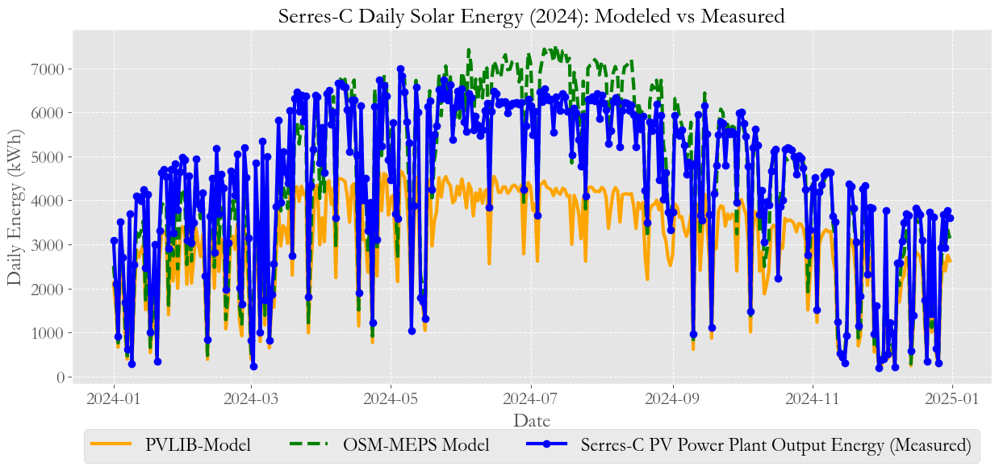

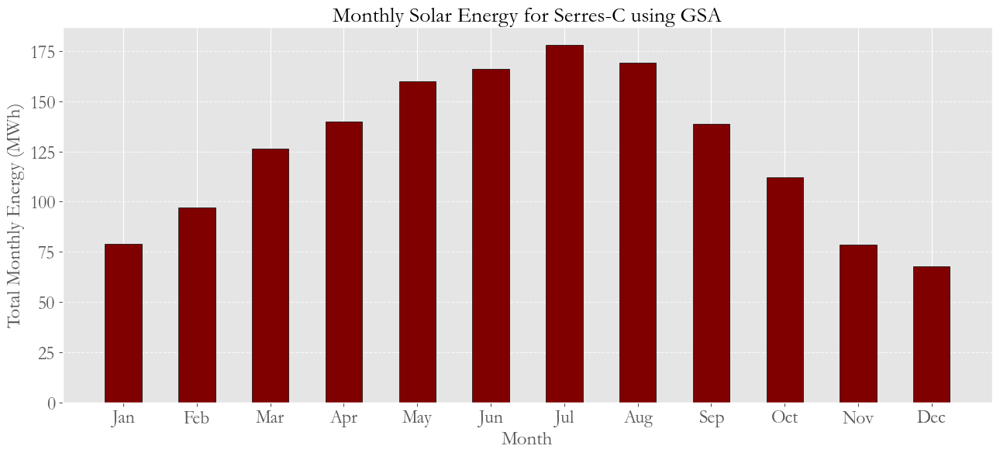

In [218]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pvlib

# === Load and prepare satellite-based weather data ===
file_path = "csv_40.886273_23.912687_fixed_23_180_PT5M.csv"
df = pd.read_csv(file_path)
df['period_end'] = pd.to_datetime(df['period_end'])
df.set_index('period_end', inplace=True)

# === Filter for the full year 2024 ===
df = df[df.index.year == 2024]

# === Ensure required columns are present ===
required_columns = ['dni', 'ghi', 'dhi', 'air_temp', 'albedo', 'zenith', 'azimuth',
                    'cloud_opacity', 'relative_humidity', 'wind_speed_10m']
for col in required_columns:
    if col not in df.columns:
        print(f"Warning: Column '{col}' is missing. Filling with zeros.")
        df[col] = 0

# === System configuration ===
tilt = 25
azimuth = 180
panel_power_max = 390  # W
system_capacity_kw = 1010.88
system_capacity_w = system_capacity_kw * 1000
num_panels = int(system_capacity_w / panel_power_max)
inverter_efficiency = 0.99
temp_coeff = -0.005
stc_irradiance = 1000  # W/m²

# === PVLIB Method ===
solar_position = pvlib.solarposition.get_solarposition(df.index, 40.886273, 23.912687)
poa = pvlib.irradiance.get_total_irradiance(
    surface_tilt=tilt,
    surface_azimuth=azimuth,
    dni=df['dni'],
    ghi=df['ghi'],
    dhi=df['dhi'],
    solar_zenith=solar_position['apparent_zenith'],
    solar_azimuth=solar_position['azimuth']
)
poa_irradiance = poa['poa_global']

# SAPM temperature model
temp_cell = pvlib.temperature.sapm_cell(
    poa_irradiance, df['air_temp'], df['wind_speed_10m'], -3.47, -0.0594, 3
)

dc_power_pvlib = poa_irradiance * num_panels * 0.25 * (1 + temp_coeff * (temp_cell - 25))
ac_power_pvlib = dc_power_pvlib * inverter_efficiency
df['pvlib_energy_kWh'] = (ac_power_pvlib / 1000).resample('H').mean()
daily_energy_pvlib = df['pvlib_energy_kWh'].resample('D').sum()

# === SM-EPSM Method ===
tilt_rad = np.radians(tilt)
azimuth_panel_rad = np.radians(azimuth)
df['azimuth'] = df['azimuth'] % 360
zenith_rad = np.radians(df['zenith'])
azimuth_rad = np.radians(df['azimuth'])

aoi = np.degrees(np.arccos(
    np.cos(zenith_rad) * np.cos(tilt_rad) +
    np.sin(zenith_rad) * np.sin(tilt_rad) * np.cos(azimuth_rad - azimuth_panel_rad)
))
aoi = np.clip(aoi, 0, 180)

df['poa_direct'] = df['dni'] * np.cos(np.radians(aoi)) * (1 - df['cloud_opacity'] / 100)
df['poa_direct'] = df['poa_direct'].clip(lower=0)
df['poa_diffuse'] = df['dhi'] * (1 + np.cos(tilt_rad)) / 2
df['poa_sky_diffuse'] = df['ghi'] * df['albedo'] * (1 - np.cos(tilt_rad)) / 2
df['poa_total'] = df['poa_direct'] + df['poa_diffuse'] + df['poa_sky_diffuse']

nominal_operating_cell_temp = 45
df['module_temp'] = nominal_operating_cell_temp + df['poa_total'] / 800 * (28 - df['air_temp'])

df['dc_power'] = panel_power_max * (1 + temp_coeff * (df['module_temp'] - nominal_operating_cell_temp))
df['dc_power'] *= df['poa_total'] / stc_irradiance
df['dc_power'] *= (1 - 0.002 * df['relative_humidity'])

df['ac_power'] = df['dc_power'] * inverter_efficiency
df['scaled_power'] = df['ac_power'] * num_panels
df['actual_power'] = df['scaled_power'] * (1 - 0.01) * (1 - 0.01)

df['epsm_energy_kWh'] = df['actual_power'].resample('H').mean() / 1000
daily_energy_epsm = df['epsm_energy_kWh'].resample('D').sum()

# === Load PVOutput actual data ===
pvoutput_actual = pd.read_csv("serres_2024_full_dataset.csv")
pvoutput_actual['Date'] = pd.to_datetime(pvoutput_actual['Date'], dayfirst=False)
pvoutput_actual.set_index('Date', inplace=True)

pvoutput_actual['Generated_kWh'] = pd.to_numeric(pvoutput_actual['Generated_kWh'], errors='coerce')
pvoutput_actual = pvoutput_actual.dropna()

# === Plot: Model vs PVOutput Daily Energy ===
plt.rcParams["font.family"] = "Garamond"
plt.figure(figsize=(13, 6))

plt.plot(daily_energy_pvlib.index, daily_energy_pvlib, label="PVLIB-Model", linestyle='-', linewidth=3, color='orange')
plt.plot(daily_energy_epsm.index, daily_energy_epsm, label="OSM-MEPS Model", linestyle='--', linewidth=3, color='green')

if not pvoutput_actual.empty:
    measured = pvoutput_actual['Generated_kWh'].dropna()
    plt.plot(
        measured.index, 
        measured, 
        label="Serres-C PV Power Plant Output Energy (Measured)", 
        linestyle='-', 
        marker='o', 
        linewidth=3, 
        color='blue'
    )

plt.xlabel("Date", fontsize=18)
plt.ylabel("Daily Energy (kWh)", fontsize=18)
plt.title("Serres-C Daily Solar Energy (2024): Modeled vs Measured", fontsize=20)
plt.legend(fontsize=17, loc='lower center', bbox_to_anchor=(0.5, -0.25), ncol=3)

plt.grid(True, linestyle='--', alpha=0.95)
plt.xticks(rotation=0, fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig("SERRES_C_Final_Comparison_PVLIB_EPSM_PVOutput_Yearly.pdf", format='pdf')
plt.show()

# === Bar Plot: GSA Monthly Totals ===
gsa_data = {
    'Month': ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'],
    'Days': [31, 29, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31],
    'Avg_Daily_kWh': [2549, 3344, 4075, 4664, 5159, 5543, 5741, 5454, 4629, 3615, 2622, 2189]
}
gsa_df['Total_Monthly_MWh'] = gsa_df['Total_Monthly_kWh'] / 1000

plt.figure(figsize=(13, 6))
plt.bar(gsa_df['Month'], gsa_df['Total_Monthly_MWh'], color='maroon', width=0.5, edgecolor='black')
plt.title("Monthly Solar Energy for Serres-C using GSA", fontsize=20)
plt.xlabel("Month", fontsize=18)
plt.ylabel("Total Monthly Energy (MWh)", fontsize=18)
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig("GSA_Final_Averaged_Monthly_Solar_Energy_Barplot_MWh.pdf", format='pdf')
plt.show()


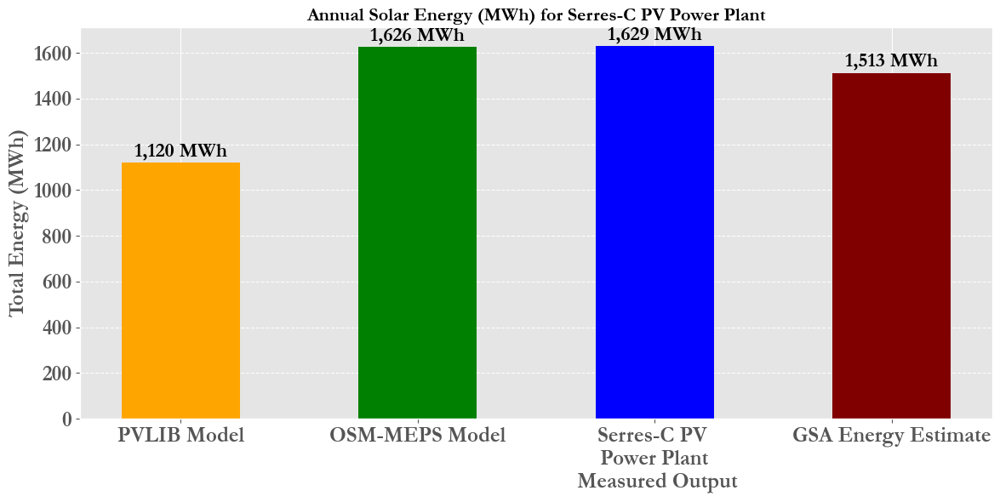

In [193]:
# === Plot Total Annual Energy of All Models in MWh with Slimmer Bars ===
total_pvlib = daily_energy_pvlib.sum() / 1000
total_epsm = daily_energy_epsm.sum() / 1000
total_pvoutput = pvoutput_actual['Generated_kWh'].sum() / 1000
total_gsa = gsa_df['Total_Monthly_kWh'].sum() / 1000

models = ['PVLIB Model', 'OSM-MEPS Model', 'Serres-C PV \n Power Plant \n Measured Output', 'GSA Energy Estimate']
totals = [total_pvlib, total_epsm, total_pvoutput, total_gsa]
colors = ['orange', 'green', 'blue', 'maroon']

plt.figure(figsize=(12, 6))
bars = plt.bar(models, totals, width=0.5, color=colors)  # Slimmer bars

# Annotate bar values in MWh
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval + 10, f'{yval:,.0f} MWh', ha='center', va='bottom', fontsize=17, fontweight='bold')

plt.title("Annual Solar Energy (MWh) for Serres-C PV Power Plant", fontsize=16, fontweight='bold')
plt.ylabel("Total Energy (MWh)", fontsize=18, fontweight='bold')
plt.xticks(fontsize=18, fontweight='bold')
plt.yticks(fontsize=18, fontweight='bold')
plt.grid(axis='y', linestyle='--', alpha=0.94)
plt.tight_layout()
plt.savefig("Total_Final_Annual_Energy_Comparison_Barplot_MWh.pdf", format='pdf')
plt.show()


In [153]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Load your three datasets (replace with actual loading if not already loaded)
# daily_energy_pvlib = pd.read_csv("pvlib_output.csv", index_col=0, parse_dates=True)
# daily_energy_epsm = pd.read_csv("epsm_output.csv", index_col=0, parse_dates=True)
# pvoutput_actual = pd.read_csv("pvoutput_actual.csv", index_col=0, parse_dates=True)

# 1. Ensure datetime indices and remove timezone
daily_energy_pvlib.index = pd.to_datetime(daily_energy_pvlib.index).tz_localize(None).date
daily_energy_epsm.index = pd.to_datetime(daily_energy_epsm.index).tz_localize(None).date
pvoutput_actual.index = pd.to_datetime(pvoutput_actual.index).date

# 2. Ensure Series (optional, if your data is DataFrame with single column)
daily_energy_pvlib = pd.Series(daily_energy_pvlib.values.flatten(), index=daily_energy_pvlib.index)
daily_energy_epsm = pd.Series(daily_energy_epsm.values.flatten(), index=daily_energy_epsm.index)
pvoutput_actual = pd.Series(pvoutput_actual.values.flatten(), index=pvoutput_actual.index)

# 3. Find common dates
common_dates = daily_energy_pvlib.index.intersection(pvoutput_actual.index)

# 4. Extract aligned values
y_true = pvoutput_actual.loc[common_dates]
y_pred_pvlib = daily_energy_pvlib.loc[common_dates]
y_pred_epsm = daily_energy_epsm.loc[common_dates]

# 5. Define error metric printer
def print_metrics(name, y_pred):
    print(f"\n{name} Model:")
    print("MAE :", mean_absolute_error(y_true, y_pred))
    print("RMSE:", np.sqrt(mean_squared_error(y_true, y_pred)))
    print("R²  :", r2_score(y_true, y_pred))

# 6. Show metrics
print_metrics("PVLIB", y_pred_pvlib)
print_metrics("OSM-MEPS", y_pred_epsm)



PVLIB Model:
MAE : 1400.7453914305922
RMSE: 1526.367206061307
R²  : 0.24147066190967748

OSM-MEPS Model:
MAE : 471.39788372387363
RMSE: 588.0554381395001
R²  : 0.8874123198484639
